In [1]:
import pandas as pd
import numpy as np
import data_helpers as dhp
import time
import parmap
import shutil
import pickle
import matplotlib.pyplot as plt
from IPython.display import display
from tqdm import tqdm
from datetime import datetime, timedelta
from scipy import stats
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

In [760]:
class Evaluate:
    @classmethod
    def RMSE(cls, x, y):
        x, y = np.array(x).reshape(-1), np.array(y).reshape(-1)
        return mean_squared_error(x, y) ** 0.5
    
    @classmethod
    def MAPE(cls, x, y):
        x, y = np.array(x).reshape(-1), np.array(y).reshape(-1)
        return np.mean(np.abs((y - x) / y)) * 100
    
    @classmethod
    def CORR(cls, x, y):
        x, y = np.array(x).reshape(-1), np.array(y).reshape(-1)
        return stats.pearsonr(x, y)[0]
    
    @classmethod
    def evaluate(cls, truth, prd, look_ahead):
        rmse, mape, corr = [], [], []
        for ahead in range(look_ahead):
            rmse.append(cls.RMSE(truth[ahead:len(prd)+ahead], prd[:, ahead]))
            mape.append(cls.MAPE(truth[ahead:len(prd)+ahead], prd[:, ahead]))
            corr.append(cls.CORR(truth[ahead:len(prd)+ahead], prd[:, ahead]))
        return rmse, mape, corr

In [81]:
def show_graph(truth, prd, look_ahead, val_size=None, test_size=None):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    
    ax1.plot(truth)
    for i, p in enumerate(prd):
        ax1.plot(range(i, i+look_ahead), p)
        
    ax2.plot(truth)
    for ahead in range(look_ahead):
        ax2.plot(range(ahead, len(prd)+ahead), 
                 [p[ahead] for p in prd], label='ahead:' + str(ahead))
    ax2.legend()
        
    if val_size is not None:
        ax1.axvline(x=val_size, c='k', ls='--')
        ax2.axvline(x=val_size, c='k', ls='--')
    if test_size is not None:
        ax1.axvline(x=test_size, c='k', ls='--')
        ax2.axvline(x=test_size, c='k', ls='--')
    plt.show()   

In [913]:
# CDC, KCDC, ASPREN load

CDC = pd.read_csv('./data/ILINet_CDC.csv', index_col=0)
KCDC = pd.read_csv('./data/influenza_KCDC.csv', index_col=0)
ASPREN = pd.read_csv('./data/ASPREN_AU.csv', index_col=0)

In [915]:
# CDC, KCDC, ASPREN normalization

# CDC

CDC_norm = pd.concat([s for c, s in CDC.items()], ignore_index=True)
CDC_norm = CDC_norm.dropna().values.reshape(-1,1)

CDC_scaler = MinMaxScaler()
# with open('./data/v2/CDC_scaler.pkl', 'rb') as f:
#     CDC_scaler = pickle.load(f)
CDC_scaler.fit(CDC_norm)
CDC_norm = np.array([l for c, l in CDC.items()]).T
CDC_norm = pd.DataFrame(CDC_scaler.transform(CDC_norm), 
                         columns=CDC.columns,
                         index=CDC.index)

# 53주차 값이 없는 경우 52주와 1주차의 평균으로 채움
CDC_norm.loc[53, CDC_norm.loc[53][CDC_norm.loc[53].isna()].index[:-1]] = (
    (CDC_norm.loc[52, CDC_norm.loc[53][CDC_norm.loc[53].isna()].index[:-1]].values +
    CDC_norm[[str(y) for y in np.int64(CDC_norm.loc[53][CDC_norm.loc[53].isna()].index[:-1].values) + 1]].loc[1].values) / 2
)

with open('./data/v2/CDC_scaler.pkl', 'wb') as f:
    pickle.dump(CDC_scaler, f)
    
# KCDC

KCDC_norm = pd.concat([s for c, s in KCDC.items()], ignore_index=True)
KCDC_norm = KCDC_norm.dropna().values.reshape(-1,1)

KCDC_scaler = MinMaxScaler()
with open('./data/v2/KCDC_scaler.pkl', 'rb') as f:
    KCDC_scaler = pickle.load(f)
KCDC_scaler.fit(KCDC_norm)
KCDC_norm = np.array([l for c, l in KCDC.items()]).T
KCDC_norm = pd.DataFrame(KCDC_scaler.transform(KCDC_norm), 
                         columns=KCDC.columns,
                         index=KCDC.index)

# 53주차 값이 없는 경우 52주와 1주차의 평균으로 채움
KCDC_norm.loc[53, KCDC_norm.loc[53][KCDC_norm.loc[53].isna()].index[:-1]] = (
    (KCDC_norm.loc[52, KCDC_norm.loc[53][KCDC_norm.loc[53].isna()].index[:-1]].values +
    KCDC_norm[[str(y) for y in np.int64(KCDC_norm.loc[53][KCDC_norm.loc[53].isna()].index[:-1].values) + 1]].loc[1].values) / 2
)

# with open('./data/v2/KCDC_scaler.pkl', 'wb') as f:
#     pickle.dump(KCDC_scaler, f)
    
# ASPREN

ASPREN_norm = pd.concat([s for c, s in ASPREN.items()], ignore_index=True)
ASPREN_norm = ASPREN_norm.dropna().values.reshape(-1,1)

ASPREN_scaler = MinMaxScaler()
with open('./data/v2/ASPREN_scaler.pkl', 'rb') as f:
    ASPREN_scaler = pickle.load(f)
ASPREN_scaler.fit(ASPREN_norm)
ASPREN_norm = np.array([l for c, l in ASPREN.items()]).T
ASPREN_norm = pd.DataFrame(ASPREN_scaler.transform(ASPREN_norm), 
                         columns=ASPREN.columns,
                         index=ASPREN.index)

# 53주차 값이 없는 경우 52주와 1주차의 평균으로 채움
ASPREN_norm.loc[53, ASPREN_norm.loc[53][ASPREN_norm.loc[53].isna()].index[:-1]] = (
    (ASPREN_norm.loc[52, ASPREN_norm.loc[53][ASPREN_norm.loc[53].isna()].index[:-1]].values +
    ASPREN_norm[[str(y) for y in np.int64(ASPREN_norm.loc[53][ASPREN_norm.loc[53].isna()].index[:-1].values) + 1]].loc[1].values) / 2
)

# with open('./data/v2/ASPREN_scaler.pkl', 'wb') as f:
#     pickle.dump(ASPREN_scaler, f)

In [418]:
# US trends, AU_trends, KR News/SNS/Trends load

US_trends = pd.read_csv('./data/v2/US_trends.csv', index_col=0)

AU_trends = pd.read_csv('./data/v2/AU_trends.csv', index_col=0)

KR_news = pd.read_csv('./data/v2/KR_news.csv', index_col=0)
KR_sns = pd.read_csv('./data/v2/KR_sns.csv', index_col=0)
KR_trends = pd.read_csv('./data/v2/KR_trends.csv', index_col=0)

In [420]:
# normalization

minmax_scaler = MinMaxScaler()

minmax_scaler.fit(US_trends[[c for c in US_trends.columns if c != 'weeks']])
US_trends_norm = pd.DataFrame(minmax_scaler.transform(US_trends[[c for c in US_trends.columns if c != 'weeks']]),
                              columns=[c for c in US_trends.columns if c != 'weeks'],
                              index=US_trends.index)
US_trends_norm.insert(loc=0, column='weeks', value=US_trends['weeks'])


minmax_scaler.fit(AU_trends[[c for c in AU_trends.columns if c != 'weeks']])
AU_trends_norm = pd.DataFrame(minmax_scaler.transform(AU_trends[[c for c in AU_trends.columns if c != 'weeks']]),
                              columns=[c for c in AU_trends.columns if c != 'weeks'],
                              index=AU_trends.index)
AU_trends_norm.insert(loc=0, column='weeks', value=AU_trends['weeks'])


minmax_scaler.fit(KR_news[[c for c in KR_news.columns if c != 'weeks']])
KR_news_norm = pd.DataFrame(minmax_scaler.transform(KR_news[[c for c in KR_news.columns if c != 'weeks']]),
                              columns=[c for c in KR_news.columns if c != 'weeks'],
                              index=KR_news.index)
KR_news_norm.insert(loc=0, column='weeks', value=KR_news['weeks'])

minmax_scaler.fit(KR_sns[[c for c in KR_sns.columns if c != 'weeks']])
KR_sns_norm = pd.DataFrame(minmax_scaler.transform(KR_sns[[c for c in KR_sns.columns if c != 'weeks']]),
                              columns=[c for c in KR_sns.columns if c != 'weeks'],
                              index=KR_sns.index)
KR_sns_norm.insert(loc=0, column='weeks', value=KR_sns['weeks'])

minmax_scaler.fit(KR_trends[[c for c in KR_trends.columns if c != 'weeks']])
KR_trends_norm = pd.DataFrame(minmax_scaler.transform(KR_trends[[c for c in KR_trends.columns if c != 'weeks']]),
                              columns=[c for c in KR_trends.columns if c != 'weeks'],
                              index=KR_trends.index)
KR_trends_norm.insert(loc=0, column='weeks', value=KR_trends['weeks'])

In [552]:
# lag load

US_trends_lag = pd.read_csv('./data/v2/US_trends_lag.csv', index_col=0)
AU_trends_lag = pd.read_csv('./data/v2/AU_trends_lag.csv', index_col=0)

KR_news_lag = pd.read_csv('./data/v2/KR_news_lag.csv', index_col=0)
KR_sns_lag = pd.read_csv('./data/v2/KR_sns_lag.csv', index_col=0)
KR_trends_lag = pd.read_csv('./data/v2/KR_trends_lag.csv', index_col=0)

In [883]:
# max lag load

US_trends_max_lag = pd.read_csv('./data/v2/US_trends_max_lag.csv', index_col=0)
AU_trends_max_lag = pd.read_csv('./data/v2/AU_trends_max_lag.csv', index_col=0)

KR_news_max_lag = pd.read_csv('./data/v2/KR_news_max_lag.csv', index_col=0)
KR_sns_max_lag = pd.read_csv('./data/v2/KR_sns_max_lag.csv', index_col=0)
KR_trends_max_lag = pd.read_csv('./data/v2/KR_trends_max_lag.csv', index_col=0)

In [431]:
from tensorflow.keras.layers import Input, LSTM, Attention, Dense, Concatenate, Average, TimeDistributed, LeakyReLU, Add, Bidirectional, Average
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.utils import plot_model
from tensorflow.keras.backend import clear_session
import tensorflow.keras.backend as K

In [884]:
class Multi_Encoder_v2(object):
    def __init__(self, mode='A',**kwargs):
        
        self.look_back = kwargs['look_back']
        self.look_ahead = kwargs['look_ahead']
        self.past_year_num = kwargs['past_year_num'] if 'past_year_num' in kwargs else 1
        self.news_word_num = kwargs['news_word_num'] if 'news_word_num' in kwargs else 1
        self.sns_word_num = kwargs['sns_word_num'] if 'sns_word_num' in kwargs else 1
        self.trend_word_num = kwargs['trend_word_num'] if 'trend_word_num' in kwargs else 1
        self.layer_size = kwargs['layer_size'] if 'layer_size' in kwargs else 128
        self.mode = mode # N: news , S: SNS , T: Trend , A: N+S+T
        
        
        ENC_LSTM_UNIT = self.layer_size
        DENSE_UNIT = self.layer_size
        
        print(ENC_LSTM_UNIT, DENSE_UNIT)
        
        # Encoder1
        enc1_inputs = Input(shape=(self.look_back, self.past_year_num+1), name='enc1_inputs')
        
        enc1_lstm1 = LSTM(ENC_LSTM_UNIT, return_state=True, return_sequences=True, name='enc1_lstm1')
        enc1_outputs1, enc1_h1, enc1_c1 = enc1_lstm1(enc1_inputs)
        
        # Encoder2
        # news
        enc2_news_inputs = Input(shape=(self.look_back, self.news_word_num), name='enc2_news_inputs')
        
        enc2_news_lstm1 = LSTM(ENC_LSTM_UNIT, return_state=True, return_sequences=True, name='enc2_news_lstm1')
        enc2_news_outputs1, enc2_news_h1, enc2_news_c1 = enc2_news_lstm1(enc2_news_inputs)
        
        enc2_news_outputs = Concatenate(axis=-1, name='enc2_news_outputs_concat')([enc1_outputs1, enc2_news_outputs1])
        
        enc2_news_states = [
            [Concatenate(name='enc2_news_h1')([enc1_h1, enc2_news_h1]), Concatenate(name='enc2_news_c1')([enc1_c1, enc2_news_c1])],
        ]
        
        # sns
        enc2_sns_inputs = Input(shape=(self.look_back, self.sns_word_num), name='enc2_sns_inputs')
        
        enc2_sns_lstm1 = LSTM(ENC_LSTM_UNIT, return_state=True, return_sequences=True, name='enc2_sns_lstm1')
        enc2_sns_outputs1, enc2_sns_h1, enc2_sns_c1 = enc2_sns_lstm1(enc2_sns_inputs)
        
        enc2_sns_outputs = Concatenate(axis=-1, name='enc2_sns_outputs_concat')([enc1_outputs1, enc2_sns_outputs1])
        
        enc2_sns_states = [
            [Concatenate(name='enc2_sns_h1')([enc1_h1, enc2_sns_h1]), Concatenate(name='enc2_sns_c1')([enc1_c1, enc2_sns_c1])],
        ]
        
        # trend
        enc2_trend_inputs = Input(shape=(self.look_back, self.trend_word_num), name='enc2_trend_inputs')
        
        enc2_trend_lstm1 = LSTM(ENC_LSTM_UNIT, return_state=True, return_sequences=True, name='enc2_trend_lstm1')
        enc2_trend_outputs1, enc2_trend_h1, enc2_trend_c1 = enc2_trend_lstm1(enc2_trend_inputs)
        
        enc2_trend_outputs = Concatenate(axis=-1, name='enc2_trend_outputs_concat')([enc1_outputs1, enc2_trend_outputs1])
        
        enc2_trend_states = [
            [Concatenate(name='enc2_trend_h1')([enc1_h1, enc2_trend_h1]), Concatenate(name='enc2_trend_c1')([enc1_c1, enc2_trend_c1])],
        ]
        
        # Decoder
        if mode == 'SG':
            enc2_news_states = [enc2_news_h1, enc2_news_c1]
            enc2_news_outputs = enc2_news_outputs1
            enc2_sns_states = [enc2_sns_h1, enc2_sns_c1]
            enc2_sns_outputs = enc2_sns_outputs1
            enc2_trend_states = [enc2_trend_h1, enc2_trend_c1]
            enc2_trend_outputs = enc2_trend_outputs1
            dec_lstm_unit = ENC_LSTM_UNIT
            
        else:
            enc2_news_states = enc2_news_states[0]
            enc2_sns_states = enc2_sns_states[0]
            enc2_trend_states = enc2_trend_states[0]
            dec_lstm_unit = ENC_LSTM_UNIT * 2
        
        
        # news
        dec_news_inputs = Input(shape=(None, self.news_word_num+1), name='dec_news_inputs')
        
        dec_news_lstm1 = LSTM(dec_lstm_unit, return_state=True, return_sequences=True, name='dec_news_lstm1')
        dec_news_outputs1, _, _ = dec_news_lstm1(dec_news_inputs, initial_state=enc2_news_states)
        
        dec_news_attn = Attention(name='dec_news_attn')([dec_news_outputs1, enc2_news_outputs])
        
        # sns
        dec_sns_inputs = Input(shape=(None, self.sns_word_num+1), name='dec_sns_inputs')
        
        dec_sns_lstm1 = LSTM(dec_lstm_unit, return_state=True, return_sequences=True, name='dec_sns_lstm1')
        dec_sns_outputs1, _, _ = dec_sns_lstm1(dec_sns_inputs, initial_state=enc2_sns_states)
        
        dec_sns_attn = Attention(name='dec_sns_attn')([dec_sns_outputs1, enc2_sns_outputs])
        
        # trend
        dec_trend_inputs = Input(shape=(None, self.trend_word_num+1), name='dec_trend_inputs')
        
        dec_trend_lstm1 = LSTM(dec_lstm_unit, return_state=True, return_sequences=True, name='dec_trend_lstm1')
        dec_trend_outputs1, _, _ = dec_trend_lstm1(dec_trend_inputs, initial_state=enc2_trend_states)
        
        dec_trend_attn = Attention(name='dec_trend_attn')([dec_trend_outputs1, enc2_trend_outputs])
        
        # concat & dense
        if mode == 'N':
            enc2_inputs = [enc2_news_inputs]
            enc2_outputs = enc2_news_outputs
            enc2_states = enc2_news_states
            dec_inputs = [dec_news_inputs]
            dec_attn_concat = dec_news_attn
            dec_lstm1 = dec_news_lstm1
        elif mode == 'S':
            enc2_inputs = [enc2_sns_inputs]
            enc2_outputs = enc2_sns_outputs
            enc2_states = enc2_sns_states
            dec_inputs = [dec_sns_inputs]
            dec_attn_concat = dec_sns_attn
            dec_lstm1 = dec_sns_lstm1
        elif mode == 'T':
            enc2_inputs = [enc2_trend_inputs]
            enc2_outputs = enc2_trend_outputs
            enc2_states = enc2_trend_states
            dec_inputs = [dec_trend_inputs]
            dec_attn_concat = dec_trend_attn
            dec_lstm1 = dec_trend_lstm1
        elif mode == 'NS':
            enc2_inputs = [enc2_news_inputs, enc2_sns_inputs]
            dec_inputs = [dec_news_inputs, dec_sns_inputs]
            dec_attn_concat = Concatenate(name='decattn_concat')([dec_news_attn, dec_sns_attn])
        elif mode == 'ST':
            enc2_inputs = [enc2_sns_inputs, enc2_trend_inputs]
            dec_inputs = [dec_sns_inputs, dec_trend_inputs]
            dec_attn_concat = Concatenate(name='decattn_concat')([dec_sns_attn, dec_trend_attn])
        elif mode == 'TN':
            enc2_inputs = [enc2_trend_inputs, enc2_news_inputs]
            dec_inputs = [dec_trend_inputs, dec_news_inputs]
            dec_attn_concat = Concatenate(name='decattn_concat')([dec_trend_attn, dec_news_attn])
        else:
            enc2_inputs = [enc2_news_inputs, enc2_sns_inputs, enc2_trend_inputs]
            enc2_outputs = [enc2_news_outputs, enc2_sns_outputs, enc2_trend_outputs]
            enc2_states = [enc2_news_states, enc2_sns_states, enc2_trend_states]
            dec_inputs = [dec_news_inputs, dec_sns_inputs, dec_trend_inputs]
            dec_attn_concat = Concatenate(name='decattn_concat')([dec_news_attn, dec_sns_attn, dec_trend_attn])
            
            
        dec_dense1 = TimeDistributed(Dense(DENSE_UNIT, name='dec_dense1'), name='dec_time1')
        dec_dense2 = TimeDistributed(Dense(1, name='dec_dense2'), name='dec_time2')
        leaky_relu = LeakyReLU(alpha=0.1)
        dec_ouputs = dec_dense1(dec_attn_concat)
        dec_ouputs = dec_dense2(dec_ouputs)
        dec_ouputs = leaky_relu(dec_ouputs)
        
        if mode == 'SG':
            model = Model([enc2_inputs, dec_inputs], dec_ouputs)
        else:
            model = Model([enc1_inputs, enc2_inputs, dec_inputs], dec_ouputs)
        
        model.compile(optimizer='adam', loss='mse')
        self.model = model
        
        if mode == 'A':
            dec_news_state_inputs = [
                Input(shape=(dec_lstm_unit,), name='dec_news_h_input'),
                Input(shape=(dec_lstm_unit,), name='dec_news_c_input')
            ]
            dec_sns_state_inputs = [
                Input(shape=(dec_lstm_unit,), name='dec_sns_h_input'),
                Input(shape=(dec_lstm_unit,), name='dec_sns_c_input')
            ]
            dec_trend_state_inputs = [
                Input(shape=(dec_lstm_unit,), name='dec_trend_h_input'),
                Input(shape=(dec_lstm_unit,), name='dec_trend_c_input')
            ]
            
            dec_news_hidden_inputs = Input(shape=(self.look_back, dec_lstm_unit), name='dec_news_hidden_input')
            dec_sns_hidden_inputs = Input(shape=(self.look_back, dec_lstm_unit), name='dec_sns_hidden_input')
            dec_trend_hidden_inputs = Input(shape=(self.look_back, dec_lstm_unit), name='dec_trend_hidden_input')
            
            dec_news_output2, dec_news_state_h, dec_news_state_c = dec_news_lstm1(
                dec_news_inputs, initial_state=dec_news_state_inputs
            )
            dec_sns_output2, dec_sns_state_h, dec_sns_state_c = dec_sns_lstm1(
                dec_sns_inputs, initial_state=dec_sns_state_inputs
            )
            dec_trend_output2, dec_trend_state_h, dec_trend_state_c = dec_trend_lstm1(
                dec_trend_inputs, initial_state=dec_trend_state_inputs
            )
            dec_news_attn2 = Attention(name='dec_news_attn2')([dec_news_output2, dec_news_hidden_inputs])
            dec_sns_attn2 = Attention(name='dec_sns_attn2')([dec_sns_output2, dec_sns_hidden_inputs])
            dec_trend_attn2 = Attention(name='dec_trend_attn2')([dec_trend_output2, dec_trend_hidden_inputs])
            
            dec_attn_concat2 = Concatenate(name='dec_attn_concat2')([
                dec_news_attn2, dec_sns_attn2, dec_trend_attn2
            ])
            dec_outputs2 = dec_dense1(dec_attn_concat2)
            dec_outputs2 = dec_dense2(dec_outputs2)
            dec_outputs2 = leaky_relu(dec_outputs2)
            
            dec_inputs = [dec_news_inputs, dec_sns_inputs, dec_trend_inputs]
            dec_hidden_inputs = [dec_news_hidden_inputs, dec_sns_hidden_inputs, dec_trend_hidden_inputs]
            
            self.decoder_model = Model([dec_news_inputs, dec_sns_inputs, dec_trend_inputs]
                                      + [dec_news_hidden_inputs, dec_sns_hidden_inputs, dec_trend_hidden_inputs]
                                      + [dec_news_state_inputs, dec_sns_state_inputs, dec_trend_state_inputs],
                                      [dec_outputs2] 
                                       + [[dec_news_state_h, dec_news_state_c],
                                          [dec_sns_state_h, dec_sns_state_c],
                                          [dec_trend_state_h, dec_trend_state_c]])
        else:
            dec_state_inputs = [
                Input(shape=(dec_lstm_unit,), name='dec_h_input'),
                Input(shape=(dec_lstm_unit,), name='dec_c_input')
            ]

            dec_hidden_inputs = Input(shape=(self.look_back, dec_lstm_unit), name='dec_hidden_input')

            dec_outputs2, dec_state_h, dec_state_c = dec_lstm1(dec_inputs[0],
                                                                initial_state=dec_state_inputs)
            dec_attn2 = Attention(name='dec_test_attn2')([dec_outputs2, dec_hidden_inputs])
            dec_outputs2 = dec_dense1(dec_attn2)
            dec_outputs2 = dec_dense2(dec_outputs2)
            dec_outputs2 = leaky_relu(dec_outputs2)
            
            self.decoder_model = Model([dec_inputs] + [dec_hidden_inputs] + dec_state_inputs,
                                   [dec_outputs2] + [dec_state_h, dec_state_c])
        
        self.encoder_model = Model([enc1_inputs, enc2_inputs], [enc2_outputs] + enc2_states)
    
    def fit(self, x, y, val_x, val_y, epochs=10, batch_size=32, callbacks=None, verbose=1):
        history = self.model.fit(x, y, epochs=epochs, batch_size=batch_size,
                                validation_data=(val_x, val_y), callbacks=callbacks,
                                verbose=verbose)
        return history
    
    def load_model(self, model_path=None):
        self.model = load_model(model_path)
        
        self.encoder_model.get_layer('enc1_lstm1').set_weights(
            self.model.get_layer('enc1_lstm1').get_weights())
        self.decoder_model.get_layer('dec_time1').set_weights(
            self.model.get_layer('dec_time1').get_weights())
        self.decoder_model.get_layer('dec_time2').set_weights(
            self.model.get_layer('dec_time2').get_weights())
        
        if self.mode == 'N':
            web_types = ['news']
        elif self.mode == 'S':
            web_types = ['sns']
        elif self.mode == 'T':
            web_types = ['trend']
        else:
            web_types = ['news', 'sns', 'trend']
        
        for target_name in web_types:
            self.encoder_model.get_layer('enc2_' + target_name + '_lstm1').set_weights(
                self.model.get_layer('enc2_' + target_name + '_lstm1').get_weights())
            self.decoder_model.get_layer('dec_' + target_name + '_lstm1').set_weights(
                self.model.get_layer('dec_' + target_name + '_lstm1').get_weights())
            
        
    def transform_data(self, truth, news_data, sns_data, trends_data, 
                       news_lag, sns_lag, trends_lag,
                       year_week, look_back, look_ahead):
        
        def _ground_truth(week, year, look_ahead):
            week = int(week)
            max_week = 52
            if week+look_ahead-1 > max_week:
                tmp1 = truth.loc[week:max_week, '20'+year]
                tmp2 = truth.loc[1:look_ahead-max_week+week-1, '20'+str(int(year)+1)]
                ground_truth = pd.concat((tmp1, tmp2))
            else:
                ground_truth = truth.loc[week:week+look_ahead-1, '20'+year]
            return ground_truth.values.reshape(-1, 1)
        
        def _encoder1(year, week, look_back):
            week = int(week)
            if week > look_back:
                tmp1 = truth.loc[week-look_back:week-1,
                                               [str(y) for y in range(2011, 2017)]]
                tmp2 = truth.loc[week-look_back:week-1, '20'+year]
                encoder1_input = pd.concat((tmp1, tmp2), axis=1)
            else:
                max_week = 52
                tmp1 = truth.loc[max_week-look_back+week:max_week,
                                     [str(y) for y in range(2010, 2016)]]
                tmp2 = truth.loc[:week-1,
                                     [str(y) for y in range(2011, 2017)]]
                tmp2.columns = [str(y) for y in range(2010, 2016)]
                tmp2 = pd.concat((tmp1, tmp2))

                tmp3 = truth.loc[max_week-look_back+week:max_week, '20'+str(int(year)-1)]
                tmp4 = truth.loc[:week-1, '20'+year]
                tmp4.columns = [['20'+str(int(year)-1)]]
                tmp4 = pd.concat((tmp3, tmp4))
                encoder1_input = pd.concat((tmp2, tmp4), axis=1)
            return encoder1_input.values
        
        def _encoder2(year_week, look_back):
            if self.mode == 'N':
                web_data = [news_data]
                web_lag = [news_lag]
            elif self.mode == 'S':
                web_data = [sns_data]
                web_lag = [sns_lag]
            elif self.mode == 'T':
                web_data = [trends_data]
                web_lag = [trends_lag]
            else:
                web_data = [news_data, sns_data, trends_data]
                web_lag = [news_lag, sns_lag, trends_lag]
            

            encoder2_input = []
            for data, lag_df in zip(web_data, web_lag):
                tmp = []
                for w in lag_df.columns:
                    lag = int(lag_df[w]['max_lag'])
                    origin_point = data[data['weeks'] == year_week].index[0]
                    start_point = origin_point-lag-look_back
                    end_point = start_point+look_back-1

                    tmp.append(
                            data.loc[start_point:end_point, w].apply(
                            lambda x: np.random.uniform(1e-6, 1e-4) if x == 0 else x).tolist())
                tmp = np.array(tmp).T
                encoder2_input.append(tmp)
            if len(encoder2_input) == 1:
                encoder2_input = tmp
                
            return encoder2_input
        
        def _decoder(year_week, look_ahead):
            year, week = year_week.split('-')
            max_week = 52
            week = int(week)
            if week > 1:
                week = week - 1
            else:
                week = 52
                year = str(int(year) - 1)

            if week+look_ahead-1 > max_week:
                tmp1 = truth.loc[week:max_week, '20'+year]
                tmp2 = truth.loc[1:look_ahead-max_week+week-1, '20'+str(int(year)+1)]
                ground_truth = pd.concat((tmp1, tmp2))
            else:
                ground_truth = truth.loc[week:week+look_ahead-1, '20'+year]

            ground_truth = ground_truth.values.reshape(-1, 1)
            
            if self.mode == 'N':
                web_data = [news_data]
                web_lag = [news_lag]
            elif self.mode == 'S':
                web_data = [sns_data]
                web_lag = [sns_lag]
            elif self.mode == 'T':
                web_data = [trends_data]
                web_lag = [trends_lag]
            else:
                web_data = [news_data, sns_data, trends_data]
                web_lag = [news_lag, sns_lag, trends_lag]
            
            decoder_input = []
            
            for data, lag_df in zip(web_data, web_lag):
                tmp = []
                for i, w in enumerate(list(lag_df.columns)):
                    lag = int(lag_df[w]['max_lag'])
                    origin_point = data[data['weeks'] == year_week].index[0]
                    start_point = origin_point-lag
                    end_point = start_point+look_ahead-1 if lag >= look_ahead else origin_point

                    target_list = data.loc[start_point:end_point, w].tolist()
                    random_pad = np.random.uniform(1e-6, 1e-4, (look_ahead,))
                    for idx in range(len(target_list)):
                        if target_list[idx] == 0:
                            continue
                        random_pad[idx] = target_list[idx]

                    tmp.append(random_pad)
                tmp = np.array(tmp).T
                tmp = np.concatenate([tmp, ground_truth], axis=-1)
                decoder_input.append(tmp)
            if len(decoder_input) == 1:
                decoder_input = tmp
            
            return decoder_input
        
        year, week = year_week.split('-')
        ground_truth = _ground_truth(week, year, look_ahead)
        encoder1_input = _encoder1(year, week, look_back)
        encoder2_input = _encoder2(year_week, look_back)
        decoder_input = _decoder(year_week, look_ahead)      

        return encoder1_input, encoder2_input, decoder_input, ground_truth    
                
        
    def generate_data(self, truth, available_weeks, look_back, look_ahead,
                      news_data=None, sns_data=None, trends_data=None,
                      news_lag=None, sns_lag=None, trends_lag=None,
                      val_split_size=0.8, test_split_size=0.8):
        
        test_size = int(len(available_weeks) * test_split_size)
        val_size = int(test_size * val_split_size)
        
        enc1_inputs = []
        enc2_inputs = []
        dec_inputs = []
        ground_truth = []
        
        enc2_news_inputs = []
        enc2_sns_inputs = []
        enc2_trend_inputs = []
        dec_news_inputs = []
        dec_sns_inputs = []
        dec_trend_inputs = []
        
        for aw in available_weeks:
            e1, e2, d, gt = self.transform_data(truth, 
                                                news_data, sns_data, trends_data,
                                                news_lag, sns_lag, trends_lag,
                                                aw, look_back, look_ahead)
            
            enc1_inputs.append(e1)
            ground_truth.append(gt)
            
            if self.mode == 'A':
                enc2_news_inputs.append(e2[0])
                enc2_sns_inputs.append(e2[1])
                enc2_trend_inputs.append(e2[2])
                dec_news_inputs.append(d[0])
                dec_sns_inputs.append(d[1])
                dec_trend_inputs.append(d[2])
            else:
                enc2_inputs.append(e2)
                dec_inputs.append(d)
            
            
        if self.mode == 'A':
            x = [enc1_inputs,
                 enc2_news_inputs, enc2_sns_inputs, enc2_trend_inputs,
                 dec_news_inputs, dec_sns_inputs, dec_trend_inputs]
        else:
            x = [enc1_inputs, enc2_inputs, dec_inputs]
        
        x_total = [np.array(e) for e in x]
        x_train = [np.array(e[:val_size]) for e in x]
        x_val = [np.array(e[val_size:test_size]) for e in x]
        x_test = [np.array(e[test_size:]) for e in x]

        y = np.array(ground_truth)
        y_train = y[:val_size]
        y_val = y[val_size:test_size]
        y_test = y[test_size:]

        return [x_train, x_val, x_test, x_total], [y_train, y_val, y_test], val_size, test_size
            

In [524]:
class Basic_LSTM():
    def __init__(self, **kwargs):
        LSTM_UNIT = 64
        DENSE_UNIT = 64
        
        self.look_back = kwargs['look_back']
        self.look_ahead = kwargs['look_ahead']
        
        inputs = Input(shape=(self.look_back, 1), name='input1')
        lstm1 = LSTM(LSTM_UNIT, return_state=True, name='lstm1')
        dense1 = Dense(DENSE_UNIT, name='dense1')
        dense2 = Dense(1)
        leaky_relu = LeakyReLU(alpha=0.1)
        
        outputs, _, _ = lstm1(inputs)
        outputs = dense1(outputs)
        outputs = dense2(outputs)
        outputs = leaky_relu(outputs)
        
        model = Model([inputs], outputs)
        model.compile(optimizer='adam', loss='mse')
        self.model = model
        
    def fit(self, x, y, val_x, val_y, epochs=10, batch_size=32, callbacks=None, verbose=1):
        history = self.model.fit(x, y, epochs=epochs, batch_size=batch_size,
                                validation_data=(val_x, val_y), callbacks=callbacks,
                                verbose=verbose)
        return history
    
    def load_model(self, model_path=None):
        self.model = load_model(model_path)
        
    def transform_data(self, truth, year_week, look_back, look_ahead):
        def _ground_truth(week, year, look_ahead):
            week = int(week)
            max_week = 52
            if week+look_ahead-1 > max_week:
                tmp1 = truth.loc[week:max_week, '20'+year]
                tmp2 = truth.loc[1:look_ahead-max_week+week-1, '20'+str(int(year)+1)]
                ground_truth = pd.concat((tmp1, tmp2))
            else:
                ground_truth = truth.loc[week:week+look_ahead-1, '20'+year]
            return ground_truth.values.reshape(-1, 1)
        
        def _inputs(year, week, look_back):
            week = int(week)
            if week > look_back:
                inputs = truth.loc[week-look_back:week-1, '20'+year]
            else:
                max_week = 52
                tmp1 = truth.loc[max_week-look_back+week:max_week, '20'+str(int(year)-1)]
                tmp2 = truth.loc[:week-1, '20'+year]
                tmp2.columns = [['20'+str(int(year)-1)]]
                inputs = pd.concat((tmp1, tmp2))
            return inputs.values.reshape(-1, 1)
        
        year, week = year_week.split('-')
        ground_truth = _ground_truth(week, year, look_ahead)
        inputs = _inputs(year, week, look_back)
        
        return inputs, ground_truth
    
    def generate_data(self, truth, available_weeks, look_back, look_ahead,
                      val_split_size=0.8, test_split_size=0.8):
        
        test_size = int(len(available_weeks) * test_split_size)
        val_size = int(test_size * val_split_size)
        
        ground_truth = []
        inputs = []
        
        for aw in available_weeks:
            i, gt = self.transform_data(truth, aw, look_back, look_ahead)
            inputs.append(i)
            ground_truth.append(gt)
        
        x = [inputs]
        
        x_total = [np.array(e) for e in x]
        x_train = [np.array(e[:val_size]) for e in x]
        x_val = [np.array(e[val_size:test_size]) for e in x]
        x_test = [np.array(e[test_size:]) for e in x]

        y = np.array(ground_truth)
        y_train = y[:val_size]
        y_val = y[val_size:test_size]
        y_test = y[test_size:]

        return [x_train, x_val, x_test, x_total], [y_train, y_val, y_test], val_size, test_size            

In [525]:
class DEFSI():
    def __init__(self, **kwargs):
        LSTM_UNIT = 64
        DENSE_UNIT = 64
        
        self.look_back = kwargs['look_back']
        self.look_ahead = kwargs['look_ahead']
        
        x1 = Input(shape=(self.look_back, 1), name='x1')
        left_lstm1 = LSTM(LSTM_UNIT, return_sequences=True, return_state=True, name='left_lstm1')
        left_lstm2 = LSTM(LSTM_UNIT, return_state=True, name='left_lstm2')
        left_dense1 = Dense(DENSE_UNIT, name='left_dense1')
        
        left_outputs, _, _ = left_lstm1(x1)
        left_outputs, _, _ = left_lstm2(left_outputs)
        left_outputs = left_dense1(left_outputs)
        
        x2 = Input(shape=(self.look_back, 1), name='x2')
        right_lstm1 = LSTM(LSTM_UNIT, return_state=True, name='right_lsmt1')
        right_dense1 = Dense(DENSE_UNIT, )
        
        right_outputs, _, _ = right_lstm1(x2)
        right_outputs = right_dense1(right_outputs)
        
        merge = Average(name='merge')([left_outputs, right_outputs])
        merge_dense = Dense(1, name='merge_dense')
        outputs = merge_dense(merge)
        
        model = Model([x1, x2], outputs)
        model.compile(optimizer='adam', loss='mse')
        
        self.model = model
    
    def fit(self, x, y, val_x, val_y, epochs=10, batch_size=32, callbacks=None, verbose=1):
        history = self.model.fit(x, y, epochs=epochs, batch_size=batch_size,
                                validation_data=(val_x, val_y), callbacks=callbacks,
                                verbose=verbose)
        return history
    
    def load_model(self, model_path=None):
        self.model = load_model(model_path)
        
    def transform_data(self, truth, year_week, look_back, look_ahead):
        def _ground_truth(week, year, look_ahead):
            week = int(week)
            max_week = 52
            if week+look_ahead-1 > max_week:
                tmp1 = truth.loc[week:max_week, '20'+year]
                tmp2 = truth.loc[1:look_ahead-max_week+week-1, '20'+str(int(year)+1)]
                ground_truth = pd.concat((tmp1, tmp2))
            else:
                ground_truth = truth.loc[week:week+look_ahead-1, '20'+year]
            return ground_truth.values.reshape(-1, 1)
        
        def _inputs(year, week, look_back):
            week = int(week)
            if week > look_back:
                x1 = truth.loc[week-look_back:week-1, '20'+year]
                x2 = truth.loc[week-look_back:week-1, '20'+str(int(year)-1)]
                inputs = [x1.values.reshape(-1, 1), x2.values.reshape(-1, 1)]
            else:
                max_week = 52
                tmp1 = truth.loc[max_week-look_back+week:max_week, '20'+str(int(year)-1)]
                tmp2 = truth.loc[:week-1, '20'+year]
                tmp2.columns = [['20'+str(int(year)-1)]]
                x1 = pd.concat((tmp1, tmp2)).values

                tmp3 = truth.loc[max_week-look_back+week:max_week, '20'+str(int(year)-2)]
                tmp4 = truth.loc[:week-1, '20'+str(int(year)-1)]
                tmp4.columns = [['20'+str(int(year)-2)]]
                x2 = pd.concat((tmp3, tmp4)).values
                inputs = [x1.reshape(-1, 1), x2.reshape(-1, 1)]
            return inputs
        
        year, week = year_week.split('-')
        ground_truth = _ground_truth(week, year, look_ahead)
        inputs = _inputs(year, week, look_back)
        
        return inputs, ground_truth
    
    def generate_data(self, truth, available_weeks, look_back, look_ahead,
                      val_split_size=0.8, test_split_size=0.8):
        
        test_size = int(len(available_weeks) * test_split_size)
        val_size = int(test_size * val_split_size)
        
        ground_truth = []
        x1 = []
        x2 = []
        
        for aw in available_weeks:
            i, gt = self.transform_data(truth, aw, look_back, look_ahead)
            x1.append(i[0])
            x2.append(i[1])
            ground_truth.append(gt)
        
        x = [x1, x2]
        
        x_total = [np.array(e) for e in x]
        x_train = [np.array(e[:val_size]) for e in x]
        x_val = [np.array(e[val_size:test_size]) for e in x]
        x_test = [np.array(e[test_size:]) for e in x]

        y = np.array(ground_truth)
        y_train = y[:val_size]
        y_val = y[val_size:test_size]
        y_test = y[test_size:]

        return [x_train, x_val, x_test, x_total], [y_train, y_val, y_test], val_size, test_size 

In [242]:
class Seq2Seq():
    def __init__(self, **kwargs):
        ENC_LSTM_UNIT = 64
        DEC_LSTM_UNIT = 128
        DROPOUT = 0.2
        
        self.look_back = kwargs['look_back']
        self.look_ahead = kwargs['look_ahead']
        
        enc_inputs = Input(shape=(self.look_back, 1), name='enc_input')
        enc_lstm1 = Bidirectional(LSTM(ENC_LSTM_UNIT, return_sequences=True, return_state=True,
                                       dropout=DROPOUT, name='enc_lstm1'), name='enc_bilstm1')
        enc_lstm2 = Bidirectional(LSTM(ENC_LSTM_UNIT, return_sequences=True, return_state=True,
                                       dropout=DROPOUT, name='enc_lstm2'), name='enc_bilstm2')
        enc_lstm3 = Bidirectional(LSTM(ENC_LSTM_UNIT, return_sequences=True, return_state=True,
                                       dropout=DROPOUT, name='enc_lstm3'), name='enc_bilstm3')
        enc_outputs, _, _, _, _ = enc_lstm1(enc_inputs)
        enc_outputs, _, _, _, _ = enc_lstm2(enc_outputs)
        enc_outputs, fh, fc, bh, bc = enc_lstm3(enc_outputs)
        
        state_h = Concatenate(name='enc_h_concat')([fh, bh])
        state_c = Concatenate(name='enc_c_concat')([fc, bc])
        
        dec_inputs = Input(shape=(None, 1), name='dec_input')
        dec_lstm1 = LSTM(DEC_LSTM_UNIT, return_sequences=True, return_state=True,
                         dropout=DROPOUT, name='dec_lstm1')
        dec_outputs, _, _ = dec_lstm1(dec_inputs, initial_state=[state_h, state_c])
        
        dec_attn = Attention(name='dec_attn')([dec_outputs, enc_outputs])
        dec_concat = Concatenate(name='dec_concat')([dec_outputs, dec_attn])
        dec_dense1 = TimeDistributed(Dense(1, name='dense1'), name='time1')
        outputs = dec_dense1(dec_concat)
        
        model = Model([enc_inputs, dec_inputs], outputs)
        model.compile(optimizer='adam', loss='mse')
        
        self.model = model
        
        dec_state_inputs = [
            Input(shape=(DEC_LSTM_UNIT,), name='dec_h_input'),
            Input(shape=(DEC_LSTM_UNIT,), name='dec_c_input')
        ]
        dec_hidden_inputs = Input(shape=(self.look_back, DEC_LSTM_UNIT), name='dec_hidden_input')
        
        dec_outputs2, dec_state_h, dec_state_c = dec_lstm1(dec_inputs, 
                                                          initial_state=dec_state_inputs)
        dec_attn2 = Attention(name='dec_test_attn2')([dec_outputs2, dec_hidden_inputs])
        dec_concat2 = Concatenate(name='dec_test_concat2')([dec_outputs2, dec_attn2])
        dec_outputs2 = dec_dense1(dec_concat2)
        
        self.encoder_model = Model(enc_inputs, [enc_outputs, state_h, state_c])
        self.decoder_model = Model([dec_inputs] + [dec_hidden_inputs] + dec_state_inputs,
                                   [dec_outputs2] + [dec_state_h, dec_state_c])
        
    def fit(self, x, y, val_x, val_y, epochs=10, batch_size=32, callbacks=None, verbose=1):
        history = self.model.fit(x, y, epochs=epochs, batch_size=batch_size,
                                validation_data=(val_x, val_y), callbacks=callbacks,
                                verbose=verbose)
        return history
    
    def load_model(self, model_path=None):
        self.model = load_model(model_path)
        
        self.encoder_model.get_layer('enc_bilstm1').set_weights(
            self.model.get_layer('enc_bilstm1').get_weights())
        self.encoder_model.get_layer('enc_bilstm2').set_weights(
            self.model.get_layer('enc_bilstm2').get_weights())
        self.encoder_model.get_layer('enc_bilstm3').set_weights(
            self.model.get_layer('enc_bilstm3').get_weights())
        self.decoder_model.get_layer('dec_lstm1').set_weights(
            self.model.get_layer('dec_lstm1').get_weights())
        self.decoder_model.get_layer('time1').set_weights(
            self.model.get_layer('time1').get_weights())  
        
    def transform_data(self, truth, year_week, look_back, look_ahead):
        def _ground_truth(week, year, look_ahead):
            week = int(week)
            max_week = 52
            if week+look_ahead-1 > max_week:
                tmp1 = truth.loc[week:max_week, '20'+year]
                tmp2 = truth.loc[1:look_ahead-max_week+week-1, '20'+str(int(year)+1)]
                ground_truth = pd.concat((tmp1, tmp2))
            else:
                ground_truth = truth.loc[week:week+look_ahead-1, '20'+year]
            return ground_truth.values.reshape(-1, 1)
        
        def _inputs(year, week, look_back):
            week = int(week)
            if week > look_back:
                inputs = truth.loc[week-look_back:week-1, '20'+year]
            else:
                max_week = 52
                tmp1 = truth.loc[max_week-look_back+week:max_week, '20'+str(int(year)-1)]
                tmp2 = truth.loc[:week-1, '20'+year]
                tmp2.columns = [['20'+str(int(year)-1)]]
                inputs = pd.concat((tmp1, tmp2))
            return inputs.values.reshape(-1, 1)
        
        year, week = year_week.split('-')
        ground_truth = _ground_truth(week, year, look_ahead)
        inputs = _inputs(year, week, look_back)
        inputs = [inputs, np.concatenate([inputs[-1, :].reshape(-1, 1), ground_truth[:-1, :]])]
        
        return inputs, ground_truth        
    
    def generate_data(self, truth, available_weeks, look_back, look_ahead,
                      val_split_size=0.8, test_split_size=0.8):
        
        test_size = int(len(available_weeks) * test_split_size)
        val_size = int(test_size * val_split_size)
        
        ground_truth = []
        enc_inputs = []
        dec_inputs = []
        
        for aw in available_weeks:
            i, gt = self.transform_data(truth, aw, look_back, look_ahead)
            enc_inputs.append(i[0])
            dec_inputs.append(i[1])
            ground_truth.append(gt)
        
        x = [enc_inputs, dec_inputs]
        
        x_total = [np.array(e) for e in x]
        x_train = [np.array(e[:val_size]) for e in x]
        x_val = [np.array(e[val_size:test_size]) for e in x]
        x_test = [np.array(e[test_size:]) for e in x]

        y = np.array(ground_truth)
        y_train = y[:val_size]
        y_val = y[val_size:test_size]
        y_test = y[test_size:]

        return [x_train, x_val, x_test, x_total], [y_train, y_val, y_test], val_size, test_size 

In [934]:
# Hyper parameter

look_back = 8
look_ahead = 10
past_year_num = 6

max_lag = 14
collect_err = 22

test_split_size = 0.65
val_split_size = 0.8

epochs = 300
batch_size = 32

mode: ME-T(US)
128 128
val size: 46 test_size: 58


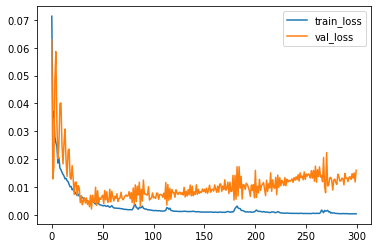

113 ./models/v2/US_me_T_lb8_best.h5
128 128


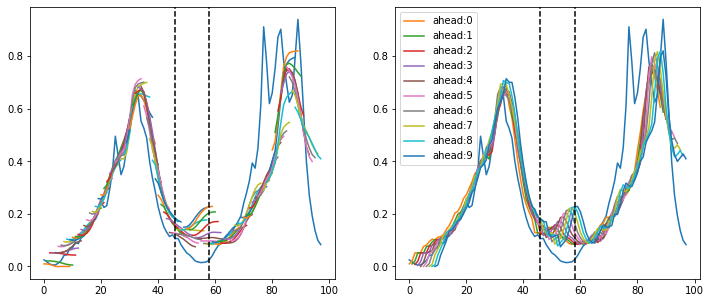

In [917]:
# US_trends MEDIF 적용

US_perform_by_model = {}
US_prd_by_model = {}

mode = 'T'

mode_name = 'ME-' + mode + '(US)'
US_perform_by_model[mode_name] = {}
print('mode:', mode_name)
clear_session()

trend_word_num = len(US_trends_max_lag.columns)

me = Multi_Encoder_v2(look_back=look_back, look_ahead=look_ahead,
                      past_year_num=6,
                      trend_word_num=trend_word_num,
                      mode=mode)

available_weeks = US_trends_norm['weeks'].values[collect_err+max_lag+look_back:-look_ahead+1]
x, y, val_size, test_size = me.generate_data(CDC_norm, available_weeks,
                                             look_back, look_ahead,
                                             test_split_size=test_split_size,
                                             val_split_size=val_split_size,
                                             trends_data=US_trends_norm,
                                             trends_lag=US_trends_max_lag)

x_train, x_val, x_test, x_total = x
y_train, y_val, y_test = y

print('val size:', val_size, 'test_size:', test_size)

cp = ModelCheckpoint('./models/v2/me_{epoch}.h5')

history = me.fit(x_train, y_train, x_val, y_val, epochs=epochs, batch_size=batch_size,
                  callbacks=[cp], verbose=0)

plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.legend()
plt.show()

min_epoch = 100
target_epoch = min_epoch + history.history['val_loss'][min_epoch:].index(
                                min(history.history['val_loss'][min_epoch:]))
best_path = './models/v2/US_me_' + mode + '_lb' + str(look_back) + '_best.h5'
print(target_epoch, best_path)
shutil.copy('./models/v2/me_' + str(target_epoch) + '.h5', best_path)


test_me = Multi_Encoder_v2(look_back=look_back, look_ahead=look_ahead,
                          past_year_num=past_year_num,
                          trend_word_num=trend_word_num,
                          mode=mode)
test_me.load_model(best_path)

start_week = int(available_weeks[0].split('-')[1])
end_week = int(available_weeks[-1].split('-')[1])
target_truth = (CDC_norm.loc[start_week:52, '2018'].tolist() + CDC_norm.loc[:52, '2019'].tolist()
                + CDC_norm.loc[:end_week+look_ahead-1, '2020'].tolist())

prd_total = []

for target_idx in range(90-1):

    enc_out, enc_h, enc_c = test_me.encoder_model.predict([x_total[0][target_idx:target_idx+1],
                                                          x_total[1][target_idx:target_idx+1]])

    dec_input = x_total[2][target_idx, 0, :].reshape(1, 1, x_total[2].shape[2])
    tmp = []
    for ahead in range(look_ahead):
        prd, dec_h, dec_c = test_me.decoder_model.predict([dec_input] + [enc_out, enc_h, enc_c])
        prd_val = prd[0, 0, 0]
        if prd_val > 0:
            tmp.append([prd_val])
        else:
            tmp.append([np.random.uniform(1e-6, 1e-5)])

        if ahead < look_ahead - 1:
            dec_input = x_total[2][target_idx, ahead+1, :].reshape(1, 1, x_total[2].shape[2])
            dec_input[0, 0, -1] = prd_val
        enc_h, enc_c = dec_h, dec_c
    prd_total.append(tmp)
prd_total = np.array(prd_total)
US_prd_by_model[mode_name] = prd_total

show_graph(target_truth, prd_total, look_ahead, val_size, test_size)
prd_train = prd_total[:val_size]
prd_val = prd_total[val_size:test_size]
prd_test = prd_total[test_size:]

inverse_target_truth = CDC_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1))
inverse_prd_total = np.array([CDC_scaler.inverse_transform(_) for _ in prd_total])

rmse_total, mape_total, corr_total = Evaluate.evaluate(inverse_target_truth, 
                                                       inverse_prd_total, look_ahead)
rmse_train, mape_train, corr_train = Evaluate.evaluate(inverse_target_truth[:val_size+look_ahead], 
                                                       inverse_prd_total[:val_size], look_ahead)
rmse_val, mape_val, corr_val = Evaluate.evaluate(inverse_target_truth[val_size:test_size+look_ahead],
                                                 inverse_prd_total[val_size:test_size], look_ahead)
rmse_test, mape_test, corr_test = Evaluate.evaluate(inverse_target_truth[test_size:],
                                                    inverse_prd_total[test_size:], look_ahead)

for ahead in range(look_ahead):
    ah = str(ahead+1)
    US_perform_by_model[mode_name]['total_rmse_' + ah] = rmse_total[ahead]
    US_perform_by_model[mode_name]['total_mape_' + ah] = mape_total[ahead]
    US_perform_by_model[mode_name]['total_corr_' + ah] = corr_total[ahead]

    US_perform_by_model[mode_name]['train_rmse_' + ah] = rmse_train[ahead]
    US_perform_by_model[mode_name]['train_mape_' + ah] = mape_train[ahead]
    US_perform_by_model[mode_name]['train_corr_' + ah] = corr_train[ahead]

    US_perform_by_model[mode_name]['val_rmse_' + ah] = rmse_val[ahead]
    US_perform_by_model[mode_name]['val_mape_' + ah] = mape_val[ahead]
    US_perform_by_model[mode_name]['val_corr_' + ah] = corr_val[ahead]

    US_perform_by_model[mode_name]['test_rmse_' + ah] = rmse_test[ahead]
    US_perform_by_model[mode_name]['test_mape_' + ah] = mape_test[ahead]
    US_perform_by_model[mode_name]['test_corr_' + ah] = corr_test[ahead]

Basic-LSTM(US)


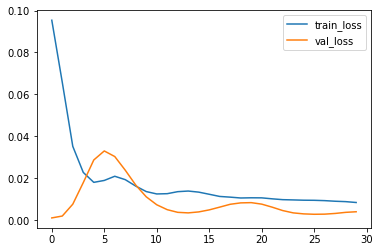

25 ./models/v2/US_basic_lstm_best.h5


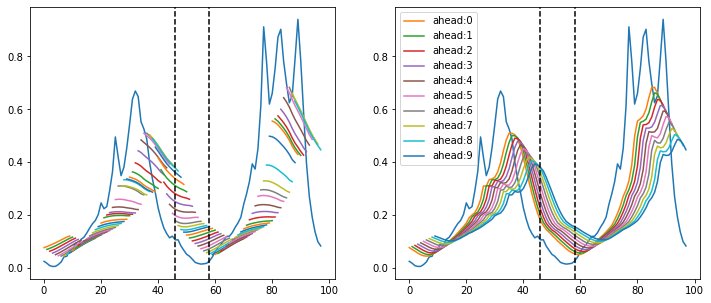

In [918]:
## Basic_LSTM

epochs = 30

# US_perform_by_model = {}
mode_name = 'Basic-LSTM(US)'
US_perform_by_model[mode_name] = {}
print(mode_name)
clear_session()

basic_lstm = Basic_LSTM(look_back=look_back, look_ahead=look_ahead)
available_weeks = US_trends_norm['weeks'].values[collect_err+max_lag+look_back:-look_ahead+1]

x, y, val_size, test_size = basic_lstm.generate_data(CDC_norm, available_weeks,
                                                  look_back, 1, 
                                                  test_split_size=test_split_size,
                                                  val_split_size=val_split_size)
x_train, x_val, x_test, x_total = x
y_train, y_val, y_test = y

cp = ModelCheckpoint('./models/v2/basic_lstm_{epoch}.h5')

history = basic_lstm.fit(x_train, y_train, x_val, y_val, epochs=epochs, batch_size=batch_size,
                  callbacks=[cp], verbose=0)

plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.legend()
plt.show()

min_epoch = 10
target_epoch = min_epoch + history.history['val_loss'][min_epoch:].index(
                                min(history.history['val_loss'][min_epoch:]))
best_path = './models/v2/US_basic_lstm_best.h5'
print(target_epoch, best_path)
shutil.copy('./models/v2/basic_lstm_' + str(target_epoch) + '.h5', best_path)

test_basic_lstm = Basic_LSTM(look_back=look_back, look_ahead=look_ahead)
test_basic_lstm.load_model(best_path)

start_week = int(available_weeks[0].split('-')[1])
end_week = int(available_weeks[-1].split('-')[1])
target_truth = (CDC_norm.loc[start_week:52, '2018'].tolist() + CDC_norm.loc[:52, '2019'].tolist()
                + CDC_norm.loc[:end_week+look_ahead-1, '2020'].tolist())


prd_total = []
for target_idx in range(90-1):    
    tmp = []
    for i in range(look_ahead):
        if i == 0:
            left_shift = np.array([x_total[0][target_idx]])
        else:
            left_shift = np.roll(left_shift, -1)
            left_shift[:, -1, :] = tmp[-1]
        prd = test_basic_lstm.model.predict(left_shift)[0, 0]
        prd = np.random.uniform(1e-6, 1e-5) if prd < 0 else prd
        prd = 1.0 - np.random.uniform(1e-6, 1e-5) if prd > 1 else prd
        tmp.append(prd)
#     print(left_shift)
#     print(tmp)
    prd_total.append(tmp)
prd_total = np.array(prd_total)
prd_total = prd_total.reshape((prd_total.shape[0], prd_total.shape[1], 1))
US_prd_by_model[mode_name] = prd_total
show_graph(target_truth, prd_total, look_ahead, val_size, test_size)

prd_train = prd_total[:val_size]
prd_val = prd_total[val_size:test_size]
prd_test = prd_total[test_size:]

inverse_target_truth = CDC_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1))
inverse_prd_total = np.array([CDC_scaler.inverse_transform(_) for _ in prd_total])

rmse_total, mape_total, corr_total = Evaluate.evaluate(inverse_target_truth, 
                                                       inverse_prd_total, look_ahead)
rmse_train, mape_train, corr_train = Evaluate.evaluate(inverse_target_truth[:val_size+look_ahead], 
                                                       inverse_prd_total[:val_size], look_ahead)
rmse_val, mape_val, corr_val = Evaluate.evaluate(inverse_target_truth[val_size:test_size+look_ahead],
                                                 inverse_prd_total[val_size:test_size], look_ahead)
rmse_test, mape_test, corr_test = Evaluate.evaluate(inverse_target_truth[test_size:],
                                                    inverse_prd_total[test_size:], look_ahead)

for ahead in range(look_ahead):
    ah = str(ahead+1)
    US_perform_by_model[mode_name]['total_rmse_' + ah] = rmse_total[ahead]
    US_perform_by_model[mode_name]['total_mape_' + ah] = mape_total[ahead]
    US_perform_by_model[mode_name]['total_corr_' + ah] = corr_total[ahead]

    US_perform_by_model[mode_name]['train_rmse_' + ah] = rmse_train[ahead]
    US_perform_by_model[mode_name]['train_mape_' + ah] = mape_train[ahead]
    US_perform_by_model[mode_name]['train_corr_' + ah] = corr_train[ahead]

    US_perform_by_model[mode_name]['val_rmse_' + ah] = rmse_val[ahead]
    US_perform_by_model[mode_name]['val_mape_' + ah] = mape_val[ahead]
    US_perform_by_model[mode_name]['val_corr_' + ah] = corr_val[ahead]

    US_perform_by_model[mode_name]['test_rmse_' + ah] = rmse_test[ahead]
    US_perform_by_model[mode_name]['test_mape_' + ah] = mape_test[ahead]
    US_perform_by_model[mode_name]['test_corr_' + ah] = corr_test[ahead]

DEFSI(US)


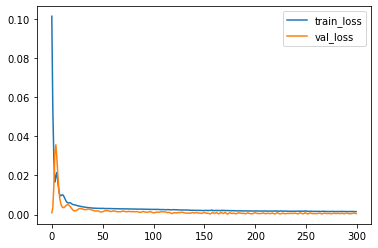

173 ./models/v2/US_defsi_best.h5


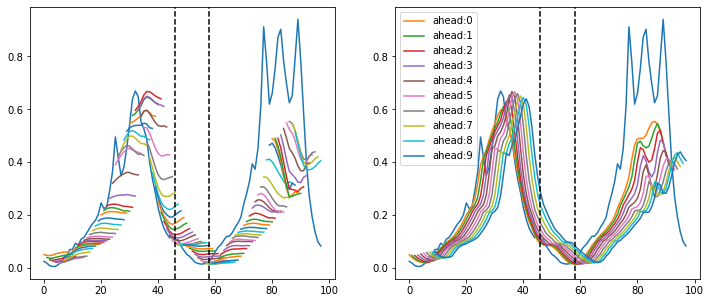

In [919]:
## DEFSI

epochs = 300

# US_perform_by_model = {}
mode_name = 'DEFSI(US)'
US_perform_by_model[mode_name] = {}
print(mode_name)
clear_session()

defsi = DEFSI(look_back=look_back, look_ahead=1)
available_weeks = US_trends_norm['weeks'].values[collect_err+max_lag+look_back:-look_ahead+1]

x, y, val_size, test_size = defsi.generate_data(CDC_norm, available_weeks,
                                              look_back, 1, 
                                              test_split_size=test_split_size,
                                              val_split_size=val_split_size)
x_train, x_val, x_test, x_total = x
y_train, y_val, y_test = y

cp = ModelCheckpoint('./models/v2/defsi_{epoch}.h5')

history = defsi.fit(x_train, y_train, x_val, y_val, epochs=epochs, batch_size=batch_size,
                  callbacks=[cp], verbose=0)

plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.legend()
plt.show()

min_epoch = 100
target_epoch = min_epoch + history.history['val_loss'][min_epoch:].index(
                                min(history.history['val_loss'][min_epoch:]))
best_path = './models/v2/US_defsi_best.h5'
print(target_epoch, best_path)
shutil.copy('./models/v2/defsi_' + str(target_epoch) + '.h5', best_path)

test_defsi = DEFSI(look_back=look_back, look_ahead=1)
test_defsi.load_model(best_path)

start_week = int(available_weeks[0].split('-')[1])
end_week = int(available_weeks[-1].split('-')[1])
target_truth = (CDC_norm.loc[start_week:52, '2018'].tolist() + CDC_norm.loc[:52, '2019'].tolist()
                + CDC_norm.loc[:end_week+look_ahead-1, '2020'].tolist())

prd_total = []
for target_idx in range(90-1):    
    tmp = []
    for i in range(look_ahead):
        if i == 0:
            left_shift = np.array([x_total[0][target_idx]])
        else:
            left_shift = np.roll(left_shift, -1)
            left_shift[:, -1, :] = tmp[-1]
        prd = test_defsi.model.predict([left_shift, np.array([x_total[1][target_idx+1]])])[0, 0]
        prd = np.random.uniform(1e-6, 1e-5) if prd < 0 else prd
        tmp.append(prd)
#     print(left_shift)
#     print(tmp)
    prd_total.append(tmp)
prd_total = np.array(prd_total)
prd_total = prd_total.reshape((prd_total.shape[0], prd_total.shape[1], 1))
US_prd_by_model[mode_name] = prd_total
show_graph(target_truth, prd_total, look_ahead, val_size, test_size)

prd_train = prd_total[:val_size]
prd_val = prd_total[val_size:test_size]
prd_test = prd_total[test_size:]

inverse_target_truth = CDC_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1))
inverse_prd_total = np.array([CDC_scaler.inverse_transform(_) for _ in prd_total])

rmse_total, mape_total, corr_total = Evaluate.evaluate(inverse_target_truth, 
                                                       inverse_prd_total, look_ahead)
rmse_train, mape_train, corr_train = Evaluate.evaluate(inverse_target_truth[:val_size+look_ahead], 
                                                       inverse_prd_total[:val_size], look_ahead)
rmse_val, mape_val, corr_val = Evaluate.evaluate(inverse_target_truth[val_size:test_size+look_ahead],
                                                 inverse_prd_total[val_size:test_size], look_ahead)
rmse_test, mape_test, corr_test = Evaluate.evaluate(inverse_target_truth[test_size:],
                                                    inverse_prd_total[test_size:], look_ahead)

for ahead in range(look_ahead):
    ah = str(ahead+1)
    US_perform_by_model[mode_name]['total_rmse_' + ah] = rmse_total[ahead]
    US_perform_by_model[mode_name]['total_mape_' + ah] = mape_total[ahead]
    US_perform_by_model[mode_name]['total_corr_' + ah] = corr_total[ahead]

    US_perform_by_model[mode_name]['train_rmse_' + ah] = rmse_train[ahead]
    US_perform_by_model[mode_name]['train_mape_' + ah] = mape_train[ahead]
    US_perform_by_model[mode_name]['train_corr_' + ah] = corr_train[ahead]

    US_perform_by_model[mode_name]['val_rmse_' + ah] = rmse_val[ahead]
    US_perform_by_model[mode_name]['val_mape_' + ah] = mape_val[ahead]
    US_perform_by_model[mode_name]['val_corr_' + ah] = corr_val[ahead]

    US_perform_by_model[mode_name]['test_rmse_' + ah] = rmse_test[ahead]
    US_perform_by_model[mode_name]['test_mape_' + ah] = mape_test[ahead]
    US_perform_by_model[mode_name]['test_corr_' + ah] = corr_test[ahead]

Seq2Seq(US)


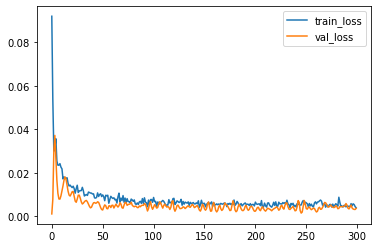

245 ./models/v2/US_seq2seq_best.h5


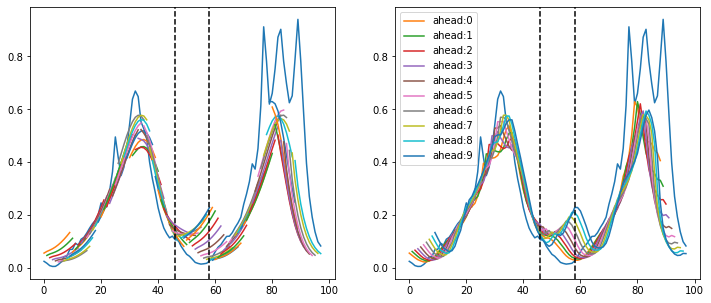

In [920]:
## Seq2Seq

# US_perform_by_model = {}
mode_name = 'Seq2Seq(US)'
US_perform_by_model[mode_name] = {}
print(mode_name)
clear_session()

seq2seq = Seq2Seq(look_back=look_back, look_ahead=look_ahead)

available_weeks = US_trends_norm['weeks'].values[collect_err+max_lag+look_back:-look_ahead+1]

x, y, val_size, test_size = seq2seq.generate_data(CDC_norm, available_weeks,
                                                  look_back, look_ahead, 
                                                  test_split_size=test_split_size,
                                                  val_split_size=val_split_size)
x_train, x_val, x_test, x_total = x
y_train, y_val, y_test = y

cp = ModelCheckpoint('./models/v2/seq2seq_{epoch}.h5')

history = seq2seq.fit(x_train, y_train, x_val, y_val, epochs=epochs, batch_size=batch_size,
                  callbacks=[cp], verbose=0)

plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.legend()
plt.show()

min_epoch = 100
target_epoch = min_epoch + history.history['val_loss'][min_epoch:].index(
                                min(history.history['val_loss'][min_epoch:]))

best_path = './models/v2/US_seq2seq_best.h5'
print(target_epoch, best_path)
shutil.copy('./models/v2/seq2seq_' + str(target_epoch) + '.h5', best_path)

test_seq2seq = Seq2Seq(look_back=look_back, look_ahead=look_ahead)
test_seq2seq.load_model(best_path)

start_week = int(available_weeks[0].split('-')[1])
end_week = int(available_weeks[-1].split('-')[1])
target_truth = (CDC_norm.loc[start_week:52, '2018'].tolist() + CDC_norm.loc[:52, '2019'].tolist()
                + CDC_norm.loc[:end_week+look_ahead-1, '2020'].tolist())

prd_total = []

for target_idx in range(90-1):
    enc_out, enc_h, enc_c = test_seq2seq.encoder_model.predict(np.array([x_total[0][target_idx]]))

    dec_input = x_total[1][target_idx][0].reshape(-1, 1)

    tmp = []
    for ahead in range(look_ahead):
        prd, dec_h, dec_c = test_seq2seq.decoder_model.predict([dec_input] + [enc_out, enc_h, enc_c])
        prd_val = prd[0, 0]
        if prd[0, 0] > 0:
            tmp.append(prd_val)
        else:
            tmp.append([np.random.uniform(1e-6, 1e-5)])

        dec_input = prd[0, 0]
        enc_h, enc_c = dec_h, dec_c
    prd_total.append(tmp)
prd_total = np.array(prd_total)
US_prd_by_model[mode_name] = prd_total
show_graph(target_truth, prd_total, look_ahead, val_size, test_size)

prd_train = prd_total[:val_size]
prd_val = prd_total[val_size:test_size]
prd_test = prd_total[test_size:]

inverse_target_truth = CDC_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1))
inverse_prd_total = np.array([CDC_scaler.inverse_transform(_) for _ in prd_total])

rmse_total, mape_total, corr_total = Evaluate.evaluate(inverse_target_truth, 
                                                       inverse_prd_total, look_ahead)
rmse_train, mape_train, corr_train = Evaluate.evaluate(inverse_target_truth[:val_size+look_ahead], 
                                                       inverse_prd_total[:val_size], look_ahead)
rmse_val, mape_val, corr_val = Evaluate.evaluate(inverse_target_truth[val_size:test_size+look_ahead],
                                                 inverse_prd_total[val_size:test_size], look_ahead)
rmse_test, mape_test, corr_test = Evaluate.evaluate(inverse_target_truth[test_size:],
                                                    inverse_prd_total[test_size:], look_ahead)

for ahead in range(look_ahead):
    ah = str(ahead+1)
    US_perform_by_model[mode_name]['total_rmse_' + ah] = rmse_total[ahead]
    US_perform_by_model[mode_name]['total_mape_' + ah] = mape_total[ahead]
    US_perform_by_model[mode_name]['total_corr_' + ah] = corr_total[ahead]

    US_perform_by_model[mode_name]['train_rmse_' + ah] = rmse_train[ahead]
    US_perform_by_model[mode_name]['train_mape_' + ah] = mape_train[ahead]
    US_perform_by_model[mode_name]['train_corr_' + ah] = corr_train[ahead]

    US_perform_by_model[mode_name]['val_rmse_' + ah] = rmse_val[ahead]
    US_perform_by_model[mode_name]['val_mape_' + ah] = mape_val[ahead]
    US_perform_by_model[mode_name]['val_corr_' + ah] = corr_val[ahead]

    US_perform_by_model[mode_name]['test_rmse_' + ah] = rmse_test[ahead]
    US_perform_by_model[mode_name]['test_mape_' + ah] = mape_test[ahead]
    US_perform_by_model[mode_name]['test_corr_' + ah] = corr_test[ahead]

In [924]:
US_perform = pd.DataFrame(US_perform_by_model).T
US_perform.to_csv('./data/v2/US_perform4.csv', encoding='utf8')
US_perform

,total_rmse_1,total_mape_1,total_corr_1,train_rmse_1,train_mape_1,train_corr_1,val_rmse_1,val_mape_1,val_corr_1,test_rmse_1,...,total_corr_10,train_rmse_10,train_mape_10,train_corr_10,val_rmse_10,val_mape_10,val_corr_10,test_rmse_10,test_mape_10,test_corr_10
ME-T(US),8.875896,23.363070,0.879829,3.807868,15.125909,0.981623,5.397736,34.648132,0.707057,13.906294,...,0.755247,6.825868,21.152873,0.918387,8.145495,35.453204,-0.549630,18.169185,45.990609,0.558888
Basic-LSTM(US),9.756124,28.068489,0.871169,8.059388,24.241342,0.814783,4.536303,31.718664,0.965648,12.996756,...,0.142846,15.390277,57.369221,-0.062801,6.861161,31.618770,-0.984619,28.376947,110.654683,-0.056742
DEFSI(US),8.796584,18.924491,0.915928,2.622928,8.594511,0.981874,1.489697,11.805658,0.868891,14.528850,...,0.208811,15.798286,60.016507,0.278648,5.111717,45.652391,-0.995321,30.160102,139.751958,-0.031125
Seq2Seq(US),9.053642,21.690121,0.922563,5.053469,14.406377,0.938564,2.742487,20.728373,0.900729,13.947144,...,0.701965,5.542445,19.347347,0.911880,9.297919,41.553750,-0.798471,22.118639,87.699870,0.723535


In [925]:
with open('./data/v2/US_predict4.pkl', 'wb') as f:
    pickle.dump(US_prd_by_model, f)

mode: ME-T(AU)
128 128
val size: 46 test_size: 58


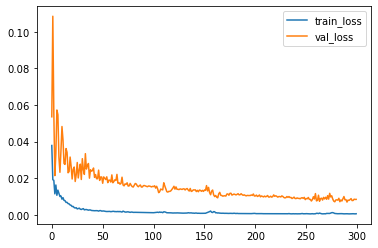

290 ./models/v2/AU_me_T_lb8_best.h5
128 128


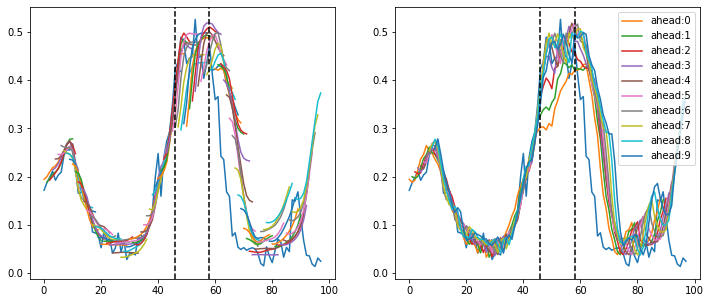

In [935]:
# AU_trends MEDIF 적용

AU_perform_by_model = {}
AU_prd_by_model = {}

mode = 'T'

mode_name = 'ME-' + mode + '(AU)'
AU_perform_by_model[mode_name] = {}
print('mode:', mode_name)
clear_session()

trend_word_num = len(AU_trends_max_lag.columns)

me = Multi_Encoder_v2(look_back=look_back, look_ahead=look_ahead,
                      past_year_num=6,
                      trend_word_num=trend_word_num,
                      mode=mode)

available_weeks = AU_trends_norm['weeks'].values[collect_err+max_lag+look_back:-look_ahead+1]
x, y, val_size, test_size = me.generate_data(ASPREN_norm, available_weeks,
                                             look_back, look_ahead,
                                             test_split_size=test_split_size,
                                             val_split_size=val_split_size,
                                             trends_data=AU_trends_norm,
                                             trends_lag=AU_trends_max_lag)

x_train, x_val, x_test, x_total = x
y_train, y_val, y_test = y

print('val size:', val_size, 'test_size:', test_size)

cp = ModelCheckpoint('./models/v2/me_{epoch}.h5')

history = me.fit(x_train, y_train, x_val, y_val, epochs=epochs, batch_size=batch_size,
                  callbacks=[cp], verbose=0)

plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.legend()
plt.show()

min_epoch = 100
target_epoch = min_epoch + history.history['val_loss'][min_epoch:].index(
                                min(history.history['val_loss'][min_epoch:]))
best_path = './models/v2/AU_me_' + mode + '_lb' + str(look_back) + '_best.h5'
print(target_epoch, best_path)
shutil.copy('./models/v2/me_' + str(target_epoch) + '.h5', best_path)


test_me = Multi_Encoder_v2(look_back=look_back, look_ahead=look_ahead,
                          past_year_num=past_year_num,
                          trend_word_num=trend_word_num,
                          mode=mode)
test_me.load_model(best_path)

start_week = int(available_weeks[0].split('-')[1])
end_week = int(available_weeks[-1].split('-')[1])
target_truth = (ASPREN_norm.loc[start_week:52, '2018'].tolist() + ASPREN_norm.loc[:52, '2019'].tolist()
                + ASPREN_norm.loc[:end_week+look_ahead-1, '2020'].tolist())

prd_total = []

for target_idx in range(90-1):

    enc_out, enc_h, enc_c = test_me.encoder_model.predict([x_total[0][target_idx:target_idx+1],
                                                          x_total[1][target_idx:target_idx+1]])

    dec_input = x_total[2][target_idx, 0, :].reshape(1, 1, x_total[2].shape[2])
    tmp = []
    for ahead in range(look_ahead):
        prd, dec_h, dec_c = test_me.decoder_model.predict([dec_input] + [enc_out, enc_h, enc_c])
        prd_val = prd[0, 0, 0]
        if prd_val > 0:
            tmp.append([prd_val])
        else:
            tmp.append([np.random.uniform(1e-6, 1e-5)])

        if ahead < look_ahead - 1:
            dec_input = x_total[2][target_idx, ahead+1, :].reshape(1, 1, x_total[2].shape[2])
            dec_input[0, 0, -1] = prd_val
        enc_h, enc_c = dec_h, dec_c
    prd_total.append(tmp)
prd_total = np.array(prd_total)
AU_prd_by_model[mode_name] = prd_total

show_graph(target_truth, prd_total, look_ahead, val_size, test_size)
prd_train = prd_total[:val_size]
prd_val = prd_total[val_size:test_size]
prd_test = prd_total[test_size:]

inverse_target_truth = ASPREN_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1))
inverse_prd_total = np.array([ASPREN_scaler.inverse_transform(_) for _ in prd_total])

rmse_total, mape_total, corr_total = Evaluate.evaluate(inverse_target_truth, 
                                                       inverse_prd_total, look_ahead)
rmse_train, mape_train, corr_train = Evaluate.evaluate(inverse_target_truth[:val_size+look_ahead], 
                                                       inverse_prd_total[:val_size], look_ahead)
rmse_val, mape_val, corr_val = Evaluate.evaluate(inverse_target_truth[val_size:test_size+look_ahead],
                                                 inverse_prd_total[val_size:test_size], look_ahead)
rmse_test, mape_test, corr_test = Evaluate.evaluate(inverse_target_truth[test_size:],
                                                    inverse_prd_total[test_size:], look_ahead)

for ahead in range(look_ahead):
    ah = str(ahead+1)
    AU_perform_by_model[mode_name]['total_rmse_' + ah] = rmse_total[ahead]
    AU_perform_by_model[mode_name]['total_mape_' + ah] = mape_total[ahead]
    AU_perform_by_model[mode_name]['total_corr_' + ah] = corr_total[ahead]

    AU_perform_by_model[mode_name]['train_rmse_' + ah] = rmse_train[ahead]
    AU_perform_by_model[mode_name]['train_mape_' + ah] = mape_train[ahead]
    AU_perform_by_model[mode_name]['train_corr_' + ah] = corr_train[ahead]

    AU_perform_by_model[mode_name]['val_rmse_' + ah] = rmse_val[ahead]
    AU_perform_by_model[mode_name]['val_mape_' + ah] = mape_val[ahead]
    AU_perform_by_model[mode_name]['val_corr_' + ah] = corr_val[ahead]

    AU_perform_by_model[mode_name]['test_rmse_' + ah] = rmse_test[ahead]
    AU_perform_by_model[mode_name]['test_mape_' + ah] = mape_test[ahead]
    AU_perform_by_model[mode_name]['test_corr_' + ah] = corr_test[ahead]

Basic-LSTM(AU)


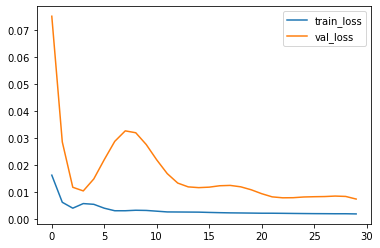

29 ./models/v2/AU_basic_lstm_best.h5


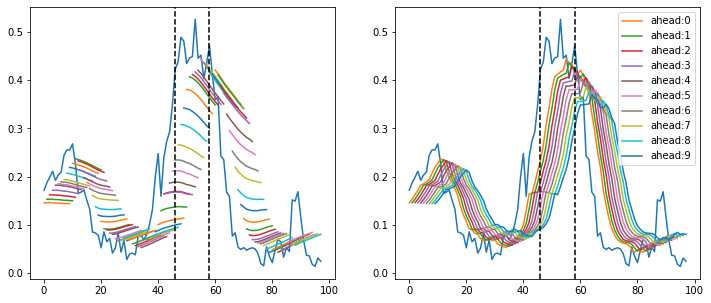

In [936]:
## Basic_LSTM

epochs = 30

# AU_perform_by_model = {}
mode_name = 'Basic-LSTM(AU)'
AU_perform_by_model[mode_name] = {}
print(mode_name)
clear_session()

basic_lstm = Basic_LSTM(look_back=look_back, look_ahead=look_ahead)
available_weeks = AU_trends_norm['weeks'].values[collect_err+max_lag+look_back:-look_ahead+1]

x, y, val_size, test_size = basic_lstm.generate_data(ASPREN_norm, available_weeks,
                                                  look_back, 1, 
                                                  test_split_size=test_split_size,
                                                  val_split_size=val_split_size)
x_train, x_val, x_test, x_total = x
y_train, y_val, y_test = y

cp = ModelCheckpoint('./models/v2/basic_lstm_{epoch}.h5')

history = basic_lstm.fit(x_train, y_train, x_val, y_val, epochs=epochs, batch_size=batch_size,
                  callbacks=[cp], verbose=0)

plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.legend()
plt.show()

min_epoch = 10
target_epoch = min_epoch + history.history['val_loss'][min_epoch:].index(
                                min(history.history['val_loss'][min_epoch:]))
best_path = './models/v2/AU_basic_lstm_best.h5'
print(target_epoch, best_path)
shutil.copy('./models/v2/basic_lstm_' + str(target_epoch) + '.h5', best_path)

test_basic_lstm = Basic_LSTM(look_back=look_back, look_ahead=look_ahead)
test_basic_lstm.load_model(best_path)

start_week = int(available_weeks[0].split('-')[1])
end_week = int(available_weeks[-1].split('-')[1])
target_truth = (ASPREN_norm.loc[start_week:52, '2018'].tolist() + ASPREN_norm.loc[:52, '2019'].tolist()
                + ASPREN_norm.loc[:end_week+look_ahead-1, '2020'].tolist())


prd_total = []
for target_idx in range(90-1):    
    tmp = []
    for i in range(look_ahead):
        if i == 0:
            left_shift = np.array([x_total[0][target_idx]])
        else:
            left_shift = np.roll(left_shift, -1)
            left_shift[:, -1, :] = tmp[-1]
        prd = test_basic_lstm.model.predict(left_shift)[0, 0]
        prd = np.random.uniform(1e-6, 1e-5) if prd < 0 else prd
        prd = 1.0 - np.random.uniform(1e-6, 1e-5) if prd > 1 else prd
        tmp.append(prd)
#     print(left_shift)
#     print(tmp)
    prd_total.append(tmp)
prd_total = np.array(prd_total)
prd_total = prd_total.reshape((prd_total.shape[0], prd_total.shape[1], 1))
AU_prd_by_model[mode_name] = prd_total
show_graph(target_truth, prd_total, look_ahead, val_size, test_size)

prd_train = prd_total[:val_size]
prd_val = prd_total[val_size:test_size]
prd_test = prd_total[test_size:]

inverse_target_truth = ASPREN_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1))
inverse_prd_total = np.array([ASPREN_scaler.inverse_transform(_) for _ in prd_total])

rmse_total, mape_total, corr_total = Evaluate.evaluate(inverse_target_truth, 
                                                       inverse_prd_total, look_ahead)
rmse_train, mape_train, corr_train = Evaluate.evaluate(inverse_target_truth[:val_size+look_ahead], 
                                                       inverse_prd_total[:val_size], look_ahead)
rmse_val, mape_val, corr_val = Evaluate.evaluate(inverse_target_truth[val_size:test_size+look_ahead],
                                                 inverse_prd_total[val_size:test_size], look_ahead)
rmse_test, mape_test, corr_test = Evaluate.evaluate(inverse_target_truth[test_size:],
                                                    inverse_prd_total[test_size:], look_ahead)

for ahead in range(look_ahead):
    ah = str(ahead+1)
    AU_perform_by_model[mode_name]['total_rmse_' + ah] = rmse_total[ahead]
    AU_perform_by_model[mode_name]['total_mape_' + ah] = mape_total[ahead]
    AU_perform_by_model[mode_name]['total_corr_' + ah] = corr_total[ahead]

    AU_perform_by_model[mode_name]['train_rmse_' + ah] = rmse_train[ahead]
    AU_perform_by_model[mode_name]['train_mape_' + ah] = mape_train[ahead]
    AU_perform_by_model[mode_name]['train_corr_' + ah] = corr_train[ahead]

    AU_perform_by_model[mode_name]['val_rmse_' + ah] = rmse_val[ahead]
    AU_perform_by_model[mode_name]['val_mape_' + ah] = mape_val[ahead]
    AU_perform_by_model[mode_name]['val_corr_' + ah] = corr_val[ahead]

    AU_perform_by_model[mode_name]['test_rmse_' + ah] = rmse_test[ahead]
    AU_perform_by_model[mode_name]['test_mape_' + ah] = mape_test[ahead]
    AU_perform_by_model[mode_name]['test_corr_' + ah] = corr_test[ahead]

DEFSI(AU)


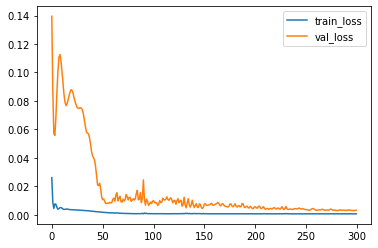

297 ./models/v2/AU_defsi_best.h5


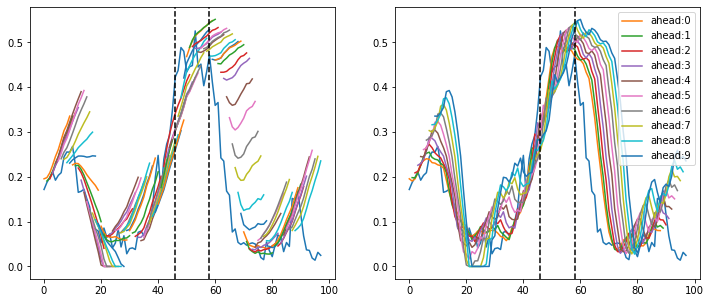

In [937]:
## DEFSI

epochs = 300

# AU_perform_by_model = {}
mode_name = 'DEFSI(AU)'
AU_perform_by_model[mode_name] = {}
print(mode_name)
clear_session()

defsi = DEFSI(look_back=look_back, look_ahead=1)
available_weeks = AU_trends_norm['weeks'].values[collect_err+max_lag+look_back:-look_ahead+1]

x, y, val_size, test_size = defsi.generate_data(ASPREN_norm, available_weeks,
                                              look_back, 1, 
                                              test_split_size=test_split_size,
                                              val_split_size=val_split_size)
x_train, x_val, x_test, x_total = x
y_train, y_val, y_test = y

cp = ModelCheckpoint('./models/v2/defsi_{epoch}.h5')

history = defsi.fit(x_train, y_train, x_val, y_val, epochs=epochs, batch_size=batch_size,
                  callbacks=[cp], verbose=0)

plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.legend()
plt.show()

min_epoch = 100
target_epoch = min_epoch + history.history['val_loss'][min_epoch:].index(
                                min(history.history['val_loss'][min_epoch:]))
best_path = './models/v2/AU_defsi_best.h5'
print(target_epoch, best_path)
shutil.copy('./models/v2/defsi_' + str(target_epoch) + '.h5', best_path)

test_defsi = DEFSI(look_back=look_back, look_ahead=1)
test_defsi.load_model(best_path)

start_week = int(available_weeks[0].split('-')[1])
end_week = int(available_weeks[-1].split('-')[1])
target_truth = (ASPREN_norm.loc[start_week:52, '2018'].tolist() + ASPREN_norm.loc[:52, '2019'].tolist()
                + ASPREN_norm.loc[:end_week+look_ahead-1, '2020'].tolist())

prd_total = []
for target_idx in range(90-1):    
    tmp = []
    for i in range(look_ahead):
        if i == 0:
            left_shift = np.array([x_total[0][target_idx]])
        else:
            left_shift = np.roll(left_shift, -1)
            left_shift[:, -1, :] = tmp[-1]
        prd = test_defsi.model.predict([left_shift, np.array([x_total[1][target_idx+1]])])[0, 0]
        prd = np.random.uniform(1e-6, 1e-5) if prd < 0 else prd
        prd = 1 - np.random.uniform(1e-6, 1e-5) if prd > 1 else prd
        tmp.append(prd)
#     print(left_shift)
#     print(tmp)
    prd_total.append(tmp)
prd_total = np.array(prd_total)
prd_total = prd_total.reshape((prd_total.shape[0], prd_total.shape[1], 1))
AU_prd_by_model[mode_name] = prd_total
show_graph(target_truth, prd_total, look_ahead, val_size, test_size)

prd_train = prd_total[:val_size]
prd_val = prd_total[val_size:test_size]
prd_test = prd_total[test_size:]

inverse_target_truth = ASPREN_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1))
inverse_prd_total = np.array([ASPREN_scaler.inverse_transform(_) for _ in prd_total])

rmse_total, mape_total, corr_total = Evaluate.evaluate(inverse_target_truth, 
                                                       inverse_prd_total, look_ahead)
rmse_train, mape_train, corr_train = Evaluate.evaluate(inverse_target_truth[:val_size+look_ahead], 
                                                       inverse_prd_total[:val_size], look_ahead)
rmse_val, mape_val, corr_val = Evaluate.evaluate(inverse_target_truth[val_size:test_size+look_ahead],
                                                 inverse_prd_total[val_size:test_size], look_ahead)
rmse_test, mape_test, corr_test = Evaluate.evaluate(inverse_target_truth[test_size:],
                                                    inverse_prd_total[test_size:], look_ahead)

for ahead in range(look_ahead):
    ah = str(ahead+1)
    AU_perform_by_model[mode_name]['total_rmse_' + ah] = rmse_total[ahead]
    AU_perform_by_model[mode_name]['total_mape_' + ah] = mape_total[ahead]
    AU_perform_by_model[mode_name]['total_corr_' + ah] = corr_total[ahead]

    AU_perform_by_model[mode_name]['train_rmse_' + ah] = rmse_train[ahead]
    AU_perform_by_model[mode_name]['train_mape_' + ah] = mape_train[ahead]
    AU_perform_by_model[mode_name]['train_corr_' + ah] = corr_train[ahead]

    AU_perform_by_model[mode_name]['val_rmse_' + ah] = rmse_val[ahead]
    AU_perform_by_model[mode_name]['val_mape_' + ah] = mape_val[ahead]
    AU_perform_by_model[mode_name]['val_corr_' + ah] = corr_val[ahead]

    AU_perform_by_model[mode_name]['test_rmse_' + ah] = rmse_test[ahead]
    AU_perform_by_model[mode_name]['test_mape_' + ah] = mape_test[ahead]
    AU_perform_by_model[mode_name]['test_corr_' + ah] = corr_test[ahead]

Seq2Seq(AU)


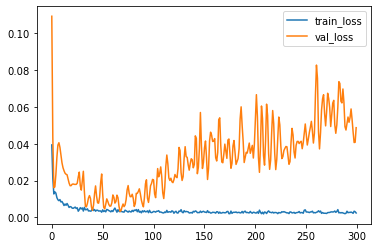

110 ./models/v2/AU_seq2seq_best.h5


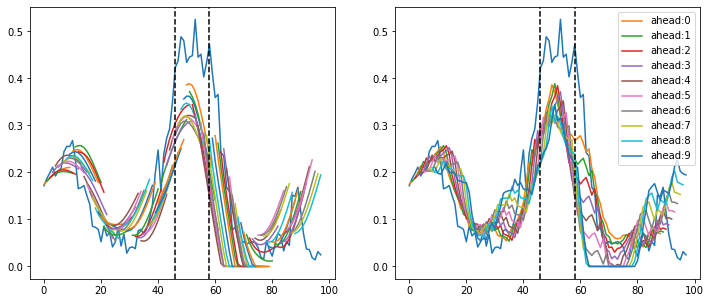

In [938]:
## Seq2Seq

# AU_perform_by_model = {}
mode_name = 'Seq2Seq(AU)'
AU_perform_by_model[mode_name] = {}
print(mode_name)
clear_session()

seq2seq = Seq2Seq(look_back=look_back, look_ahead=look_ahead)

available_weeks = AU_trends_norm['weeks'].values[collect_err+max_lag+look_back:-look_ahead+1]

x, y, val_size, test_size = seq2seq.generate_data(ASPREN_norm, available_weeks,
                                                  look_back, look_ahead, 
                                                  test_split_size=test_split_size,
                                                  val_split_size=val_split_size)
x_train, x_val, x_test, x_total = x
y_train, y_val, y_test = y

cp = ModelCheckpoint('./models/v2/seq2seq_{epoch}.h5')

history = seq2seq.fit(x_train, y_train, x_val, y_val, epochs=epochs, batch_size=batch_size,
                  callbacks=[cp], verbose=0)

plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.legend()
plt.show()

min_epoch = 100
target_epoch = min_epoch + history.history['val_loss'][min_epoch:].index(
                                min(history.history['val_loss'][min_epoch:]))

best_path = './models/v2/AU_seq2seq_best.h5'
print(target_epoch, best_path)
shutil.copy('./models/v2/seq2seq_' + str(target_epoch) + '.h5', best_path)

test_seq2seq = Seq2Seq(look_back=look_back, look_ahead=look_ahead)
test_seq2seq.load_model(best_path)

start_week = int(available_weeks[0].split('-')[1])
end_week = int(available_weeks[-1].split('-')[1])
target_truth = (ASPREN_norm.loc[start_week:52, '2018'].tolist() + ASPREN_norm.loc[:52, '2019'].tolist()
                + ASPREN_norm.loc[:end_week+look_ahead-1, '2020'].tolist())

prd_total = []

for target_idx in range(90-1):
    enc_out, enc_h, enc_c = test_seq2seq.encoder_model.predict(np.array([x_total[0][target_idx]]))

    dec_input = x_total[1][target_idx][0].reshape(-1, 1)

    tmp = []
    for ahead in range(look_ahead):
        prd, dec_h, dec_c = test_seq2seq.decoder_model.predict([dec_input] + [enc_out, enc_h, enc_c])
        prd_val = prd[0, 0]
        if prd[0, 0] > 0:
            tmp.append(prd_val)
        else:
            tmp.append([np.random.uniform(1e-6, 1e-5)])

        dec_input = prd[0, 0]
        enc_h, enc_c = dec_h, dec_c
    prd_total.append(tmp)
prd_total = np.array(prd_total)
AU_prd_by_model[mode_name] = prd_total
show_graph(target_truth, prd_total, look_ahead, val_size, test_size)

prd_train = prd_total[:val_size]
prd_val = prd_total[val_size:test_size]
prd_test = prd_total[test_size:]

inverse_target_truth = ASPREN_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1))
inverse_prd_total = np.array([ASPREN_scaler.inverse_transform(_) for _ in prd_total])

rmse_total, mape_total, corr_total = Evaluate.evaluate(inverse_target_truth, 
                                                       inverse_prd_total, look_ahead)
rmse_train, mape_train, corr_train = Evaluate.evaluate(inverse_target_truth[:val_size+look_ahead], 
                                                       inverse_prd_total[:val_size], look_ahead)
rmse_val, mape_val, corr_val = Evaluate.evaluate(inverse_target_truth[val_size:test_size+look_ahead],
                                                 inverse_prd_total[val_size:test_size], look_ahead)
rmse_test, mape_test, corr_test = Evaluate.evaluate(inverse_target_truth[test_size:],
                                                    inverse_prd_total[test_size:], look_ahead)

for ahead in range(look_ahead):
    ah = str(ahead+1)
    AU_perform_by_model[mode_name]['total_rmse_' + ah] = rmse_total[ahead]
    AU_perform_by_model[mode_name]['total_mape_' + ah] = mape_total[ahead]
    AU_perform_by_model[mode_name]['total_corr_' + ah] = corr_total[ahead]

    AU_perform_by_model[mode_name]['train_rmse_' + ah] = rmse_train[ahead]
    AU_perform_by_model[mode_name]['train_mape_' + ah] = mape_train[ahead]
    AU_perform_by_model[mode_name]['train_corr_' + ah] = corr_train[ahead]

    AU_perform_by_model[mode_name]['val_rmse_' + ah] = rmse_val[ahead]
    AU_perform_by_model[mode_name]['val_mape_' + ah] = mape_val[ahead]
    AU_perform_by_model[mode_name]['val_corr_' + ah] = corr_val[ahead]

    AU_perform_by_model[mode_name]['test_rmse_' + ah] = rmse_test[ahead]
    AU_perform_by_model[mode_name]['test_mape_' + ah] = mape_test[ahead]
    AU_perform_by_model[mode_name]['test_corr_' + ah] = corr_test[ahead]

In [939]:
AU_perform = pd.DataFrame(AU_perform_by_model).T
AU_perform.to_csv('./data/v2/AU_perform4.csv', encoding='utf8')
AU_perform

,total_rmse_1,total_mape_1,total_corr_1,train_rmse_1,train_mape_1,train_corr_1,val_rmse_1,val_mape_1,val_corr_1,test_rmse_1,...,total_corr_10,train_rmse_10,train_mape_10,train_corr_10,val_rmse_10,val_mape_10,val_corr_10,test_rmse_10,test_mape_10,test_corr_10
ME-T(AU),1.766233,22.802012,0.875529,0.643319,14.043476,0.952847,2.930026,29.886044,-0.161141,2.240279,...,0.774594,0.817665,16.026653,0.977647,4.492471,31.405406,0.700549,4.046993,53.023420,-0.073487
Basic-LSTM(AU),1.812196,31.563901,0.866256,1.343119,29.471036,0.785879,2.674486,25.032600,0.022890,1.995672,...,0.144904,4.331893,95.060420,-0.092524,4.171574,45.495702,-0.718108,3.757604,60.486774,-0.128072
DEFSI(AU),1.611953,22.886312,0.910271,0.815867,17.212091,0.925690,1.742692,14.822923,0.072560,2.301429,...,0.510872,2.882280,83.907227,0.707122,6.143280,37.402310,-0.265260,6.146948,59.573150,-0.080809
Seq2Seq(AU),1.687797,26.923839,0.934123,0.958723,20.200715,0.895459,3.386416,39.067499,0.328442,1.541218,...,0.624132,2.553534,39.920996,0.836625,5.133317,401.430161,0.918541,2.375497,134.203103,0.153428


In [941]:
with open('./data/v2/AU_predict4.pkl', 'wb') as f:
    pickle.dump(AU_prd_by_model, f)

look back: 3
mode: ME-N
val size: 48 test_size: 61


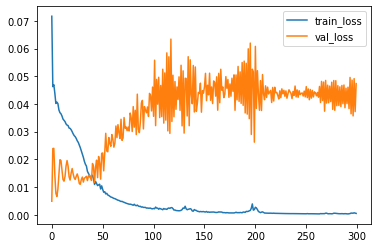

199 ./models/v2/KR_me_N_lb3_best.h5


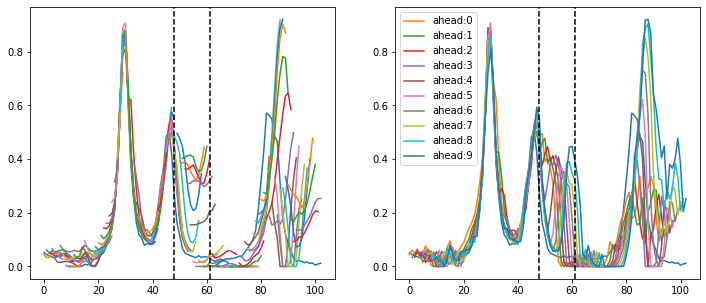

mode: ME-S
val size: 48 test_size: 61


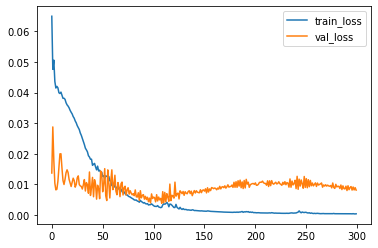

108 ./models/v2/KR_me_S_lb3_best.h5


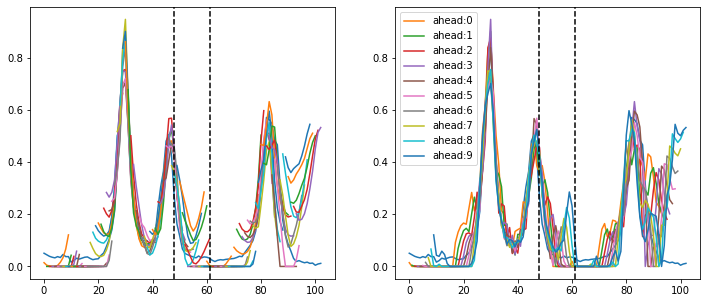

mode: ME-T
val size: 48 test_size: 61


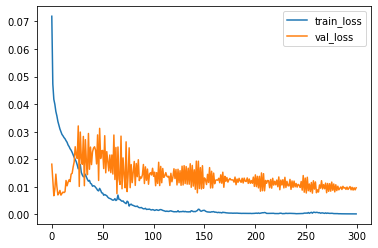

256 ./models/v2/KR_me_T_lb3_best.h5


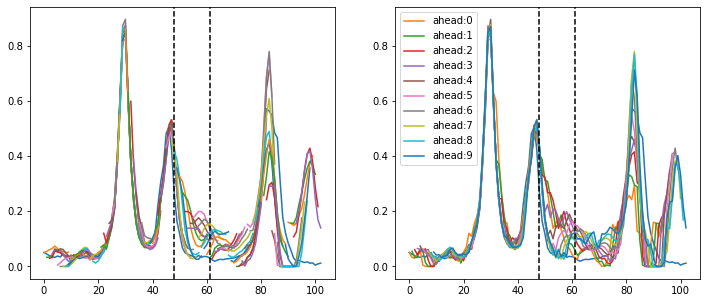

mode: ME-A
val size: 48 test_size: 61


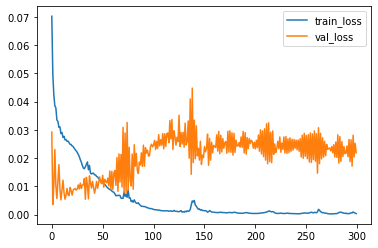

137 ./models/v2/KR_me_A_lb3_best.h5


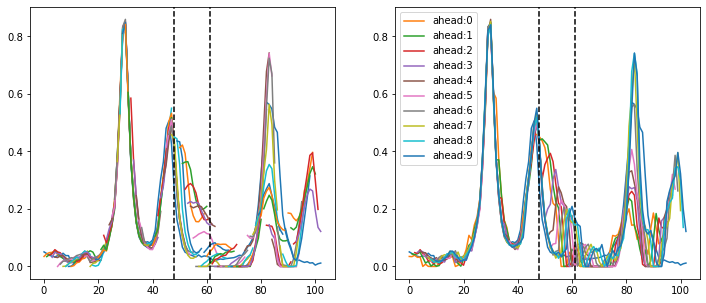

look back: 4
mode: ME-N
val size: 48 test_size: 61


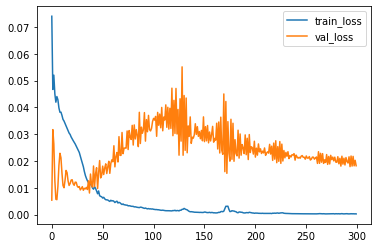

172 ./models/v2/KR_me_N_lb4_best.h5


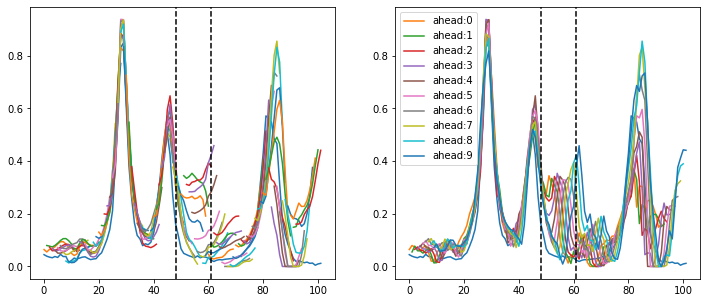

mode: ME-S
val size: 48 test_size: 61


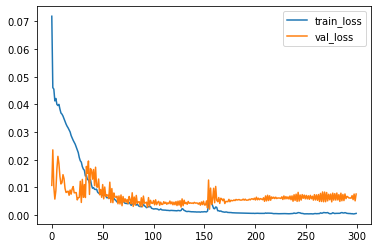

155 ./models/v2/KR_me_S_lb4_best.h5


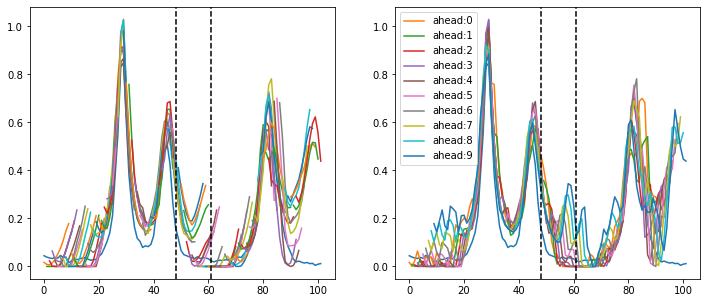

mode: ME-T
val size: 48 test_size: 61


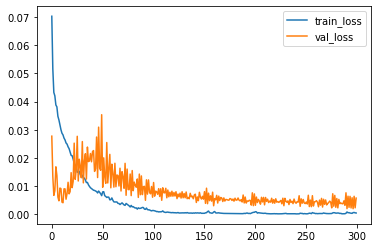

296 ./models/v2/KR_me_T_lb4_best.h5


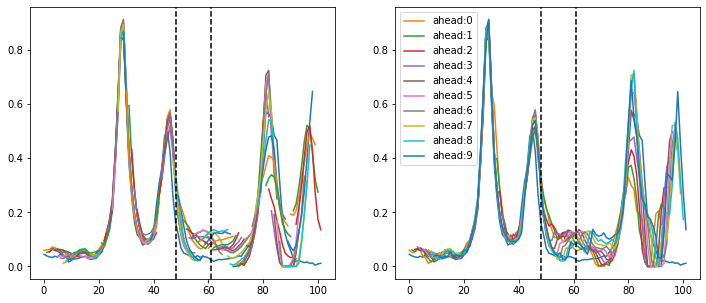

mode: ME-A
val size: 48 test_size: 61


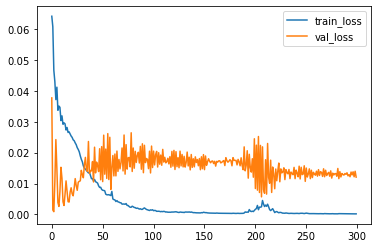

206 ./models/v2/KR_me_A_lb4_best.h5


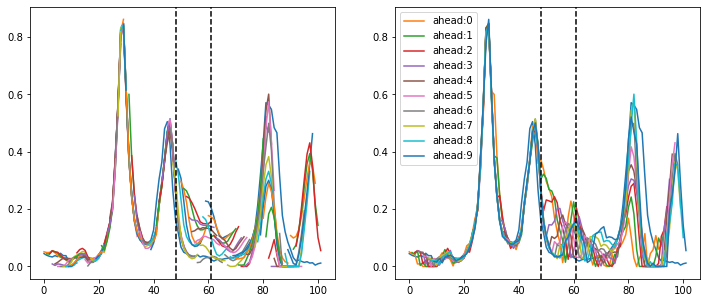

look back: 5
mode: ME-N
val size: 48 test_size: 60


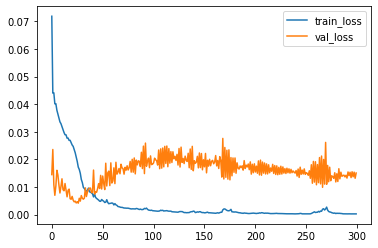

266 ./models/v2/KR_me_N_lb5_best.h5


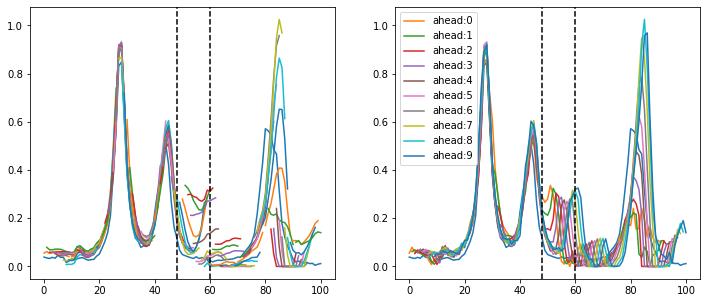

mode: ME-S
val size: 48 test_size: 60


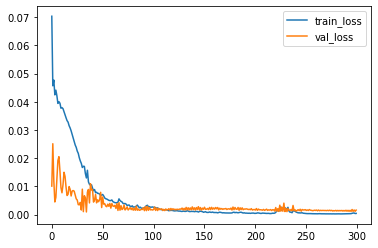

231 ./models/v2/KR_me_S_lb5_best.h5


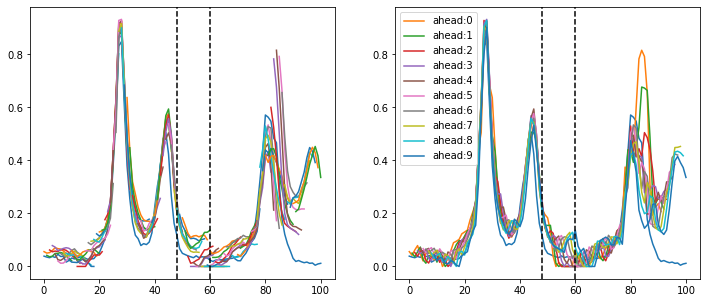

mode: ME-T
val size: 48 test_size: 60


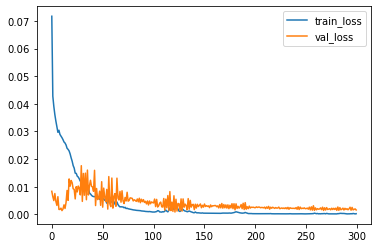

121 ./models/v2/KR_me_T_lb5_best.h5


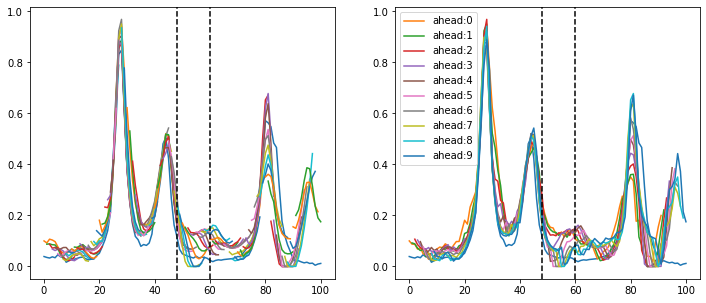

mode: ME-A
val size: 48 test_size: 60


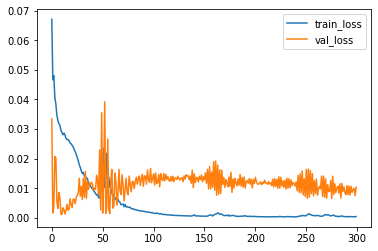

275 ./models/v2/KR_me_A_lb5_best.h5


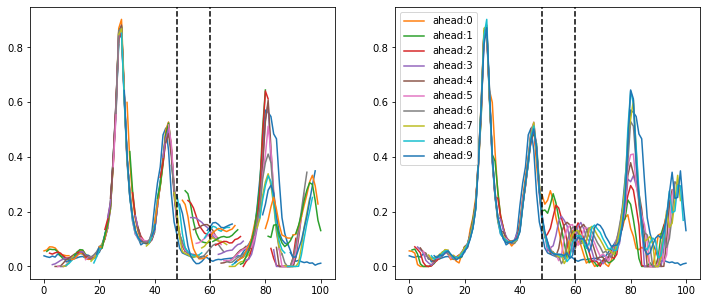

look back: 6
mode: ME-N
val size: 47 test_size: 59


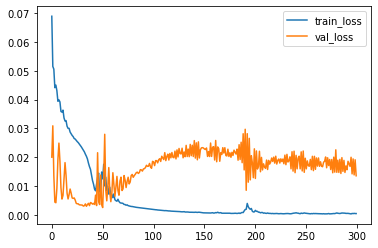

191 ./models/v2/KR_me_N_lb6_best.h5


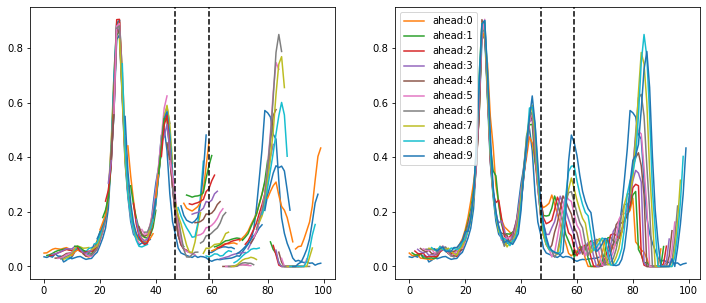

mode: ME-S
val size: 47 test_size: 59


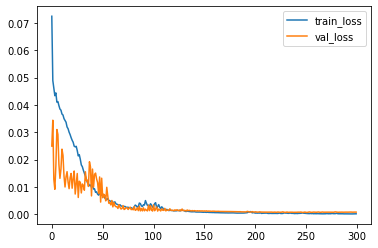

247 ./models/v2/KR_me_S_lb6_best.h5


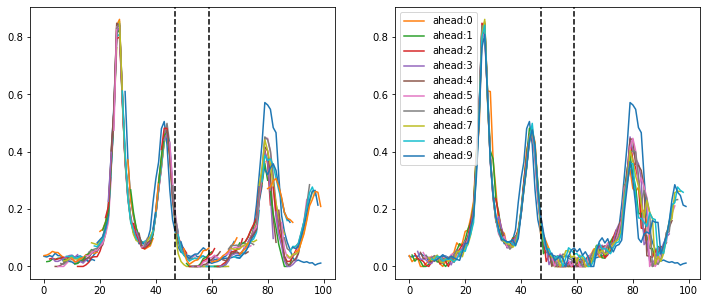

mode: ME-T
val size: 47 test_size: 59


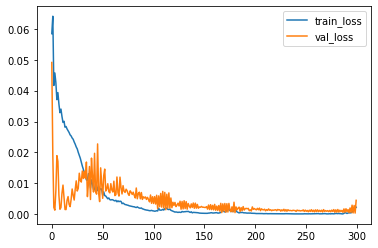

298 ./models/v2/KR_me_T_lb6_best.h5


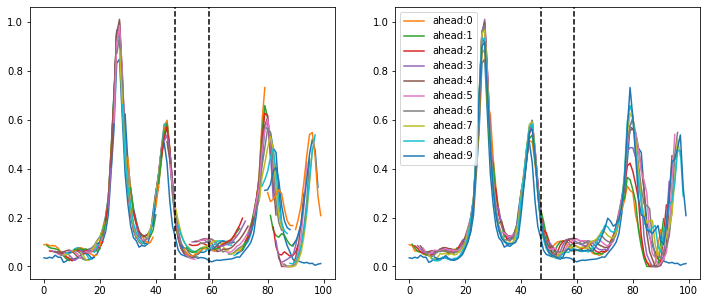

mode: ME-A
val size: 47 test_size: 59


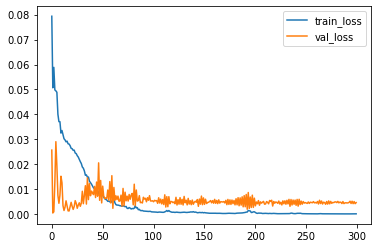

192 ./models/v2/KR_me_A_lb6_best.h5


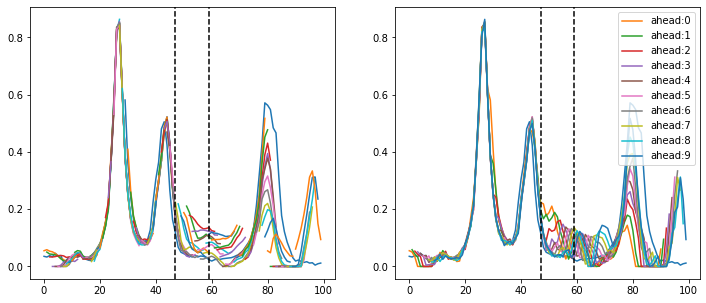

look back: 7
mode: ME-N
val size: 47 test_size: 59


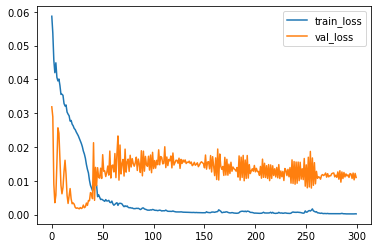

255 ./models/v2/KR_me_N_lb7_best.h5


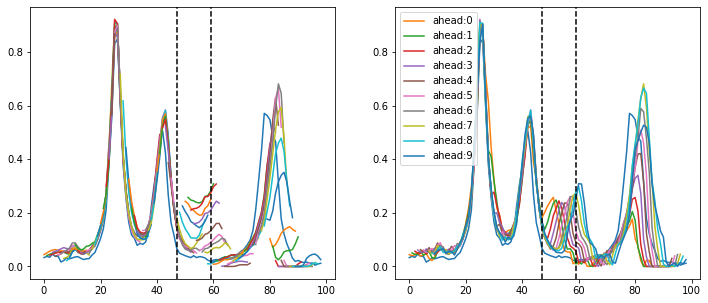

mode: ME-S
val size: 47 test_size: 59


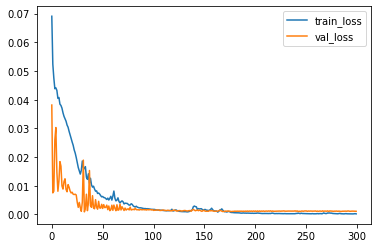

176 ./models/v2/KR_me_S_lb7_best.h5


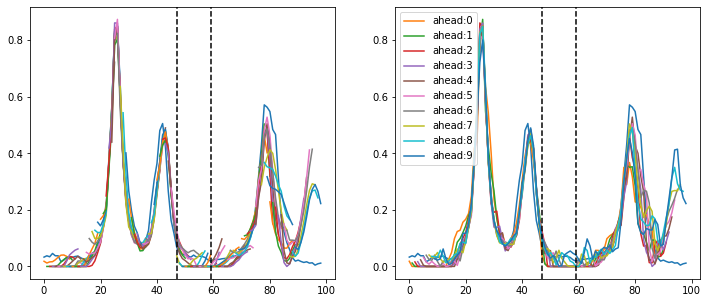

mode: ME-T
val size: 47 test_size: 59


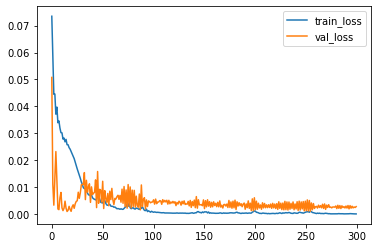

254 ./models/v2/KR_me_T_lb7_best.h5


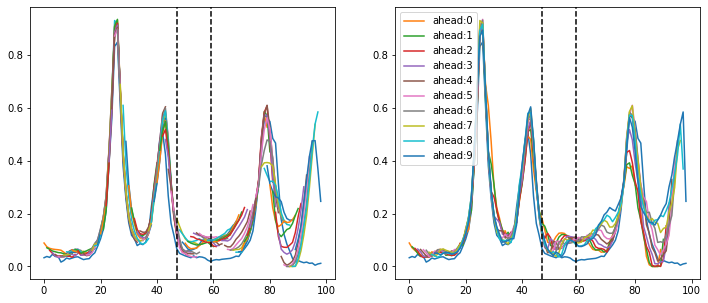

mode: ME-A
val size: 47 test_size: 59


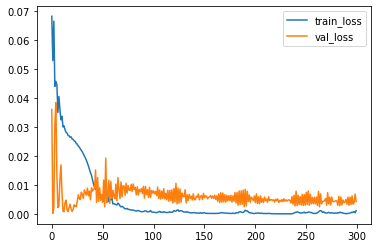

263 ./models/v2/KR_me_A_lb7_best.h5


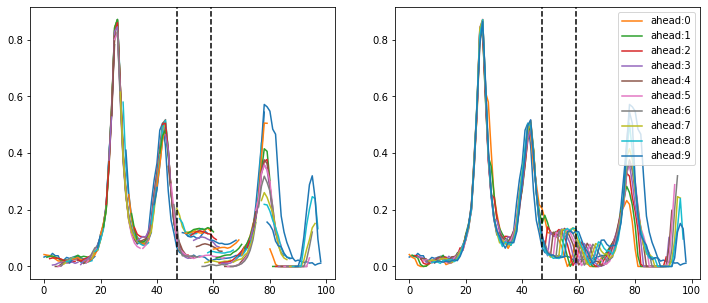

look back: 8
mode: ME-N
val size: 46 test_size: 58


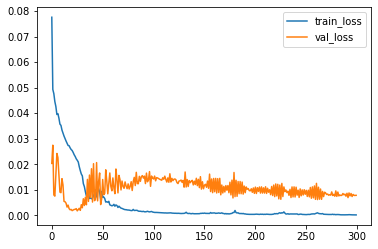

261 ./models/v2/KR_me_N_lb8_best.h5


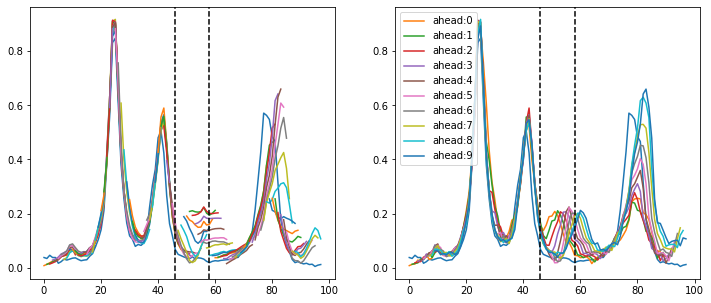

mode: ME-S
val size: 46 test_size: 58


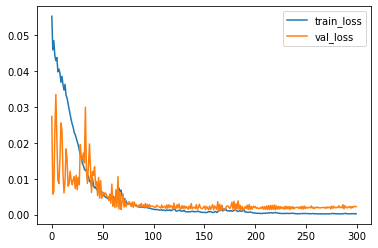

164 ./models/v2/KR_me_S_lb8_best.h5


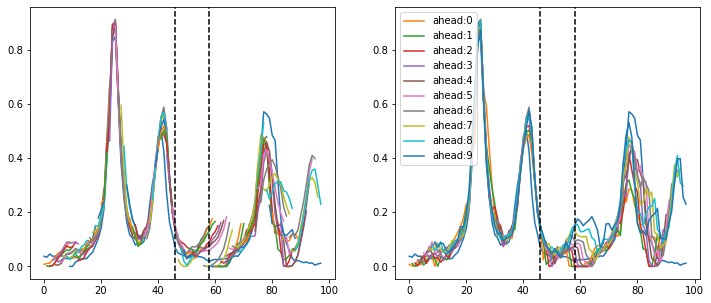

mode: ME-T
val size: 46 test_size: 58


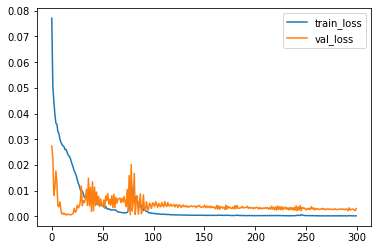

245 ./models/v2/KR_me_T_lb8_best.h5


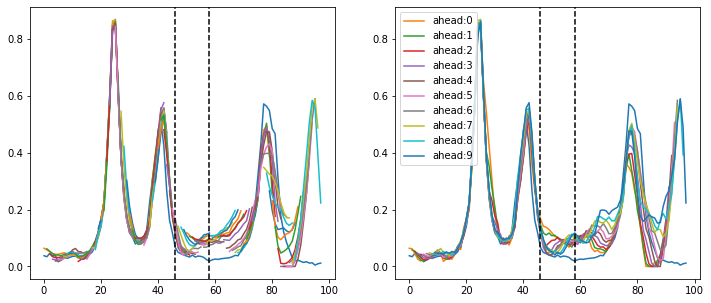

mode: ME-A
val size: 46 test_size: 58


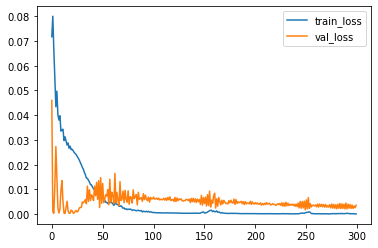

249 ./models/v2/KR_me_A_lb8_best.h5


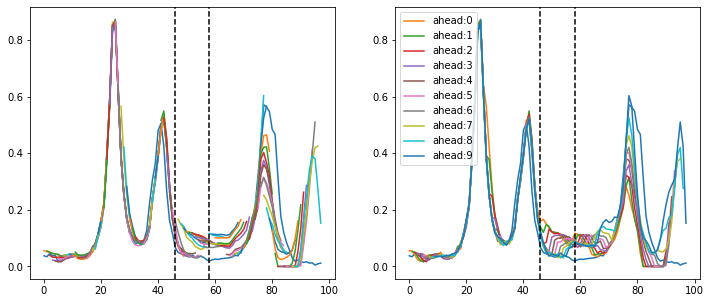

look back: 9
mode: ME-N
val size: 45 test_size: 57


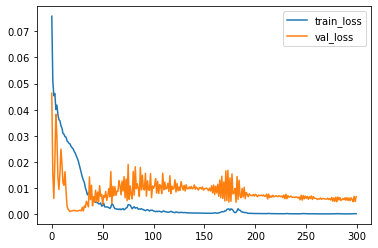

181 ./models/v2/KR_me_N_lb9_best.h5


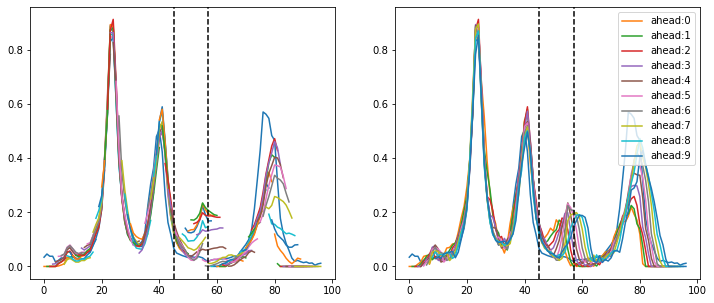

mode: ME-S
val size: 45 test_size: 57


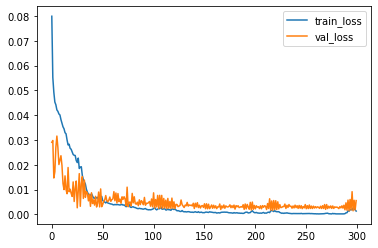

292 ./models/v2/KR_me_S_lb9_best.h5


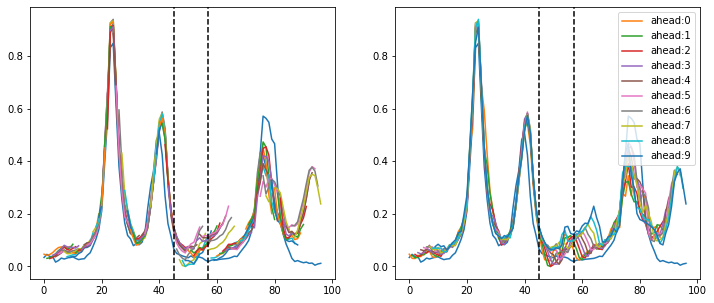

mode: ME-T
val size: 45 test_size: 57


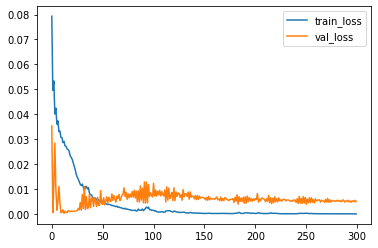

250 ./models/v2/KR_me_T_lb9_best.h5


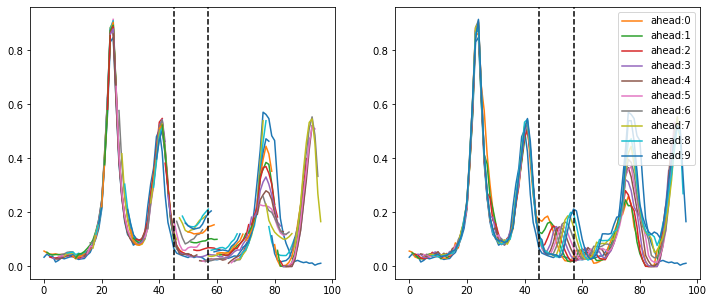

mode: ME-A
val size: 45 test_size: 57


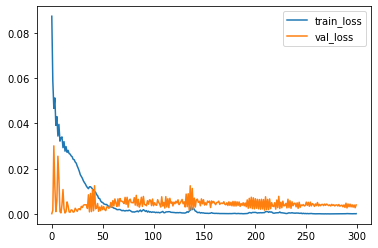

209 ./models/v2/KR_me_A_lb9_best.h5


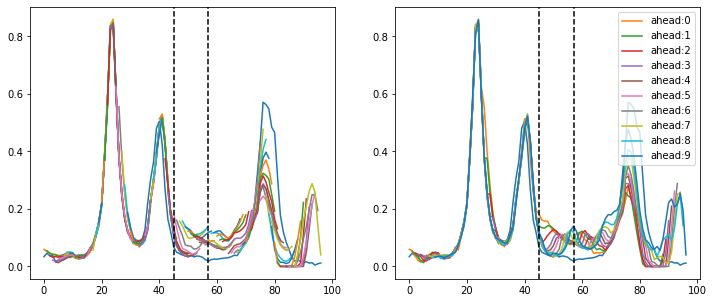

look back: 10
mode: ME-N
val size: 45 test_size: 57


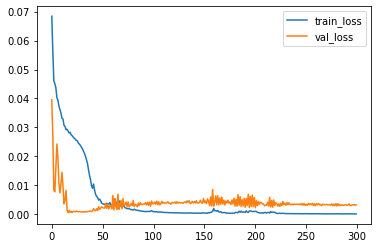

200 ./models/v2/KR_me_N_lb10_best.h5


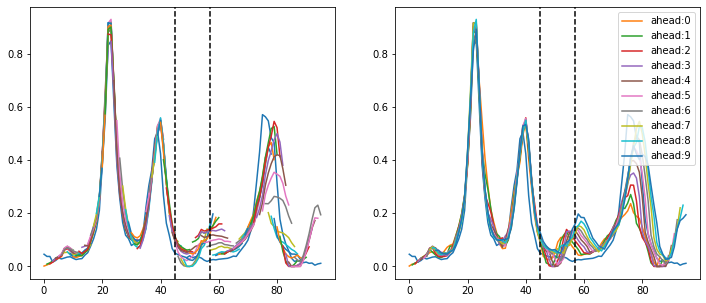

mode: ME-S
val size: 45 test_size: 57


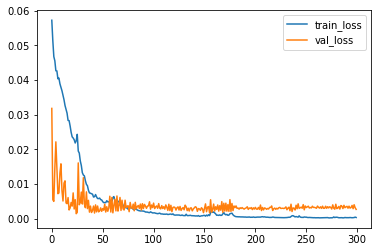

155 ./models/v2/KR_me_S_lb10_best.h5


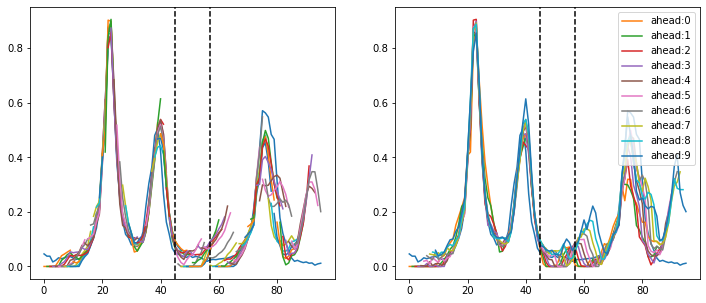

mode: ME-T
val size: 45 test_size: 57


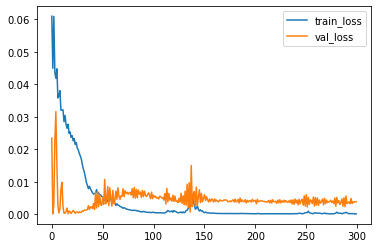

136 ./models/v2/KR_me_T_lb10_best.h5


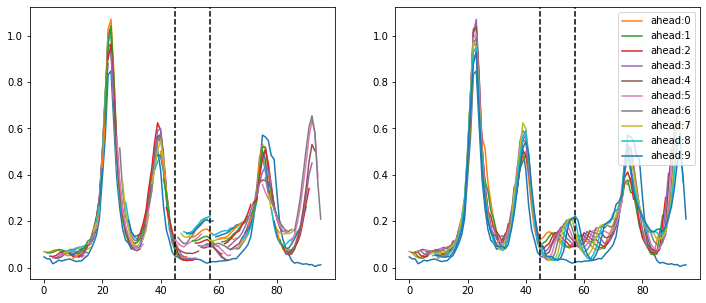

mode: ME-A
val size: 45 test_size: 57


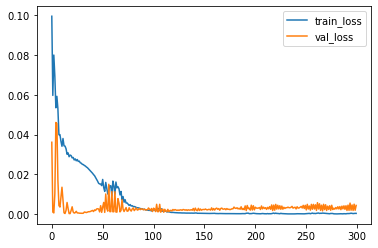

110 ./models/v2/KR_me_A_lb10_best.h5


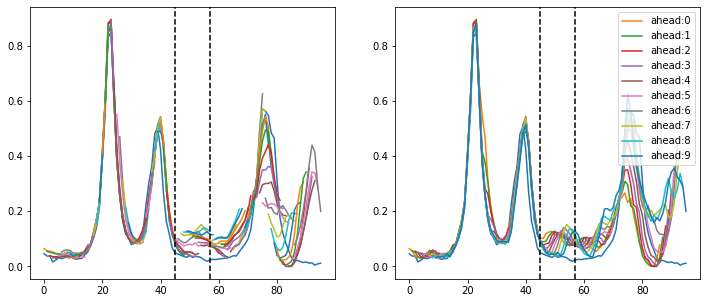

In [496]:
# KR_N,S,T MEDIF , look_back param check

KR_perform_by_lookback = {}
KR_perform_by_model = {}
KR_prd_by_model = {}

mode = 'T'

for look_back in range(3, 11):
    print('look back:', look_back)
    KR_perform_by_lookback[look_back] = {}
    for mode in ['N', 'S', 'T', 'A']:
        mode_name = 'ME-' + mode
        KR_perform_by_model[mode_name] = {}
        print('mode:', mode_name)

        clear_session()

        news_word_num = len(KR_news_max_lag.columns)
        sns_word_num = len(KR_sns_max_lag.columns)
        trend_word_num = len(KR_trends_max_lag.columns)

        me = Multi_Encoder_v2(look_back=look_back, look_ahead=look_ahead,
                              past_year_num=6,
                              news_word_num=news_word_num,
                              sns_word_num=sns_word_num,
                              trend_word_num=trend_word_num,
                              mode=mode)

        available_weeks = KR_trends_norm['weeks'].values[collect_err+max_lag+look_back:-look_ahead+1]
        x, y, val_size, test_size = me.generate_data(KCDC_norm, available_weeks,
                                                     look_back, look_ahead,
                                                     test_split_size=test_split_size,
                                                     val_split_size=val_split_size,
                                                     news_data=KR_news_norm,
                                                     news_lag=KR_news_max_lag,
                                                     sns_data=KR_sns_norm,
                                                     sns_lag=KR_sns_max_lag,
                                                     trends_data=KR_trends_norm,
                                                     trends_lag=KR_trends_max_lag)

        x_train, x_val, x_test, x_total = x
        y_train, y_val, y_test = y

        print('val size:', val_size, 'test_size:', test_size)

        cp = ModelCheckpoint('./models/v2/me_{epoch}.h5')

        history = me.fit(x_train, y_train, x_val, y_val, epochs=epochs, batch_size=batch_size,
                          callbacks=[cp], verbose=0)

        plt.plot(history.history['loss'], label='train_loss')
        plt.plot(history.history['val_loss'], label='val_loss')
        plt.legend()
        plt.show()

        min_epoch = 100
        target_epoch = min_epoch + history.history['val_loss'][min_epoch:].index(
                                        min(history.history['val_loss'][min_epoch:]))
        best_path = './models/v2/KR_me_' + mode + '_lb' + str(look_back) + '_best.h5'
        print(target_epoch, best_path)
        shutil.copy('./models/v2/me_' + str(target_epoch) + '.h5', best_path)


        test_me = Multi_Encoder_v2(look_back=look_back, look_ahead=look_ahead,
                                  past_year_num=past_year_num,
                                  news_word_num=news_word_num,
                                  sns_word_num=sns_word_num,
                                  trend_word_num=trend_word_num,
                                  mode=mode)
        test_me.load_model(best_path)

        start_week = int(available_weeks[0].split('-')[1])
        end_week = int(available_weeks[-1].split('-')[1])
        target_truth = (KCDC_norm.loc[start_week:52, '2018'].tolist() + KCDC_norm.loc[:52, '2019'].tolist()
                        + KCDC_norm.loc[:end_week+look_ahead-1, '2020'].tolist())

        prd_total = []

        for target_idx in range(90-1-look_back+8):
            if mode == 'A':
                enc_outs, news_states, sns_states, trend_states = me.encoder_model.predict([x_total[0][target_idx:target_idx+1],
                                                                                            [x_total[1][target_idx:target_idx+1],
                                                                                             x_total[2][target_idx:target_idx+1],
                                                                                             x_total[3][target_idx:target_idx+1]]])

                dec_input = [x_total[4][target_idx, 0, :].reshape(1, 1, x_total[4].shape[2]),
                             x_total[5][target_idx, 0, :].reshape(1, 1, x_total[5].shape[2]),
                             x_total[6][target_idx, 0, :].reshape(1, 1, x_total[6].shape[2])]
                tmp = []
                for ahead in range(look_ahead):
                    prd, news_states, sns_states, trend_states = me.decoder_model.predict(dec_input + enc_outs 
                                                                      + [news_states, sns_states, trend_states])
                    prd_val = prd[0, 0, 0]
                    if prd_val > 0:
                        tmp.append([prd_val])
                    else:
                        tmp.append([np.random.uniform(1e-6, 1e-5)])

                    if ahead < look_ahead - 1:
                        dec_input = [x_total[4][target_idx, ahead+1, :].reshape(1, 1, x_total[4].shape[2]),
                             x_total[5][target_idx, ahead+1, :].reshape(1, 1, x_total[5].shape[2]),
                             x_total[6][target_idx, ahead+1, :].reshape(1, 1, x_total[6].shape[2])]
                        dec_input[0][0, 0, -1] = prd_val
                        dec_input[1][0, 0, -1] = prd_val
                        dec_input[2][0, 0, -1] = prd_val
            else:
                enc_out, enc_h, enc_c = test_me.encoder_model.predict([x_total[0][target_idx:target_idx+1],
                                                                      x_total[1][target_idx:target_idx+1]])

                dec_input = x_total[2][target_idx, 0, :].reshape(1, 1, x_total[2].shape[2])
                tmp = []
                for ahead in range(look_ahead):
                    prd, dec_h, dec_c = test_me.decoder_model.predict([dec_input] + [enc_out, enc_h, enc_c])
                    prd_val = prd[0, 0, 0]
                    if prd_val > 0:
                        tmp.append([prd_val])
                    else:
                        tmp.append([np.random.uniform(1e-6, 1e-5)])

                    if ahead < look_ahead - 1:
                        dec_input = x_total[2][target_idx, ahead+1, :].reshape(1, 1, x_total[2].shape[2])
                        dec_input[0, 0, -1] = prd_val
                    enc_h, enc_c = dec_h, dec_c
            prd_total.append(tmp)
        prd_total = np.array(prd_total)
        KR_prd_by_model[mode_name] = prd_total

        show_graph(target_truth, prd_total, look_ahead, val_size, test_size)
        prd_train = prd_total[:val_size]
        prd_val = prd_total[val_size:test_size]
        prd_test = prd_total[test_size:]

        rmse_total, mape_total, corr_total = Evaluate.evaluate(target_truth, 
                                                               prd_total, look_ahead)
        rmse_train, mape_train, corr_train = Evaluate.evaluate(target_truth[:val_size+look_ahead], 
                                                               prd_train, look_ahead)
        rmse_val, mape_val, corr_val = Evaluate.evaluate(target_truth[val_size:test_size+look_ahead],
                                                         prd_val, look_ahead)
        rmse_test, mape_test, corr_test = Evaluate.evaluate(target_truth[test_size:],
                                                            prd_test, look_ahead)

        for ahead in range(look_ahead):
            ah = str(ahead+1)
            KR_perform_by_model[mode_name]['total_rmse_' + ah] = rmse_total[ahead]
            KR_perform_by_model[mode_name]['total_mape_' + ah] = mape_total[ahead]
            KR_perform_by_model[mode_name]['total_corr_' + ah] = corr_total[ahead]

            KR_perform_by_model[mode_name]['train_rmse_' + ah] = rmse_train[ahead]
            KR_perform_by_model[mode_name]['train_mape_' + ah] = mape_train[ahead]
            KR_perform_by_model[mode_name]['train_corr_' + ah] = corr_train[ahead]

            KR_perform_by_model[mode_name]['val_rmse_' + ah] = rmse_val[ahead]
            KR_perform_by_model[mode_name]['val_mape_' + ah] = mape_val[ahead]
            KR_perform_by_model[mode_name]['val_corr_' + ah] = corr_val[ahead]

            KR_perform_by_model[mode_name]['test_rmse_' + ah] = rmse_test[ahead]
            KR_perform_by_model[mode_name]['test_mape_' + ah] = mape_test[ahead]
            KR_perform_by_model[mode_name]['test_corr_' + ah] = corr_test[ahead]
#     print(KR_perform_by_model)
    KR_perform_by_lookback[look_back]['perform'] = KR_perform_by_model.copy()
    KR_perform_by_lookback[look_back]['predict'] = KR_prd_by_model.copy()

In [507]:
with open('./data/v2/KR_perform_by_lookback.pkl', 'wb') as f:
    pickle.dump(KR_perform_by_lookback, f)

In [818]:
KR_perform_by_model = {}

for look_back in range(3, 11):
    for mode in ['N', 'S', 'T']:
        mode_name = 'ME-' + mode
        KR_perform_by_model[mode_name] = {}
        
        available_weeks = KR_trends_norm['weeks'].values[collect_err+max_lag+look_back:-look_ahead+1]
        start_week = int(available_weeks[0].split('-')[1])
        end_week = int(available_weeks[-1].split('-')[1])
        
        target_truth = (KCDC_norm.loc[start_week:52, '2018'].tolist() + KCDC_norm.loc[:52, '2019'].tolist()
                        + KCDC_norm.loc[:end_week+look_ahead-1, '2020'].tolist())

        rmse_total, mape_total, corr_total = Evaluate.evaluate(KCDC_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1)), 
                                                               np.array([KCDC_scaler.inverse_transform(_) for _ in KR_perform_by_lookback[look_back]['predict'][mode_name]]),
                                                               look_ahead)
        rmse_train, mape_train, corr_train = Evaluate.evaluate(KCDC_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1))[:val_size+look_ahead], 
                                                               np.array([KCDC_scaler.inverse_transform(_) for _ in KR_perform_by_lookback[look_back]['predict'][mode_name]])[:val_size],
                                                               look_ahead)
        rmse_val, mape_val, corr_val = Evaluate.evaluate(KCDC_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1))[val_size:test_size+look_ahead],
                                                         np.array([KCDC_scaler.inverse_transform(_) for _ in KR_perform_by_lookback[look_back]['predict'][mode_name]])[val_size:test_size],
                                                         look_ahead)
        rmse_test, mape_test, corr_test = Evaluate.evaluate(KCDC_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1))[test_size:],
                                                            np.array([KCDC_scaler.inverse_transform(_) for _ in KR_perform_by_lookback[look_back]['predict'][mode_name]])[test_size:],
                                                            look_ahead)

        for ahead in range(look_ahead):
            ah = str(ahead+1)
            KR_perform_by_model[mode_name]['total_rmse_' + ah] = rmse_total[ahead]
            KR_perform_by_model[mode_name]['total_mape_' + ah] = mape_total[ahead]
            KR_perform_by_model[mode_name]['total_corr_' + ah] = corr_total[ahead]

            KR_perform_by_model[mode_name]['train_rmse_' + ah] = rmse_train[ahead]
            KR_perform_by_model[mode_name]['train_mape_' + ah] = mape_train[ahead]
            KR_perform_by_model[mode_name]['train_corr_' + ah] = corr_train[ahead]

            KR_perform_by_model[mode_name]['val_rmse_' + ah] = rmse_val[ahead]
            KR_perform_by_model[mode_name]['val_mape_' + ah] = mape_val[ahead]
            KR_perform_by_model[mode_name]['val_corr_' + ah] = corr_val[ahead]

            KR_perform_by_model[mode_name]['test_rmse_' + ah] = rmse_test[ahead]
            KR_perform_by_model[mode_name]['test_mape_' + ah] = mape_test[ahead]
            KR_perform_by_model[mode_name]['test_corr_' + ah] = corr_test[ahead]
    KR_perform_by_lookback[look_back]['perform'] = KR_perform_by_model.copy()

In [879]:
lb_compare = {}

for ev in ['rmse', 'mape', 'corr']:
    lb_compare[ev] = []
    for lb in range(3, 11):
        tmp2 = pd.DataFrame(KR_perform_by_lookback[lb]['perform']).T.loc[['ME-N', 'ME-S', 'ME-T']]
        lb_compare[ev].append(tmp2[[c for c in tmp2.columns if 'total' in c and ev in c]].mean(axis=1).mean())

lb_compare = pd.DataFrame(lb_compare, index=[_ for _ in range(3, 11)])
lb_compare['rmse(improve)'] = lb_compare['rmse'].apply(lambda x: (lb_compare['rmse'].max() - x) / lb_compare['rmse'].max())
lb_compare['mape(improve)'] = lb_compare['mape'].apply(lambda x: (lb_compare['mape'].max() - x) / lb_compare['mape'].max())
lb_compare['corr(improve)'] = lb_compare['corr'].apply(lambda x: (x - lb_compare['corr'].min()) / lb_compare['corr'].min())
lb_compare['improve(mean)'] = lb_compare[['rmse(improve)', 'mape(improve)', 'corr(improve)']].mean(axis=1)
lb_compare.to_csv('./data/v2/KR_perform_by_lookback.csv', encoding='utf8')
lb_compare.round(3)

,rmse,mape,corr,rmse(improve),mape(improve),corr(improve),improve(mean)
3,10.077,88.686,0.815,0.023,0.000,0.000,0.008
4,10.314,58.759,0.861,0.000,0.337,0.057,0.131
5,9.132,61.202,0.865,0.115,0.310,0.061,0.162
6,8.424,57.334,0.879,0.183,0.354,0.078,0.205
7,7.979,58.199,0.887,0.226,0.344,0.088,0.219
8,8.139,41.998,0.882,0.211,0.526,0.082,0.273
9,8.556,49.275,0.867,0.170,0.444,0.064,0.226
10,8.121,45.323,0.894,0.213,0.489,0.097,0.266


layer_size: 32
mode: ME-N
32 32
val size: 47 test_size: 59


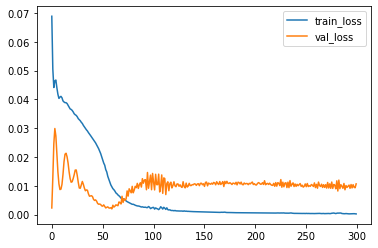

112 ./models/v2/KR_me_N_lb7_best.h5
32 32


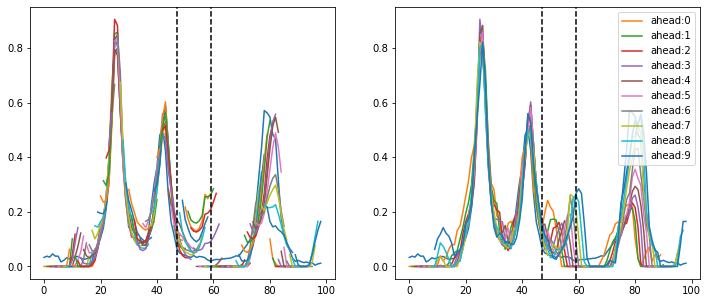

mode: ME-S
32 32
val size: 47 test_size: 59


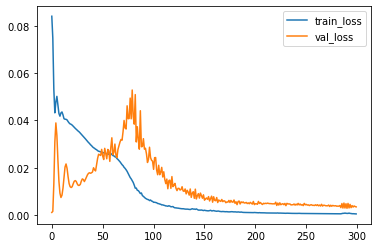

290 ./models/v2/KR_me_S_lb7_best.h5
32 32


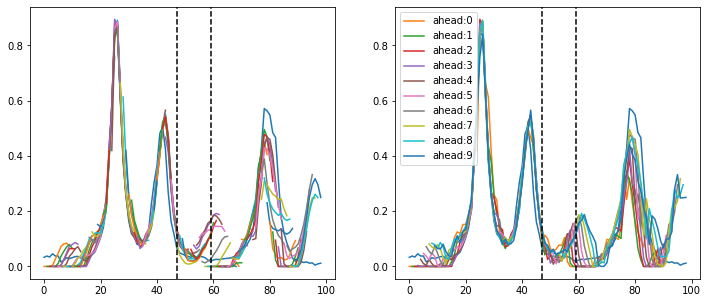

mode: ME-T
32 32
val size: 47 test_size: 59


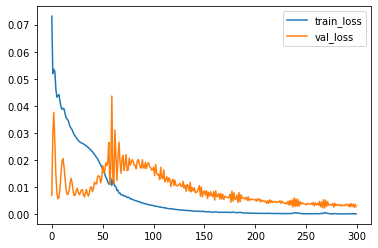

266 ./models/v2/KR_me_T_lb7_best.h5
32 32


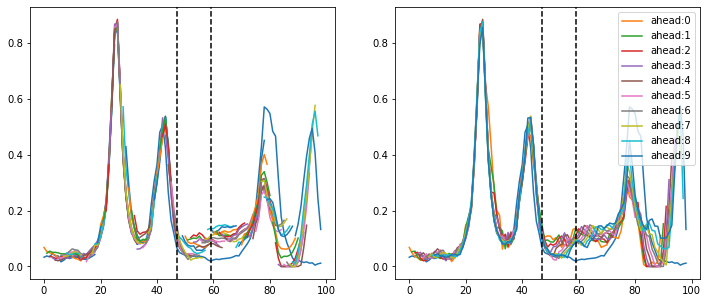

mode: ME-A
32 32
val size: 47 test_size: 59


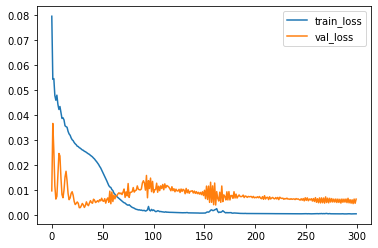

161 ./models/v2/KR_me_A_lb7_best.h5
32 32


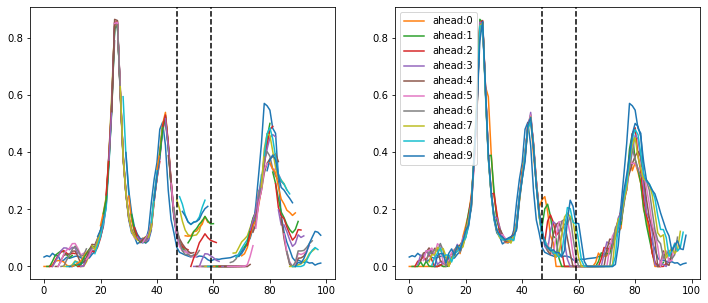

layer_size: 64
mode: ME-N
64 64
val size: 47 test_size: 59


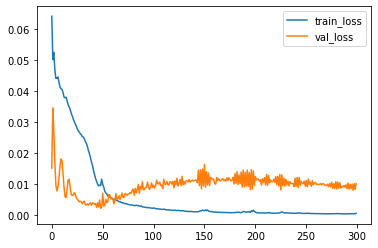

296 ./models/v2/KR_me_N_lb7_best.h5
64 64


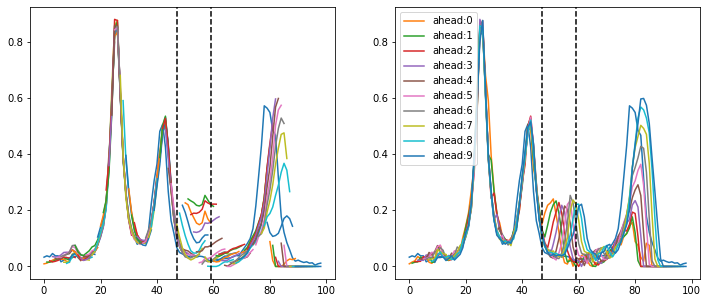

mode: ME-S
64 64
val size: 47 test_size: 59


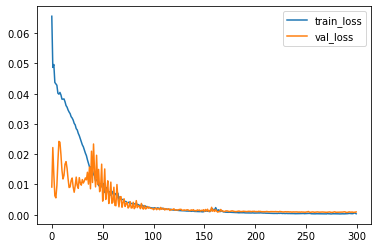

290 ./models/v2/KR_me_S_lb7_best.h5
64 64


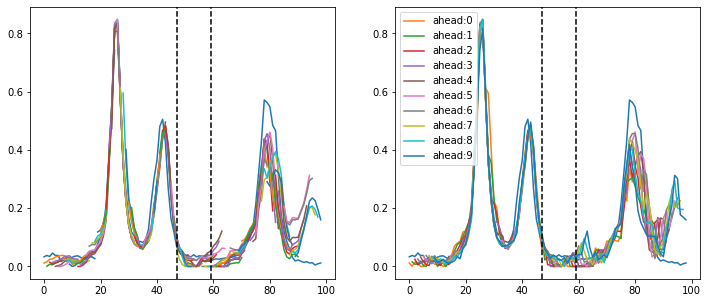

mode: ME-T
64 64
val size: 47 test_size: 59


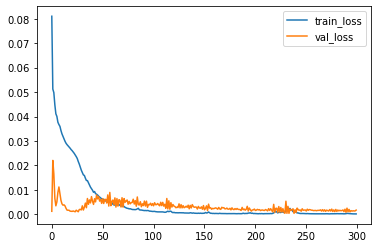

238 ./models/v2/KR_me_T_lb7_best.h5
64 64


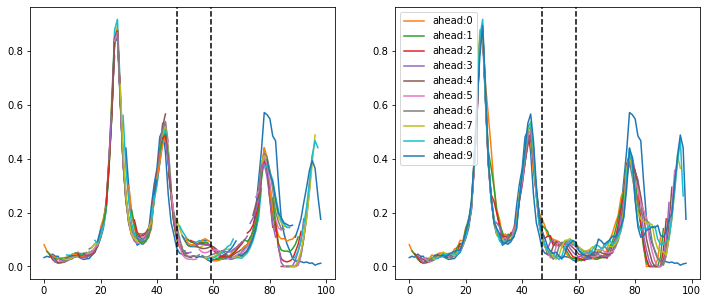

mode: ME-A
64 64
val size: 47 test_size: 59


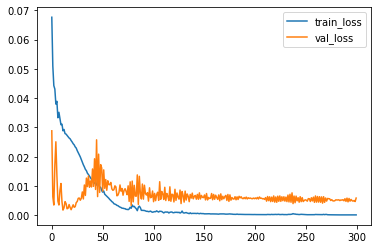

237 ./models/v2/KR_me_A_lb7_best.h5
64 64


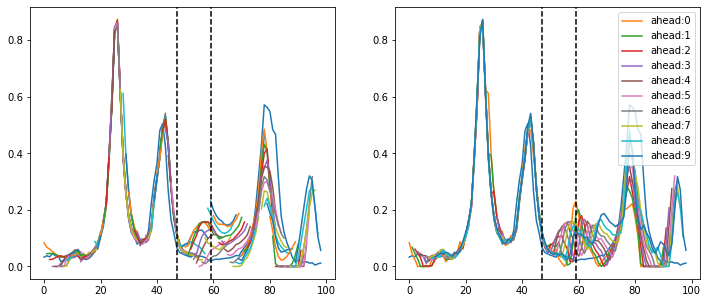

layer_size: 128
mode: ME-N
128 128
val size: 47 test_size: 59


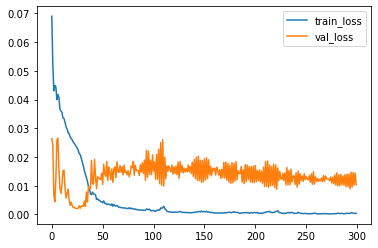

221 ./models/v2/KR_me_N_lb7_best.h5
128 128


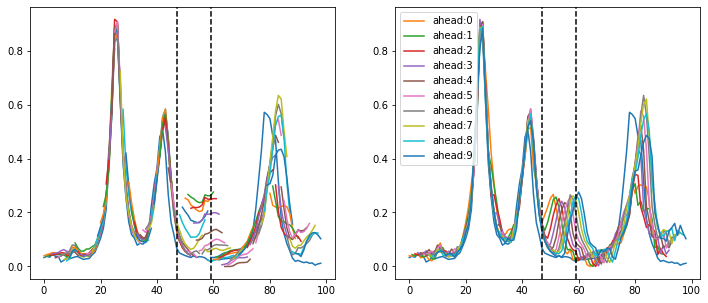

mode: ME-S
128 128
val size: 47 test_size: 59


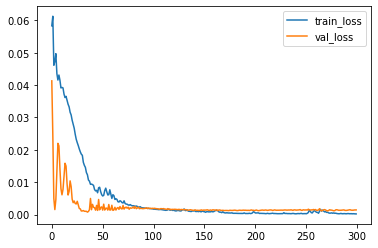

271 ./models/v2/KR_me_S_lb7_best.h5
128 128


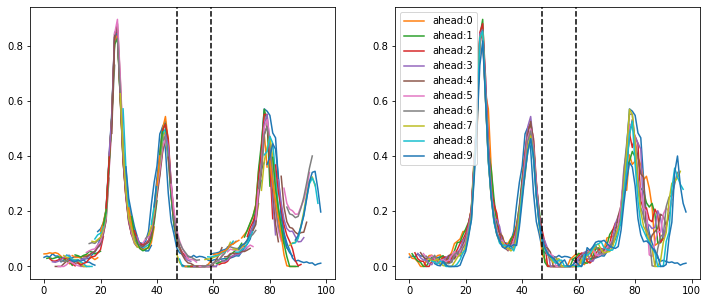

mode: ME-T
128 128
val size: 47 test_size: 59


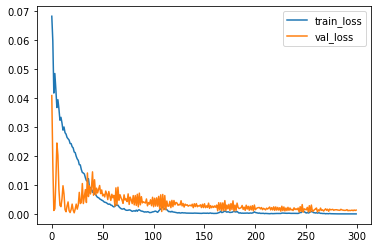

247 ./models/v2/KR_me_T_lb7_best.h5
128 128


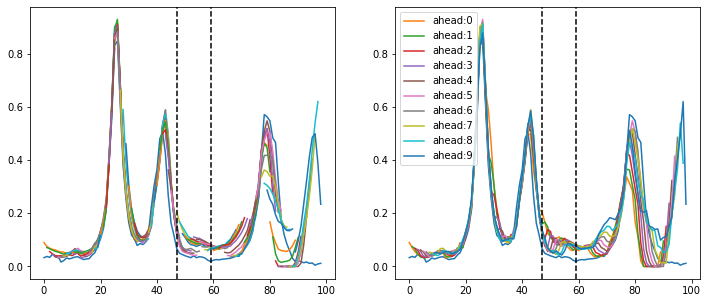

mode: ME-A
128 128
val size: 47 test_size: 59


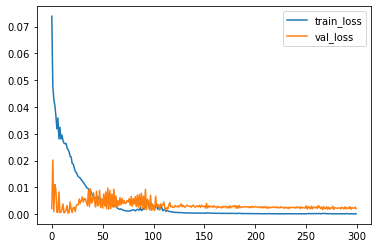

101 ./models/v2/KR_me_A_lb7_best.h5
128 128


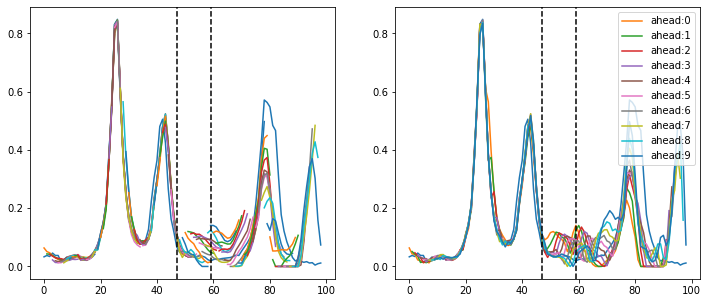

layer_size: 256
mode: ME-N
256 256
val size: 47 test_size: 59


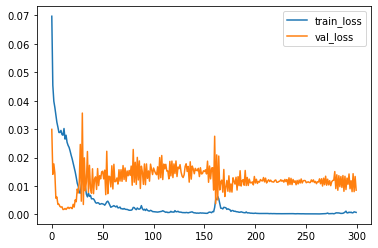

161 ./models/v2/KR_me_N_lb7_best.h5
256 256


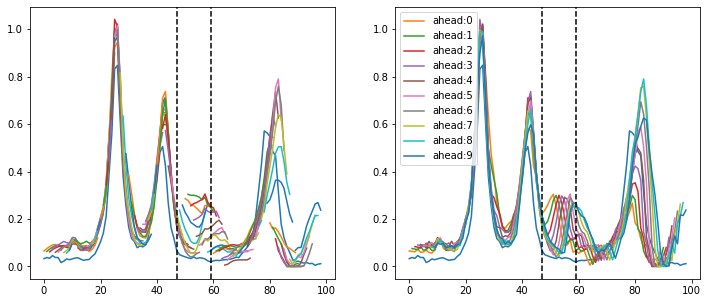

mode: ME-S
256 256
val size: 47 test_size: 59


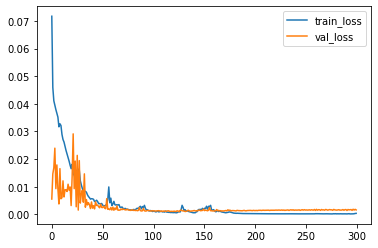

125 ./models/v2/KR_me_S_lb7_best.h5
256 256


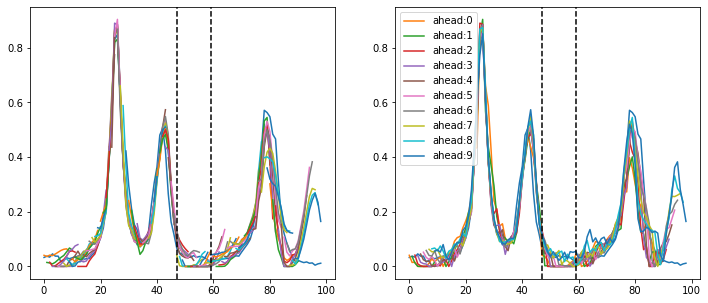

mode: ME-T
256 256
val size: 47 test_size: 59


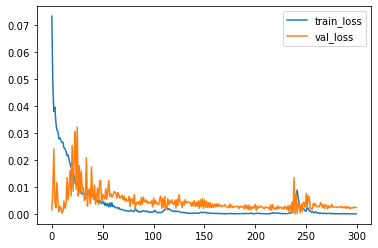

239 ./models/v2/KR_me_T_lb7_best.h5
256 256


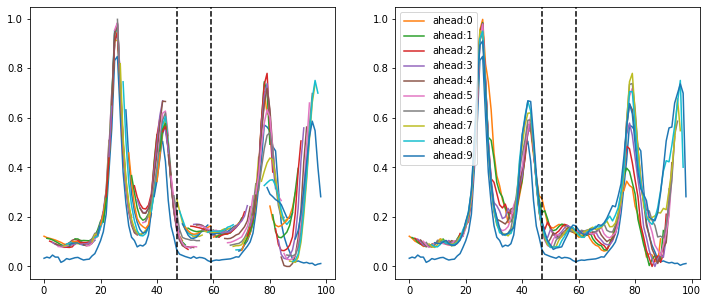

mode: ME-A
256 256
val size: 47 test_size: 59


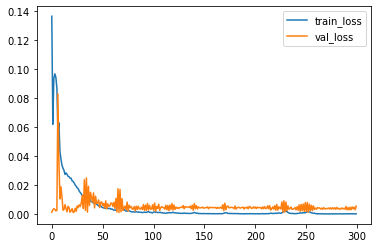

252 ./models/v2/KR_me_A_lb7_best.h5
256 256


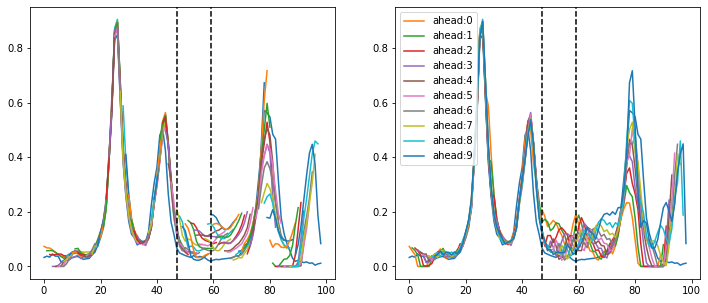

layer_size: 512
mode: ME-N
512 512
val size: 47 test_size: 59


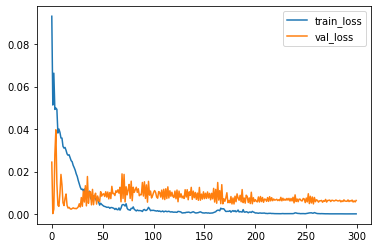

179 ./models/v2/KR_me_N_lb7_best.h5
512 512


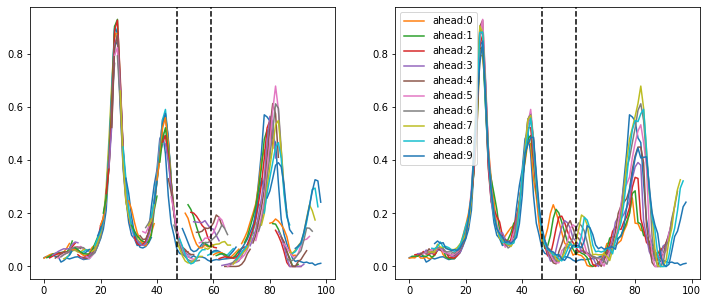

mode: ME-S
512 512
val size: 47 test_size: 59


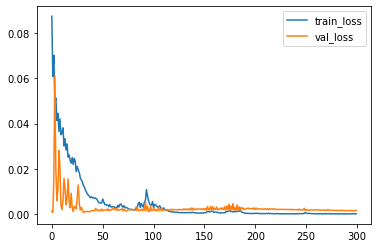

104 ./models/v2/KR_me_S_lb7_best.h5
512 512


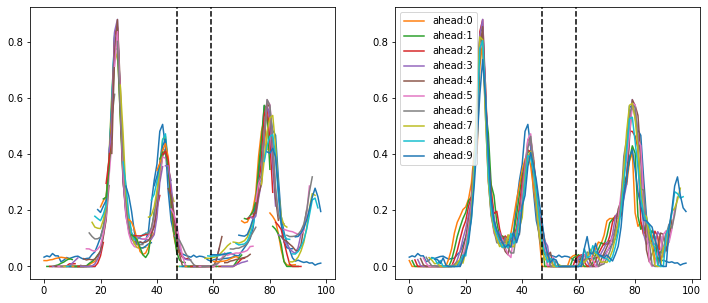

mode: ME-T
512 512
val size: 47 test_size: 59


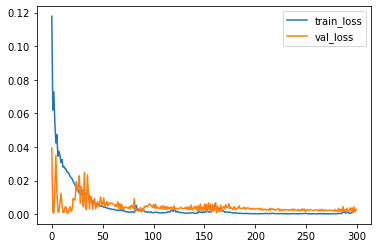

162 ./models/v2/KR_me_T_lb7_best.h5
512 512


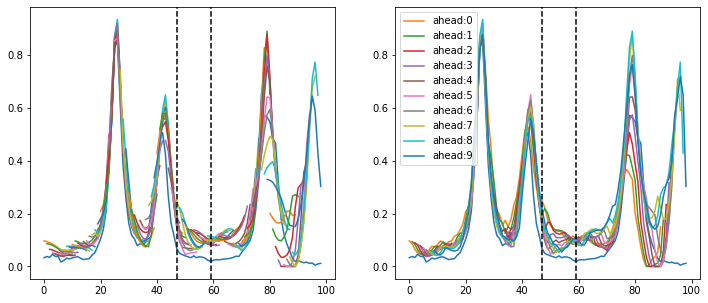

mode: ME-A
512 512
val size: 47 test_size: 59


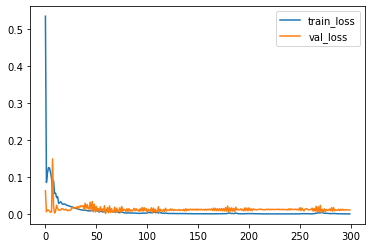

271 ./models/v2/KR_me_A_lb7_best.h5
512 512


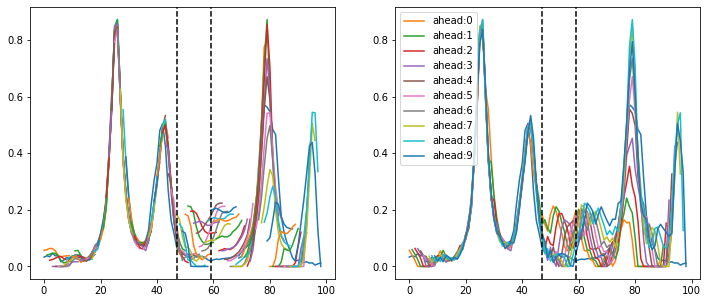

In [518]:
# KR_N,S,T MEDIF , layer_size param check

KR_perform_by_layersize = {}
KR_perform_by_model = {}
KR_prd_by_model = {}

look_back = 7

mode = 'T'

for layer_size in [32, 64, 128, 256, 512]:
    print('layer_size:', layer_size)
    KR_perform_by_layersize[layer_size] = {}
    for mode in ['N', 'S', 'T', 'A']:
        mode_name = 'ME-' + mode
        KR_perform_by_model[mode_name] = {}
        print('mode:', mode_name)

        clear_session()

        news_word_num = len(KR_news_max_lag.columns)
        sns_word_num = len(KR_sns_max_lag.columns)
        trend_word_num = len(KR_trends_max_lag.columns)

        me = Multi_Encoder_v2(look_back=look_back, look_ahead=look_ahead,
                              past_year_num=6,
                              news_word_num=news_word_num,
                              sns_word_num=sns_word_num,
                              trend_word_num=trend_word_num,
                              layer_size=layer_size,
                              mode=mode)

        available_weeks = KR_trends_norm['weeks'].values[collect_err+max_lag+look_back:-look_ahead+1]
        x, y, val_size, test_size = me.generate_data(KCDC_norm, available_weeks,
                                                     look_back, look_ahead,
                                                     test_split_size=test_split_size,
                                                     val_split_size=val_split_size,
                                                     news_data=KR_news_norm,
                                                     news_lag=KR_news_max_lag,
                                                     sns_data=KR_sns_norm,
                                                     sns_lag=KR_sns_max_lag,
                                                     trends_data=KR_trends_norm,
                                                     trends_lag=KR_trends_max_lag)

        x_train, x_val, x_test, x_total = x
        y_train, y_val, y_test = y

        print('val size:', val_size, 'test_size:', test_size)

        cp = ModelCheckpoint('./models/v2/me_{epoch}.h5')

        history = me.fit(x_train, y_train, x_val, y_val, epochs=epochs, batch_size=batch_size,
                          callbacks=[cp], verbose=0)

        plt.plot(history.history['loss'], label='train_loss')
        plt.plot(history.history['val_loss'], label='val_loss')
        plt.legend()
        plt.show()

        min_epoch = 100
        target_epoch = min_epoch + history.history['val_loss'][min_epoch:].index(
                                        min(history.history['val_loss'][min_epoch:]))
        best_path = './models/v2/KR_me_' + mode + '_lb' + str(look_back) + '_best.h5'
        print(target_epoch, best_path)
        shutil.copy('./models/v2/me_' + str(target_epoch) + '.h5', best_path)


        test_me = Multi_Encoder_v2(look_back=look_back, look_ahead=look_ahead,
                                  past_year_num=past_year_num,
                                  news_word_num=news_word_num,
                                  sns_word_num=sns_word_num,
                                  trend_word_num=trend_word_num,
                                  layer_size=layer_size,
                                  mode=mode)
        test_me.load_model(best_path)

        start_week = int(available_weeks[0].split('-')[1])
        end_week = int(available_weeks[-1].split('-')[1])
        target_truth = (KCDC_norm.loc[start_week:52, '2018'].tolist() + KCDC_norm.loc[:52, '2019'].tolist()
                        + KCDC_norm.loc[:end_week+look_ahead-1, '2020'].tolist())

        prd_total = []

        for target_idx in range(90-1-look_back+8):
            if mode == 'A':
                enc_outs, news_states, sns_states, trend_states = me.encoder_model.predict([x_total[0][target_idx:target_idx+1],
                                                                                            [x_total[1][target_idx:target_idx+1],
                                                                                             x_total[2][target_idx:target_idx+1],
                                                                                             x_total[3][target_idx:target_idx+1]]])

                dec_input = [x_total[4][target_idx, 0, :].reshape(1, 1, x_total[4].shape[2]),
                             x_total[5][target_idx, 0, :].reshape(1, 1, x_total[5].shape[2]),
                             x_total[6][target_idx, 0, :].reshape(1, 1, x_total[6].shape[2])]
                tmp = []
                for ahead in range(look_ahead):
                    prd, news_states, sns_states, trend_states = me.decoder_model.predict(dec_input + enc_outs 
                                                                      + [news_states, sns_states, trend_states])
                    prd_val = prd[0, 0, 0]
                    if prd_val > 0:
                        tmp.append([prd_val])
                    else:
                        tmp.append([np.random.uniform(1e-6, 1e-5)])

                    if ahead < look_ahead - 1:
                        dec_input = [x_total[4][target_idx, ahead+1, :].reshape(1, 1, x_total[4].shape[2]),
                             x_total[5][target_idx, ahead+1, :].reshape(1, 1, x_total[5].shape[2]),
                             x_total[6][target_idx, ahead+1, :].reshape(1, 1, x_total[6].shape[2])]
                        dec_input[0][0, 0, -1] = prd_val
                        dec_input[1][0, 0, -1] = prd_val
                        dec_input[2][0, 0, -1] = prd_val
            else:
                enc_out, enc_h, enc_c = test_me.encoder_model.predict([x_total[0][target_idx:target_idx+1],
                                                                      x_total[1][target_idx:target_idx+1]])

                dec_input = x_total[2][target_idx, 0, :].reshape(1, 1, x_total[2].shape[2])
                tmp = []
                for ahead in range(look_ahead):
                    prd, dec_h, dec_c = test_me.decoder_model.predict([dec_input] + [enc_out, enc_h, enc_c])
                    prd_val = prd[0, 0, 0]
                    if prd_val > 0:
                        tmp.append([prd_val])
                    else:
                        tmp.append([np.random.uniform(1e-6, 1e-5)])

                    if ahead < look_ahead - 1:
                        dec_input = x_total[2][target_idx, ahead+1, :].reshape(1, 1, x_total[2].shape[2])
                        dec_input[0, 0, -1] = prd_val
                    enc_h, enc_c = dec_h, dec_c
            prd_total.append(tmp)
        prd_total = np.array(prd_total)
        KR_prd_by_model[mode_name] = prd_total

        show_graph(target_truth, prd_total, look_ahead, val_size, test_size)
        prd_train = prd_total[:val_size]
        prd_val = prd_total[val_size:test_size]
        prd_test = prd_total[test_size:]

        rmse_total, mape_total, corr_total = Evaluate.evaluate(target_truth, 
                                                               prd_total, look_ahead)
        rmse_train, mape_train, corr_train = Evaluate.evaluate(target_truth[:val_size+look_ahead], 
                                                               prd_train, look_ahead)
        rmse_val, mape_val, corr_val = Evaluate.evaluate(target_truth[val_size:test_size+look_ahead],
                                                         prd_val, look_ahead)
        rmse_test, mape_test, corr_test = Evaluate.evaluate(target_truth[test_size:],
                                                            prd_test, look_ahead)

        for ahead in range(look_ahead):
            ah = str(ahead+1)
            KR_perform_by_model[mode_name]['total_rmse_' + ah] = rmse_total[ahead]
            KR_perform_by_model[mode_name]['total_mape_' + ah] = mape_total[ahead]
            KR_perform_by_model[mode_name]['total_corr_' + ah] = corr_total[ahead]

            KR_perform_by_model[mode_name]['train_rmse_' + ah] = rmse_train[ahead]
            KR_perform_by_model[mode_name]['train_mape_' + ah] = mape_train[ahead]
            KR_perform_by_model[mode_name]['train_corr_' + ah] = corr_train[ahead]

            KR_perform_by_model[mode_name]['val_rmse_' + ah] = rmse_val[ahead]
            KR_perform_by_model[mode_name]['val_mape_' + ah] = mape_val[ahead]
            KR_perform_by_model[mode_name]['val_corr_' + ah] = corr_val[ahead]

            KR_perform_by_model[mode_name]['test_rmse_' + ah] = rmse_test[ahead]
            KR_perform_by_model[mode_name]['test_mape_' + ah] = mape_test[ahead]
            KR_perform_by_model[mode_name]['test_corr_' + ah] = corr_test[ahead]
#     print(KR_perform_by_model)
    KR_perform_by_layersize[layer_size]['perform'] = KR_perform_by_model.copy()
    KR_perform_by_layersize[layer_size]['predict'] = KR_prd_by_model.copy()

In [520]:
with open('./data/v2/KR_perform_by_layersize.pkl', 'wb') as f:
    pickle.dump(KR_perform_by_layersize, f)

In [829]:
KR_perform_by_model = {}

look_back = 7

for layer_size in [32, 64, 128, 256, 512]:
    for mode in ['N', 'S', 'T']:
        mode_name = 'ME-' + mode
        KR_perform_by_model[mode_name] = {}
        
        available_weeks = KR_trends_norm['weeks'].values[collect_err+max_lag+look_back:-look_ahead+1]
        start_week = int(available_weeks[0].split('-')[1])
        end_week = int(available_weeks[-1].split('-')[1])
        
        target_truth = (KCDC_norm.loc[start_week:52, '2018'].tolist() + KCDC_norm.loc[:52, '2019'].tolist()
                        + KCDC_norm.loc[:end_week+look_ahead-1, '2020'].tolist())

        rmse_total, mape_total, corr_total = Evaluate.evaluate(KCDC_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1)), 
                                                               np.array([KCDC_scaler.inverse_transform(_) for _ in KR_perform_by_layersize[layer_size]['predict'][mode_name]]),
                                                               look_ahead)
        rmse_train, mape_train, corr_train = Evaluate.evaluate(KCDC_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1))[:val_size+look_ahead], 
                                                               np.array([KCDC_scaler.inverse_transform(_) for _ in KR_perform_by_layersize[layer_size]['predict'][mode_name]])[:val_size],
                                                               look_ahead)
        rmse_val, mape_val, corr_val = Evaluate.evaluate(KCDC_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1))[val_size:test_size+look_ahead],
                                                         np.array([KCDC_scaler.inverse_transform(_) for _ in KR_perform_by_layersize[layer_size]['predict'][mode_name]])[val_size:test_size],
                                                         look_ahead)
        rmse_test, mape_test, corr_test = Evaluate.evaluate(KCDC_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1))[test_size:],
                                                            np.array([KCDC_scaler.inverse_transform(_) for _ in KR_perform_by_layersize[layer_size]['predict'][mode_name]])[test_size:],
                                                            look_ahead)

        for ahead in range(look_ahead):
            ah = str(ahead+1)
            KR_perform_by_model[mode_name]['total_rmse_' + ah] = rmse_total[ahead]
            KR_perform_by_model[mode_name]['total_mape_' + ah] = mape_total[ahead]
            KR_perform_by_model[mode_name]['total_corr_' + ah] = corr_total[ahead]

            KR_perform_by_model[mode_name]['train_rmse_' + ah] = rmse_train[ahead]
            KR_perform_by_model[mode_name]['train_mape_' + ah] = mape_train[ahead]
            KR_perform_by_model[mode_name]['train_corr_' + ah] = corr_train[ahead]

            KR_perform_by_model[mode_name]['val_rmse_' + ah] = rmse_val[ahead]
            KR_perform_by_model[mode_name]['val_mape_' + ah] = mape_val[ahead]
            KR_perform_by_model[mode_name]['val_corr_' + ah] = corr_val[ahead]

            KR_perform_by_model[mode_name]['test_rmse_' + ah] = rmse_test[ahead]
            KR_perform_by_model[mode_name]['test_mape_' + ah] = mape_test[ahead]
            KR_perform_by_model[mode_name]['test_corr_' + ah] = corr_test[ahead]
    KR_perform_by_layersize[layer_size]['perform'] = KR_perform_by_model.copy()

In [880]:
ls_compare = {}

for ev in ['rmse', 'mape', 'corr']:
    ls_compare[ev] = []
    for ls in [32, 64, 128, 256, 512]:
        tmp2 = pd.DataFrame(KR_perform_by_layersize[ls]['perform']).T.loc[['ME-N', 'ME-S', 'ME-T']]
        ls_compare[ev].append(tmp2[[c for c in tmp2.columns if 'total' in c and ev in c]].mean(axis=1).mean())

ls_compare = pd.DataFrame(ls_compare, index=[32, 64, 128, 256, 512])
ls_compare['rmse(improve)'] = ls_compare['rmse'].apply(lambda x: (ls_compare['rmse'].max() - x) / ls_compare['rmse'].max())
ls_compare['mape(improve)'] = ls_compare['mape'].apply(lambda x: (ls_compare['mape'].max() - x) / ls_compare['mape'].max())
ls_compare['corr(improve)'] = ls_compare['corr'].apply(lambda x: (x - ls_compare['corr'].min()) / ls_compare['corr'].min())
ls_compare['improve(mean)'] = ls_compare[['rmse(improve)', 'mape(improve)', 'corr(improve)']].mean(axis=1)
ls_compare.to_csv('./data/v2/KR_perform_by_layersize.csv', encoding='utf8')
ls_compare.round(3)

,rmse,mape,corr,rmse(improve),mape(improve),corr(improve),improve(mean)
32,8.309,83.570,0.867,0.119,0.000,0.000,0.040
64,7.506,54.425,0.889,0.204,0.349,0.025,0.193
128,7.716,49.341,0.889,0.182,0.410,0.026,0.206
256,9.429,53.144,0.883,0.000,0.364,0.018,0.127
512,7.864,57.777,0.900,0.166,0.309,0.039,0.171


threshold: 0.0
mode: ME-N
64 64
val size: 47 test_size: 59


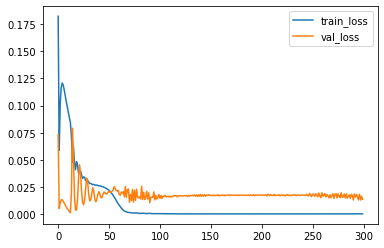

297 ./models/v2/KR_me_N_lb7_best.h5
64 64


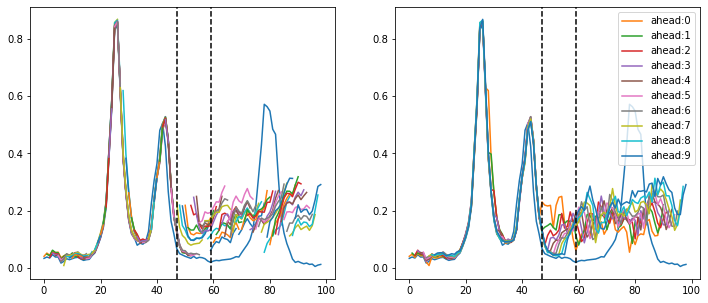

mode: ME-S
64 64
val size: 47 test_size: 59


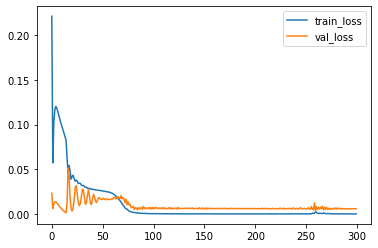

259 ./models/v2/KR_me_S_lb7_best.h5
64 64


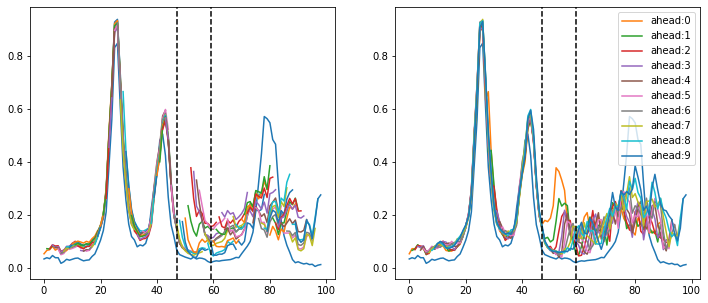

mode: ME-T
64 64
val size: 47 test_size: 59


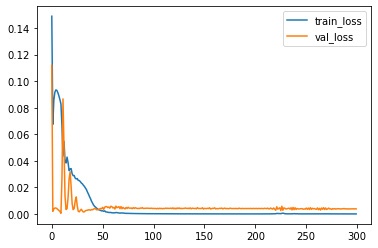

225 ./models/v2/KR_me_T_lb7_best.h5
64 64


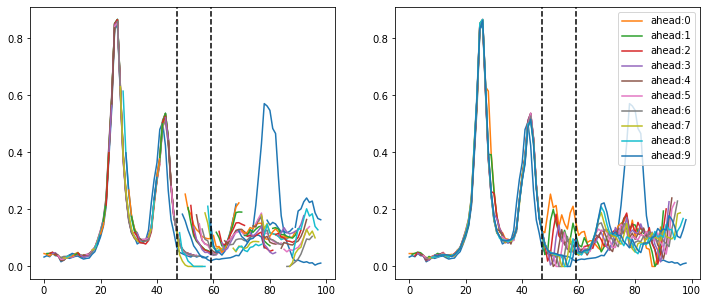

mode: ME-A
64 64
val size: 47 test_size: 59


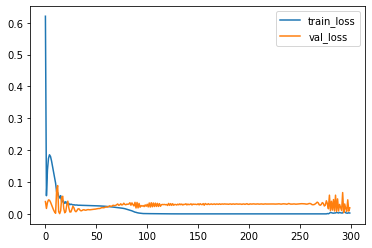

293 ./models/v2/KR_me_A_lb7_best.h5
64 64


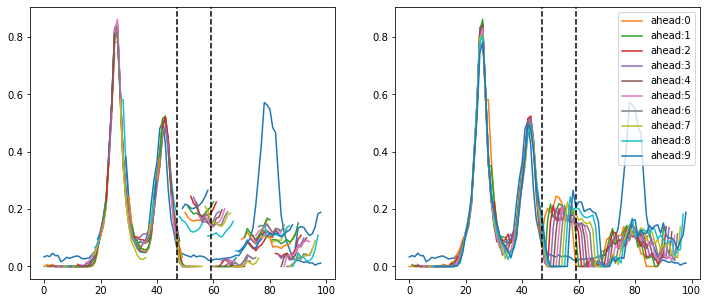

threshold: 0.1
mode: ME-N
64 64
val size: 47 test_size: 59


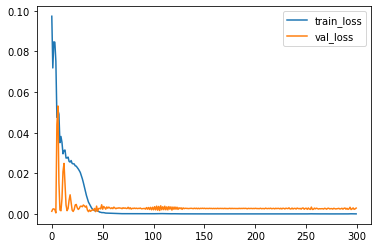

106 ./models/v2/KR_me_N_lb7_best.h5
64 64


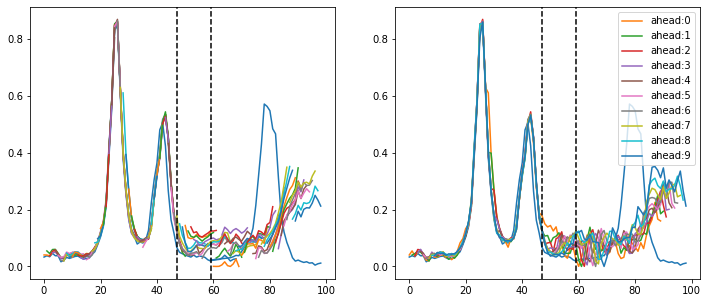

mode: ME-S
64 64
val size: 47 test_size: 59


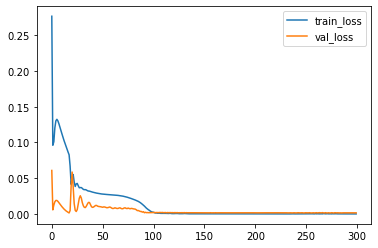

277 ./models/v2/KR_me_S_lb7_best.h5
64 64


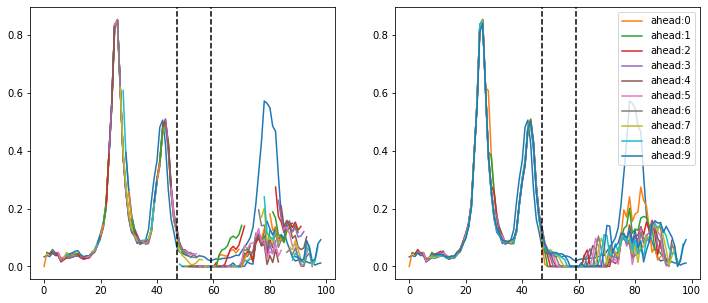

mode: ME-T
64 64
val size: 47 test_size: 59


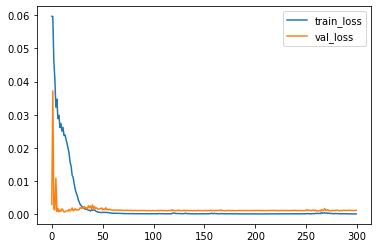

261 ./models/v2/KR_me_T_lb7_best.h5
64 64


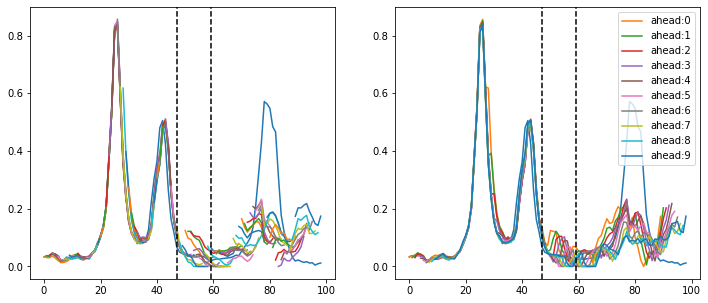

mode: ME-A
64 64
val size: 47 test_size: 59


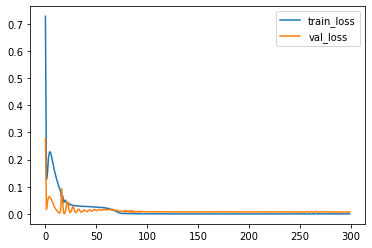

294 ./models/v2/KR_me_A_lb7_best.h5
64 64


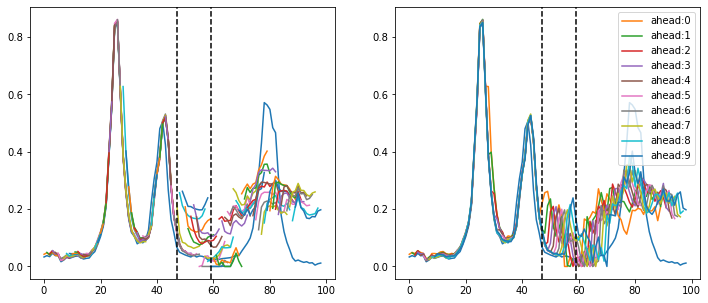

threshold: 0.2
mode: ME-N
64 64
val size: 47 test_size: 59


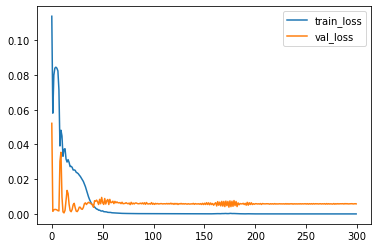

174 ./models/v2/KR_me_N_lb7_best.h5
64 64


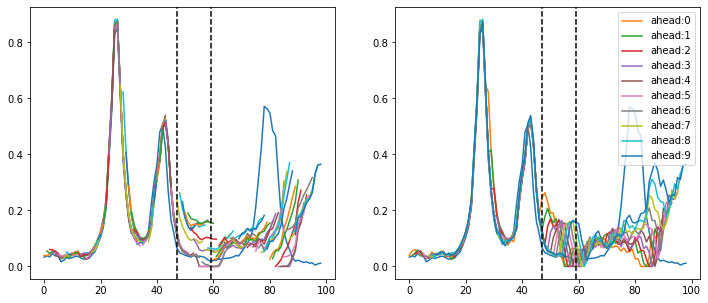

mode: ME-S
64 64
val size: 47 test_size: 59


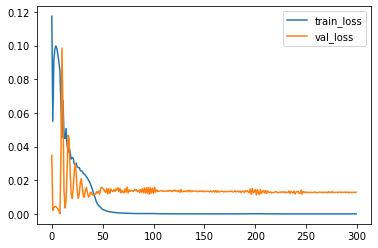

201 ./models/v2/KR_me_S_lb7_best.h5
64 64


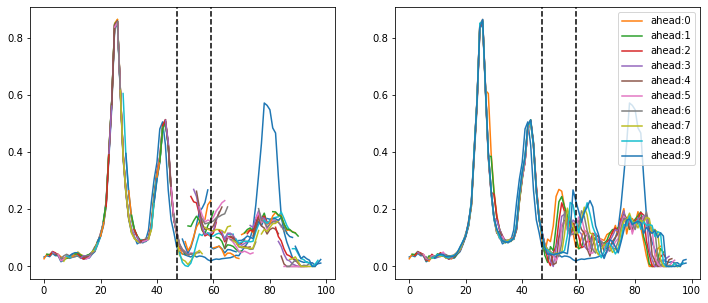

mode: ME-T
64 64
val size: 47 test_size: 59


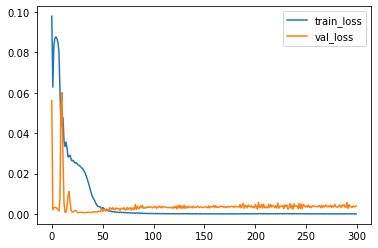

232 ./models/v2/KR_me_T_lb7_best.h5
64 64


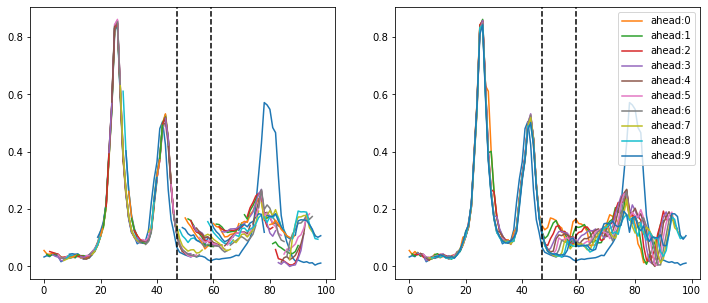

mode: ME-A
64 64
val size: 47 test_size: 59


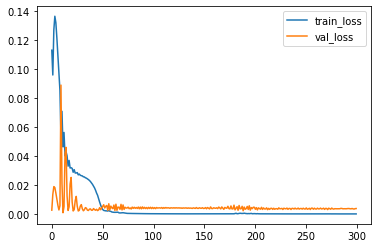

188 ./models/v2/KR_me_A_lb7_best.h5
64 64


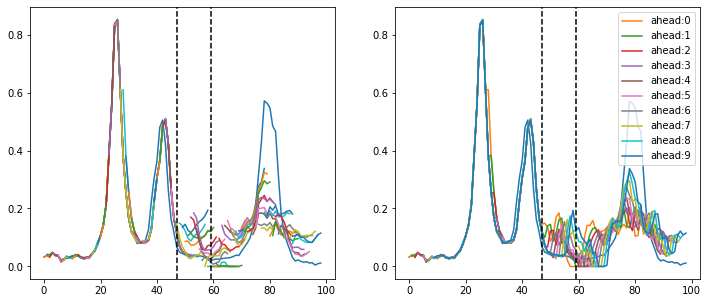

threshold: 0.3
mode: ME-N
64 64
val size: 47 test_size: 59


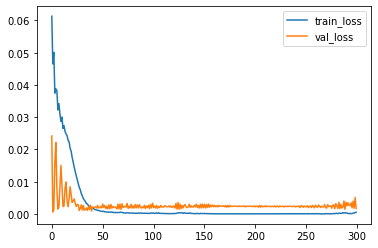

125 ./models/v2/KR_me_N_lb7_best.h5
64 64


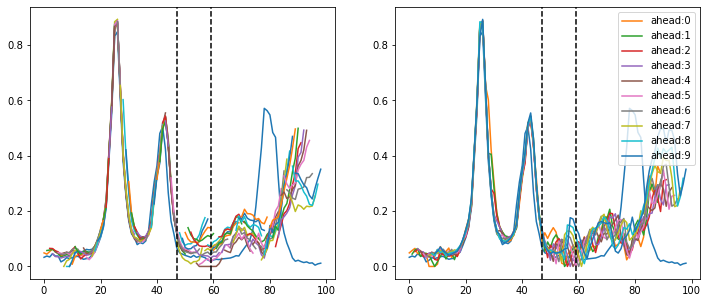

mode: ME-S
64 64
val size: 47 test_size: 59


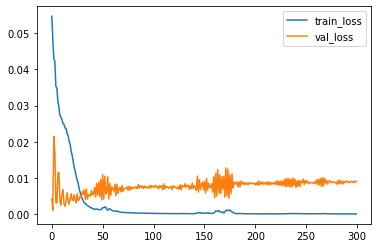

174 ./models/v2/KR_me_S_lb7_best.h5
64 64


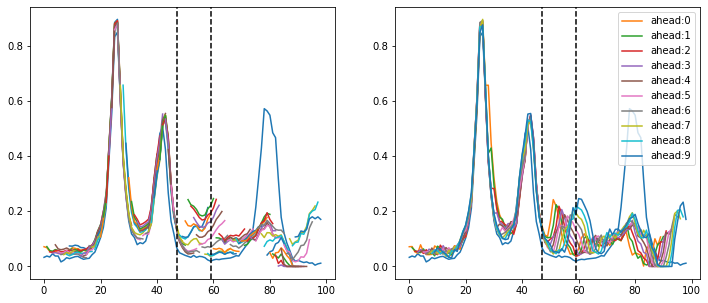

mode: ME-T
64 64
val size: 47 test_size: 59


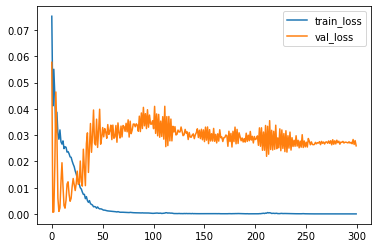

211 ./models/v2/KR_me_T_lb7_best.h5
64 64


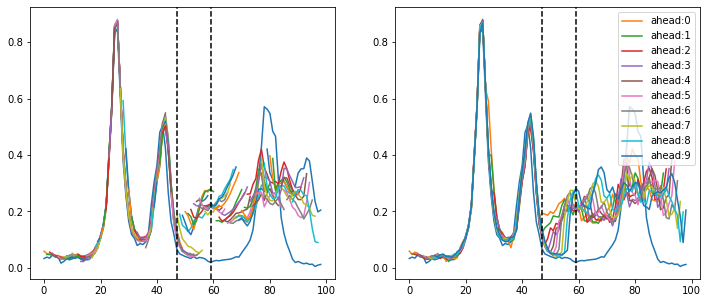

mode: ME-A
64 64
val size: 47 test_size: 59


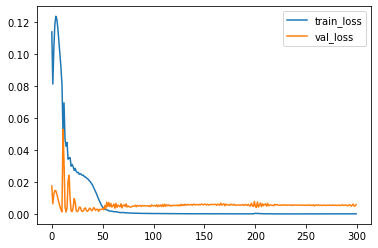

201 ./models/v2/KR_me_A_lb7_best.h5
64 64


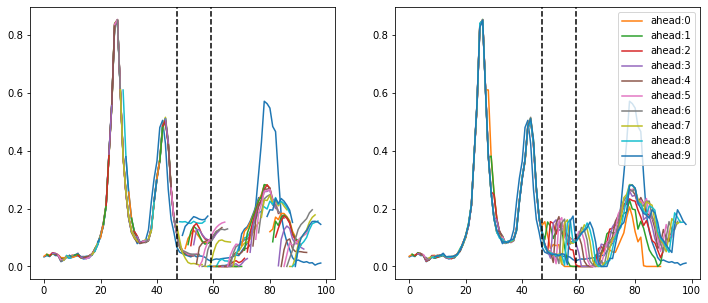

threshold: 0.4
mode: ME-N
64 64
val size: 47 test_size: 59


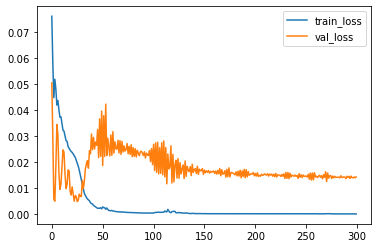

113 ./models/v2/KR_me_N_lb7_best.h5
64 64


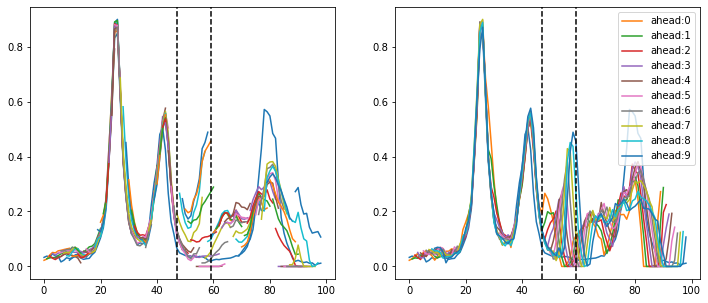

mode: ME-S
64 64
val size: 47 test_size: 59


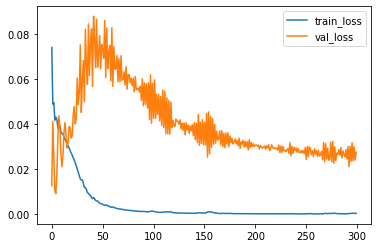

292 ./models/v2/KR_me_S_lb7_best.h5
64 64


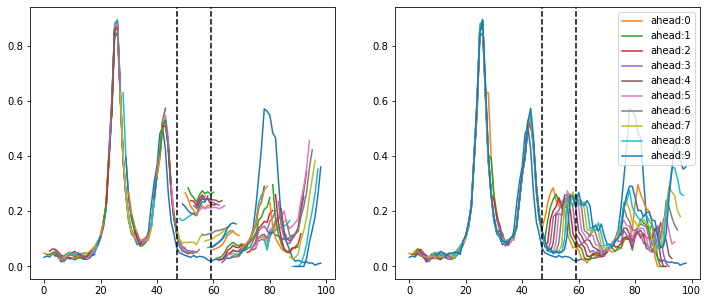

mode: ME-T
64 64
val size: 47 test_size: 59


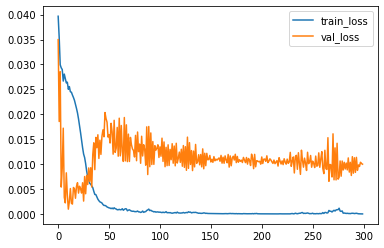

266 ./models/v2/KR_me_T_lb7_best.h5
64 64


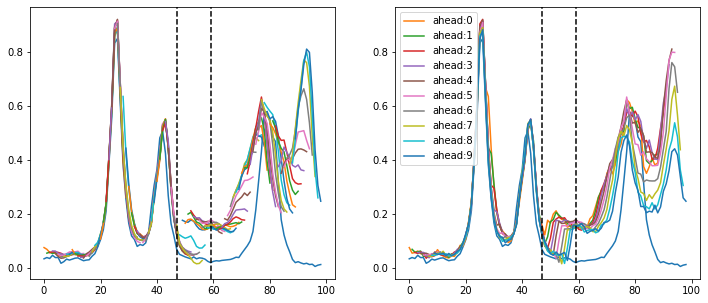

mode: ME-A
64 64
val size: 47 test_size: 59


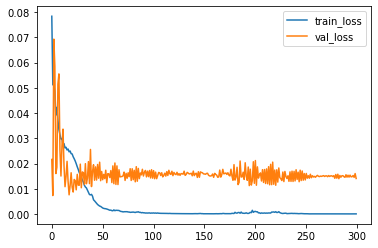

194 ./models/v2/KR_me_A_lb7_best.h5
64 64


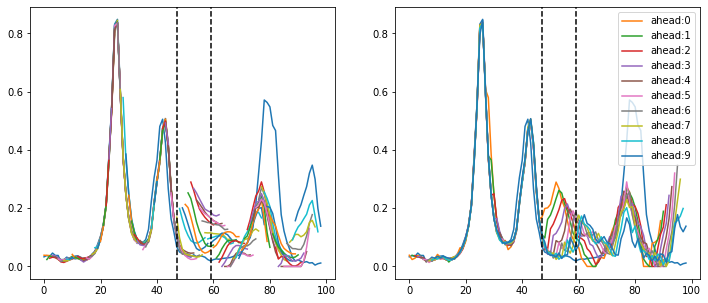

In [585]:
# KR_N,S,T MEDIF , max_lag coef threshold param check

KR_perform_by_coef = {}
KR_perform_by_model = {}
KR_prd_by_model = {}

look_back = 7

mode = 'T'

for threshold in [0.0, 0.1, 0.2, 0.3, 0.4]:
    
    KR_news_tmp_max_lag = {}
    lag_max = KR_news_lag.max()
    lag_max = lag_max[lag_max > threshold]
    for word in lag_max.index:
        lag = KR_news_lag[word].argmax()
        val = KR_news_lag.loc[lag, word]
        if lag >= 0:
            KR_news_tmp_max_lag[word] = (lag, val)
    KR_news_tmp_max_lag = pd.DataFrame(KR_news_tmp_max_lag, index=['max_lag', 'coef'])
    
    KR_sns_tmp_max_lag = {}
    lag_max = KR_sns_lag.max()
    lag_max = lag_max[lag_max > threshold]
    for word in lag_max.index:
        lag = KR_sns_lag[word].argmax()
        val = KR_sns_lag.loc[lag, word]
        if lag >= 0:
            KR_sns_tmp_max_lag[word] = (lag, val)
    KR_sns_tmp_max_lag = pd.DataFrame(KR_sns_tmp_max_lag, index=['max_lag', 'coef'])
    
    KR_trends_tmp_max_lag = {}
    lag_max = KR_trends_lag.max()
    lag_max = lag_max[lag_max > threshold]
    for word in lag_max.index:
        lag = KR_trends_lag[word].argmax()
        val = KR_trends_lag.loc[lag, word]
        if lag >= 0:
            KR_trends_tmp_max_lag[word] = (lag, val)
    KR_trends_tmp_max_lag = pd.DataFrame(KR_trends_tmp_max_lag, index=['max_lag', 'coef'])
    
    print('threshold:', threshold)
    KR_perform_by_coef[threshold] = {}
    for mode in ['N', 'S', 'T', 'A']:
        mode_name = 'ME-' + mode
        KR_perform_by_model[mode_name] = {}
        print('mode:', mode_name)

        clear_session()

        news_word_num = len(KR_news_tmp_max_lag.columns)
        sns_word_num = len(KR_sns_tmp_max_lag.columns)
        trend_word_num = len(KR_trends_tmp_max_lag.columns)

        me = Multi_Encoder_v2(look_back=look_back, look_ahead=look_ahead,
                              past_year_num=6,
                              news_word_num=news_word_num,
                              sns_word_num=sns_word_num,
                              trend_word_num=trend_word_num,
                              mode=mode)

        available_weeks = KR_trends_norm['weeks'].values[collect_err+max_lag+look_back:-look_ahead+1]
        x, y, val_size, test_size = me.generate_data(KCDC_norm, available_weeks,
                                                     look_back, look_ahead,
                                                     test_split_size=test_split_size,
                                                     val_split_size=val_split_size,
                                                     news_data=KR_news_norm,
                                                     news_lag=KR_news_tmp_max_lag,
                                                     sns_data=KR_sns_norm,
                                                     sns_lag=KR_sns_tmp_max_lag,
                                                     trends_data=KR_trends_norm,
                                                     trends_lag=KR_trends_tmp_max_lag)

        x_train, x_val, x_test, x_total = x
        y_train, y_val, y_test = y

        print('val size:', val_size, 'test_size:', test_size)

        cp = ModelCheckpoint('./models/v2/me_{epoch}.h5')

        history = me.fit(x_train, y_train, x_val, y_val, epochs=epochs, batch_size=batch_size,
                          callbacks=[cp], verbose=0)

        plt.plot(history.history['loss'], label='train_loss')
        plt.plot(history.history['val_loss'], label='val_loss')
        plt.legend()
        plt.show()

        min_epoch = 100
        target_epoch = min_epoch + history.history['val_loss'][min_epoch:].index(
                                        min(history.history['val_loss'][min_epoch:]))
        best_path = './models/v2/KR_me_' + mode + '_lb' + str(look_back) + '_best.h5'
        print(target_epoch, best_path)
        shutil.copy('./models/v2/me_' + str(target_epoch) + '.h5', best_path)


        test_me = Multi_Encoder_v2(look_back=look_back, look_ahead=look_ahead,
                                  past_year_num=past_year_num,
                                  news_word_num=news_word_num,
                                  sns_word_num=sns_word_num,
                                  trend_word_num=trend_word_num,
                                  mode=mode)
        test_me.load_model(best_path)

        start_week = int(available_weeks[0].split('-')[1])
        end_week = int(available_weeks[-1].split('-')[1])
        target_truth = (KCDC_norm.loc[start_week:52, '2018'].tolist() + KCDC_norm.loc[:52, '2019'].tolist()
                        + KCDC_norm.loc[:end_week+look_ahead-1, '2020'].tolist())

        prd_total = []

        for target_idx in range(90-1-look_back+8):
            if mode == 'A':
                enc_outs, news_states, sns_states, trend_states = me.encoder_model.predict([x_total[0][target_idx:target_idx+1],
                                                                                            [x_total[1][target_idx:target_idx+1],
                                                                                             x_total[2][target_idx:target_idx+1],
                                                                                             x_total[3][target_idx:target_idx+1]]])

                dec_input = [x_total[4][target_idx, 0, :].reshape(1, 1, x_total[4].shape[2]),
                             x_total[5][target_idx, 0, :].reshape(1, 1, x_total[5].shape[2]),
                             x_total[6][target_idx, 0, :].reshape(1, 1, x_total[6].shape[2])]
                tmp = []
                for ahead in range(look_ahead):
                    prd, news_states, sns_states, trend_states = me.decoder_model.predict(dec_input + enc_outs 
                                                                      + [news_states, sns_states, trend_states])
                    prd_val = prd[0, 0, 0]
                    if prd_val > 0:
                        tmp.append([prd_val])
                    else:
                        tmp.append([np.random.uniform(1e-6, 1e-5)])

                    if ahead < look_ahead - 1:
                        dec_input = [x_total[4][target_idx, ahead+1, :].reshape(1, 1, x_total[4].shape[2]),
                             x_total[5][target_idx, ahead+1, :].reshape(1, 1, x_total[5].shape[2]),
                             x_total[6][target_idx, ahead+1, :].reshape(1, 1, x_total[6].shape[2])]
                        dec_input[0][0, 0, -1] = prd_val
                        dec_input[1][0, 0, -1] = prd_val
                        dec_input[2][0, 0, -1] = prd_val
            else:
                enc_out, enc_h, enc_c = test_me.encoder_model.predict([x_total[0][target_idx:target_idx+1],
                                                                      x_total[1][target_idx:target_idx+1]])

                dec_input = x_total[2][target_idx, 0, :].reshape(1, 1, x_total[2].shape[2])
                tmp = []
                for ahead in range(look_ahead):
                    prd, dec_h, dec_c = test_me.decoder_model.predict([dec_input] + [enc_out, enc_h, enc_c])
                    prd_val = prd[0, 0, 0]
                    if prd_val > 0:
                        tmp.append([prd_val])
                    else:
                        tmp.append([np.random.uniform(1e-6, 1e-5)])

                    if ahead < look_ahead - 1:
                        dec_input = x_total[2][target_idx, ahead+1, :].reshape(1, 1, x_total[2].shape[2])
                        dec_input[0, 0, -1] = prd_val
                    enc_h, enc_c = dec_h, dec_c
            prd_total.append(tmp)
        prd_total = np.array(prd_total)
        KR_prd_by_model[mode_name] = prd_total

        show_graph(target_truth, prd_total, look_ahead, val_size, test_size)
        prd_train = prd_total[:val_size]
        prd_val = prd_total[val_size:test_size]
        prd_test = prd_total[test_size:]

        rmse_total, mape_total, corr_total = Evaluate.evaluate(target_truth, 
                                                               prd_total, look_ahead)
        rmse_train, mape_train, corr_train = Evaluate.evaluate(target_truth[:val_size+look_ahead], 
                                                               prd_train, look_ahead)
        rmse_val, mape_val, corr_val = Evaluate.evaluate(target_truth[val_size:test_size+look_ahead],
                                                         prd_val, look_ahead)
        rmse_test, mape_test, corr_test = Evaluate.evaluate(target_truth[test_size:],
                                                            prd_test, look_ahead)

        for ahead in range(look_ahead):
            ah = str(ahead+1)
            KR_perform_by_model[mode_name]['total_rmse_' + ah] = rmse_total[ahead]
            KR_perform_by_model[mode_name]['total_mape_' + ah] = mape_total[ahead]
            KR_perform_by_model[mode_name]['total_corr_' + ah] = corr_total[ahead]

            KR_perform_by_model[mode_name]['train_rmse_' + ah] = rmse_train[ahead]
            KR_perform_by_model[mode_name]['train_mape_' + ah] = mape_train[ahead]
            KR_perform_by_model[mode_name]['train_corr_' + ah] = corr_train[ahead]

            KR_perform_by_model[mode_name]['val_rmse_' + ah] = rmse_val[ahead]
            KR_perform_by_model[mode_name]['val_mape_' + ah] = mape_val[ahead]
            KR_perform_by_model[mode_name]['val_corr_' + ah] = corr_val[ahead]

            KR_perform_by_model[mode_name]['test_rmse_' + ah] = rmse_test[ahead]
            KR_perform_by_model[mode_name]['test_mape_' + ah] = mape_test[ahead]
            KR_perform_by_model[mode_name]['test_corr_' + ah] = corr_test[ahead]
#     print(KR_perform_by_model)
    KR_perform_by_coef[threshold]['perform'] = KR_perform_by_model.copy()
    KR_perform_by_coef[threshold]['predict'] = KR_prd_by_model.copy()

In [614]:
with open('./data/v2/KR_perform_by_coef.pkl', 'wb') as f:
    pickle.dump(KR_perform_by_coef, f)

In [852]:
KR_perform_by_model = {}

look_back = 7

for threshold in [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6]:
    for mode in ['N', 'S', 'T']:
        mode_name = 'ME-' + mode
        KR_perform_by_model[mode_name] = {}
        
        available_weeks = KR_trends_norm['weeks'].values[collect_err+max_lag+look_back:-look_ahead+1]
        start_week = int(available_weeks[0].split('-')[1])
        end_week = int(available_weeks[-1].split('-')[1])
        
        target_truth = (KCDC_norm.loc[start_week:52, '2018'].tolist() + KCDC_norm.loc[:52, '2019'].tolist()
                        + KCDC_norm.loc[:end_week+look_ahead-1, '2020'].tolist())

        rmse_total, mape_total, corr_total = Evaluate.evaluate(KCDC_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1)), 
                                                               np.array([KCDC_scaler.inverse_transform(_) for _ in KR_perform_by_coef[threshold]['predict'][mode_name]]),
                                                               look_ahead)
        rmse_train, mape_train, corr_train = Evaluate.evaluate(KCDC_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1))[:val_size+look_ahead], 
                                                               np.array([KCDC_scaler.inverse_transform(_) for _ in KR_perform_by_coef[threshold]['predict'][mode_name]])[:val_size],
                                                               look_ahead)
        rmse_val, mape_val, corr_val = Evaluate.evaluate(KCDC_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1))[val_size:test_size+look_ahead],
                                                         np.array([KCDC_scaler.inverse_transform(_) for _ in KR_perform_by_coef[threshold]['predict'][mode_name]])[val_size:test_size],
                                                         look_ahead)
        rmse_test, mape_test, corr_test = Evaluate.evaluate(KCDC_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1))[test_size:],
                                                            np.array([KCDC_scaler.inverse_transform(_) for _ in KR_perform_by_coef[threshold]['predict'][mode_name]])[test_size:],
                                                            look_ahead)

        for ahead in range(look_ahead):
            ah = str(ahead+1)
            KR_perform_by_model[mode_name]['total_rmse_' + ah] = rmse_total[ahead]
            KR_perform_by_model[mode_name]['total_mape_' + ah] = mape_total[ahead]
            KR_perform_by_model[mode_name]['total_corr_' + ah] = corr_total[ahead]

            KR_perform_by_model[mode_name]['train_rmse_' + ah] = rmse_train[ahead]
            KR_perform_by_model[mode_name]['train_mape_' + ah] = mape_train[ahead]
            KR_perform_by_model[mode_name]['train_corr_' + ah] = corr_train[ahead]

            KR_perform_by_model[mode_name]['val_rmse_' + ah] = rmse_val[ahead]
            KR_perform_by_model[mode_name]['val_mape_' + ah] = mape_val[ahead]
            KR_perform_by_model[mode_name]['val_corr_' + ah] = corr_val[ahead]

            KR_perform_by_model[mode_name]['test_rmse_' + ah] = rmse_test[ahead]
            KR_perform_by_model[mode_name]['test_mape_' + ah] = mape_test[ahead]
            KR_perform_by_model[mode_name]['test_corr_' + ah] = corr_test[ahead]
    KR_perform_by_coef[threshold]['perform'] = KR_perform_by_model.copy()

In [859]:
coef_compare = {'N': {}, 'S': {}, 'T': {}, 'mean': {}}

for ev in ['rmse', 'mape', 'corr']:
    coef_compare['N'][ev] = []
    coef_compare['S'][ev] = []
    coef_compare['T'][ev] = []
    coef_compare['mean'][ev] = []
    for coef_threshold in [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6]:
        tmp2 = pd.DataFrame(KR_perform_by_coef[coef_threshold]['perform']).T.loc[['ME-N', 'ME-S', 'ME-T']]
        n, s, t = tmp2[[c for c in tmp2.columns if 'total' in c and ev in c]].mean(axis=1).values
        
        coef_compare['N'][ev].append(n)
        coef_compare['S'][ev].append(s)
        coef_compare['T'][ev].append(t)
        coef_compare['mean'][ev].append(tmp2[[c for c in tmp2.columns if 'total' in c and ev in c]].mean(axis=1).mean())
        
for mode in ['N', 'S', 'T', 'mean']:
    coef_compare[mode] = pd.DataFrame(coef_compare[mode], index=[0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6])
    coef_compare[mode]['rmse(improve)'] = coef_compare[mode]['rmse'].apply(lambda x: (coef_compare[mode]['rmse'].max() - x) / coef_compare[mode]['rmse'].max())
    coef_compare[mode]['mape(improve)'] = coef_compare[mode]['mape'].apply(lambda x: (coef_compare[mode]['mape'].max() - x) / coef_compare[mode]['mape'].max())
    coef_compare[mode]['corr(improve)'] = coef_compare[mode]['corr'].apply(lambda x: (x - coef_compare[mode]['corr'].min()) / coef_compare[mode]['corr'].min())
    coef_compare[mode]['improve(mean)'] = coef_compare[mode][['rmse(improve)', 'mape(improve)', 'corr(improve)']].mean(axis=1)
    coef_compare[mode].to_csv('./data/v2/KR_perform_by_coef_' + mode + '.csv', encoding='utf8')

In [881]:
coef_compare['mean'].round(3)

,rmse,mape,corr,rmse(improve),mape(improve),corr(improve),improve(mean)
0.0,10.709,53.135,0.783,0.092,0.371,0.053,0.172
0.1,10.610,70.909,0.778,0.100,0.161,0.046,0.102
0.2,10.200,58.050,0.788,0.135,0.313,0.060,0.169
0.3,11.655,59.516,0.744,0.011,0.296,0.000,0.102
0.4,11.789,48.802,0.780,0.000,0.423,0.048,0.157
0.5,8.512,43.556,0.863,0.278,0.485,0.160,0.307
0.6,8.751,84.511,0.855,0.258,0.000,0.150,0.136


===== threshold: 0 =====
mode: ME-N
64 64
val size: 47 test_size: 59


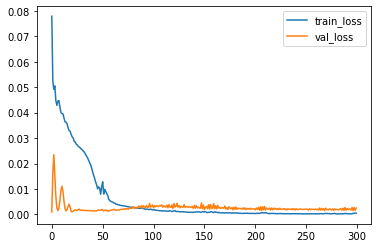

296 ./models/v2/KR_me_N_lb7_best.h5
64 64


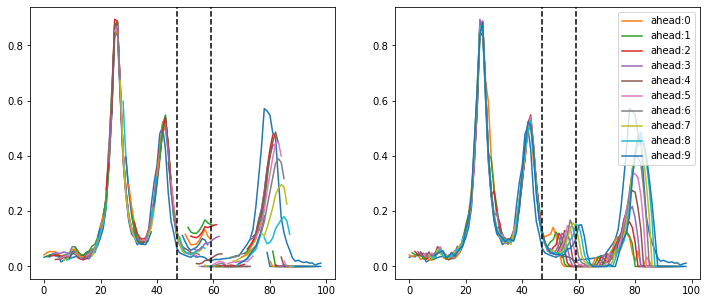

mode: ME-S
64 64
val size: 47 test_size: 59


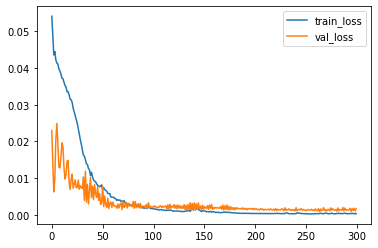

263 ./models/v2/KR_me_S_lb7_best.h5
64 64


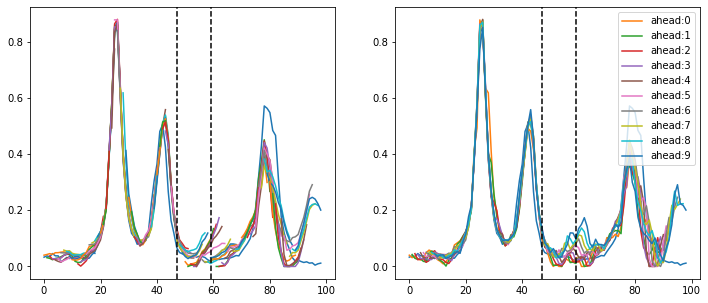

mode: ME-T
64 64
val size: 47 test_size: 59


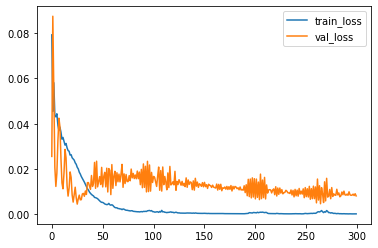

264 ./models/v2/KR_me_T_lb7_best.h5
64 64


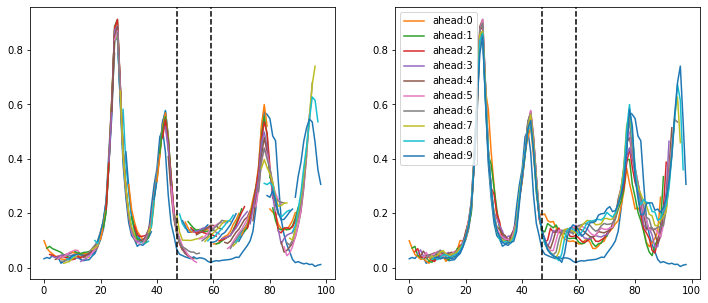

mode: ME-A
64 64
val size: 47 test_size: 59


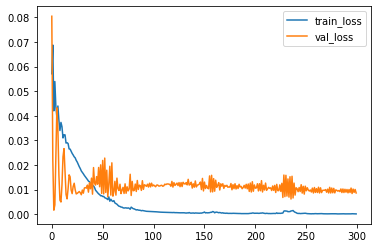

235 ./models/v2/KR_me_A_lb7_best.h5
64 64


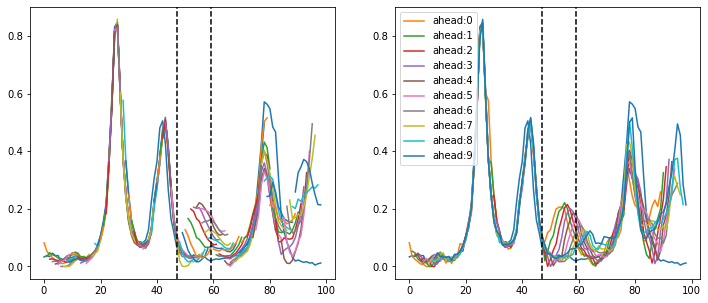

===== threshold: 1 =====
mode: ME-N
64 64
val size: 47 test_size: 59


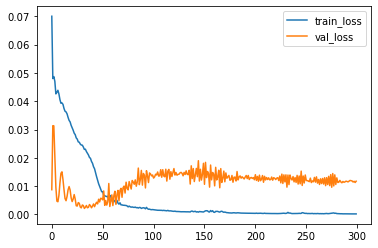

165 ./models/v2/KR_me_N_lb7_best.h5
64 64


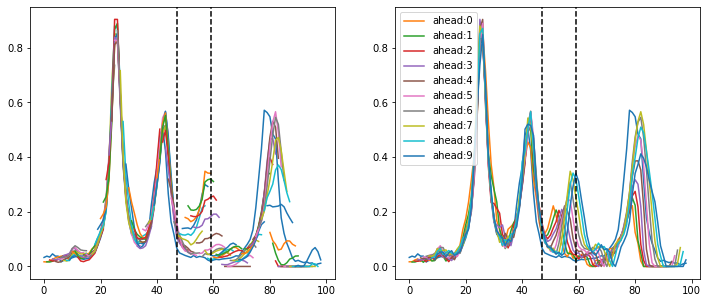

mode: ME-S
64 64
val size: 47 test_size: 59


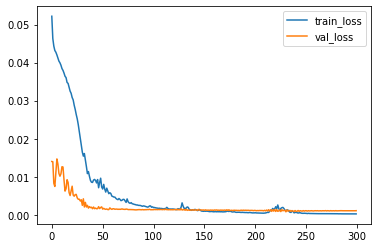

230 ./models/v2/KR_me_S_lb7_best.h5
64 64


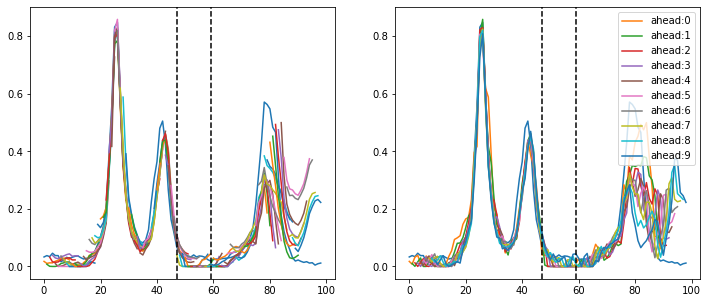

mode: ME-T
64 64
val size: 47 test_size: 59


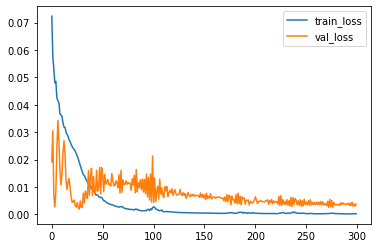

276 ./models/v2/KR_me_T_lb7_best.h5
64 64


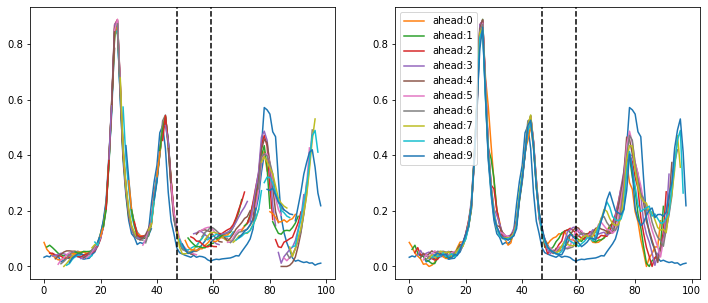

mode: ME-A
64 64
val size: 47 test_size: 59


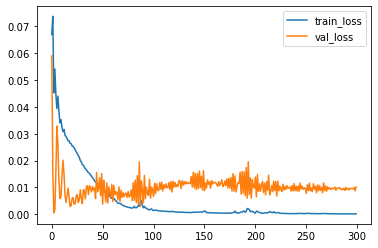

192 ./models/v2/KR_me_A_lb7_best.h5
64 64


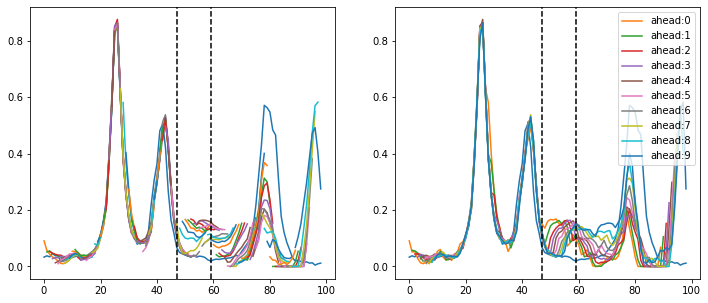

===== threshold: 2 =====
mode: ME-N
64 64
val size: 47 test_size: 59


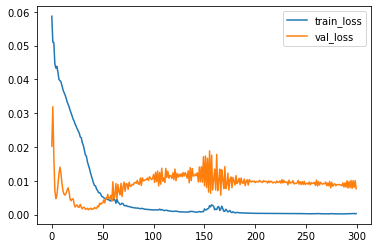

166 ./models/v2/KR_me_N_lb7_best.h5
64 64


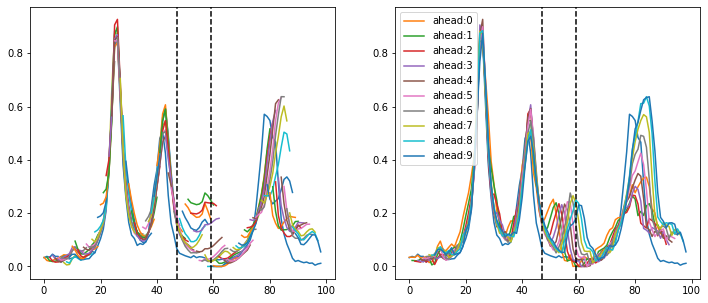

mode: ME-S
64 64
val size: 47 test_size: 59


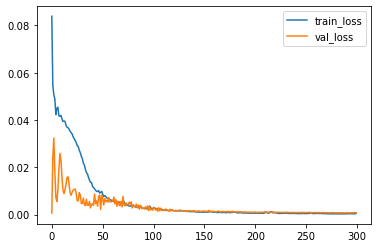

293 ./models/v2/KR_me_S_lb7_best.h5
64 64


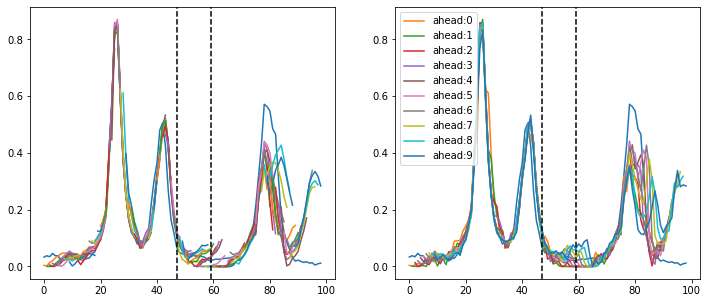

mode: ME-T
64 64
val size: 47 test_size: 59


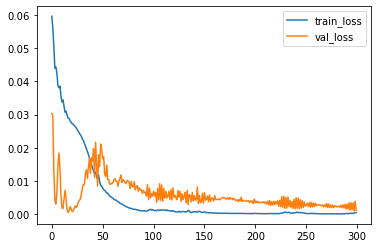

297 ./models/v2/KR_me_T_lb7_best.h5
64 64


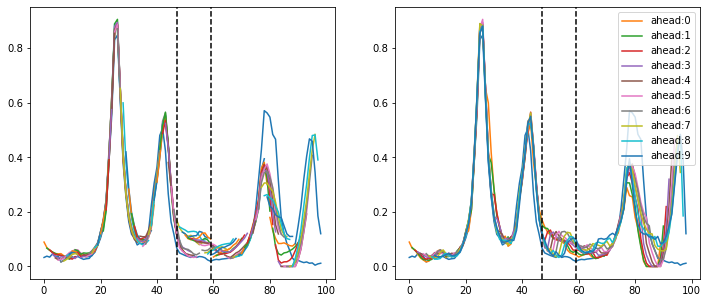

mode: ME-A
64 64
val size: 47 test_size: 59


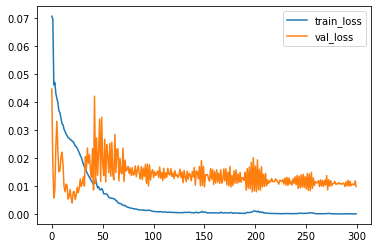

197 ./models/v2/KR_me_A_lb7_best.h5
64 64


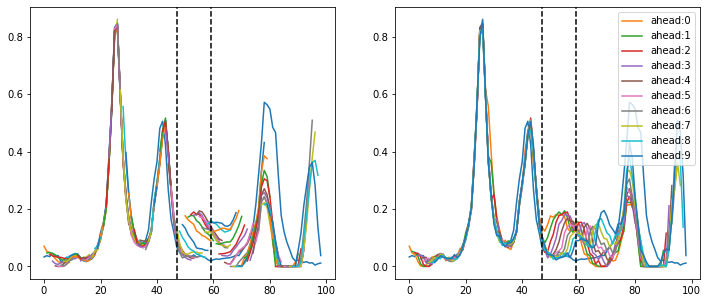

===== threshold: 3 =====
mode: ME-N
64 64
val size: 47 test_size: 59


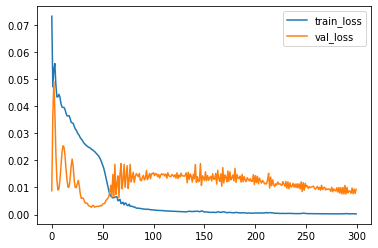

289 ./models/v2/KR_me_N_lb7_best.h5
64 64


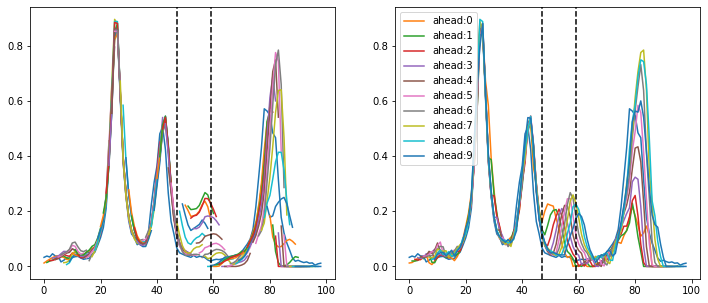

mode: ME-S
64 64
val size: 47 test_size: 59


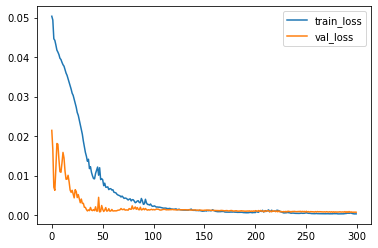

289 ./models/v2/KR_me_S_lb7_best.h5
64 64


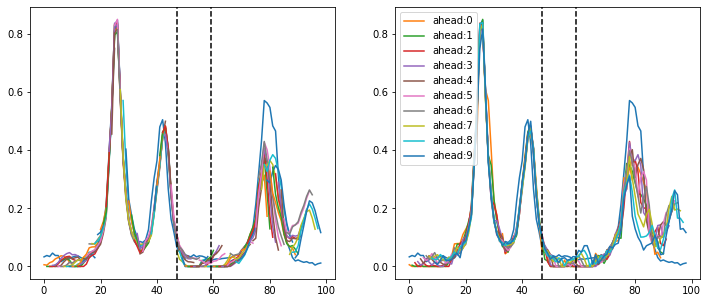

mode: ME-T
64 64
val size: 47 test_size: 59


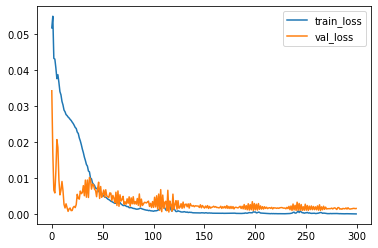

115 ./models/v2/KR_me_T_lb7_best.h5
64 64


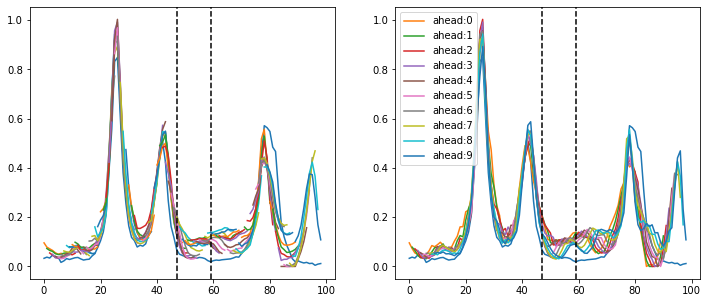

mode: ME-A
64 64
val size: 47 test_size: 59


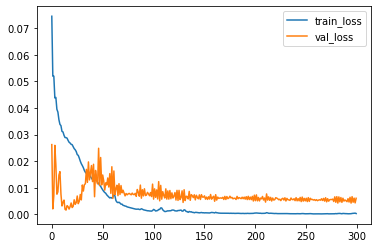

294 ./models/v2/KR_me_A_lb7_best.h5
64 64


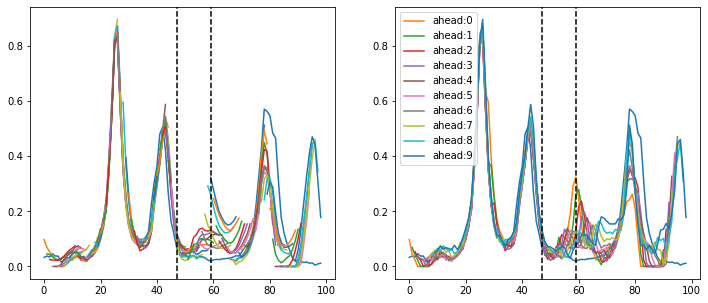

===== threshold: 4 =====
mode: ME-N
64 64
val size: 47 test_size: 59


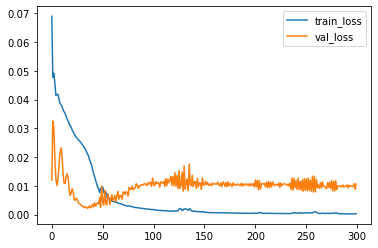

257 ./models/v2/KR_me_N_lb7_best.h5
64 64


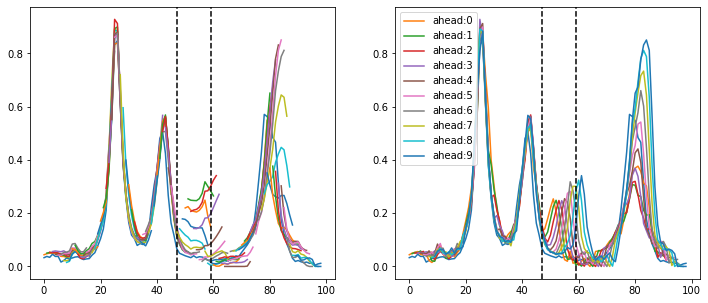

mode: ME-S
64 64
val size: 47 test_size: 59


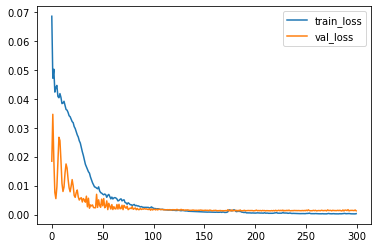

174 ./models/v2/KR_me_S_lb7_best.h5
64 64


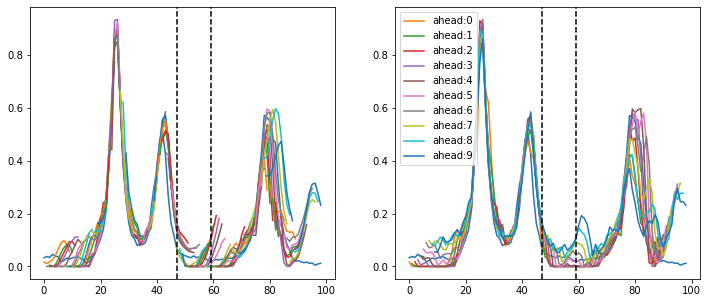

mode: ME-T
64 64
val size: 47 test_size: 59


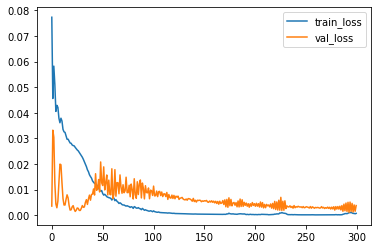

292 ./models/v2/KR_me_T_lb7_best.h5
64 64


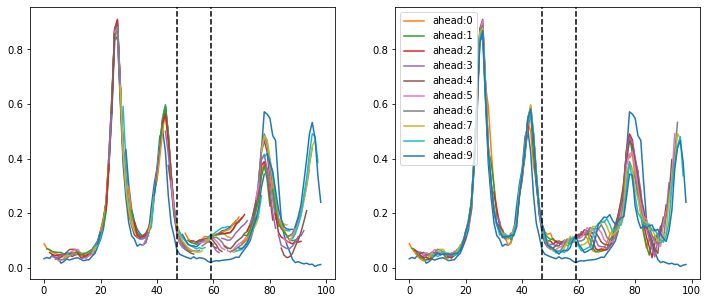

mode: ME-A
64 64
val size: 47 test_size: 59


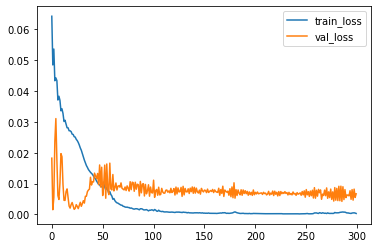

285 ./models/v2/KR_me_A_lb7_best.h5
64 64


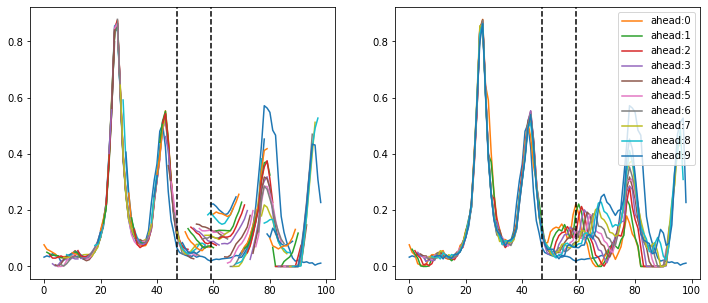

===== threshold: 5 =====
mode: ME-N
64 64
val size: 47 test_size: 59


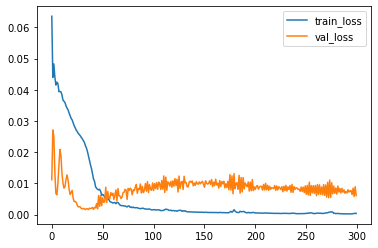

272 ./models/v2/KR_me_N_lb7_best.h5
64 64


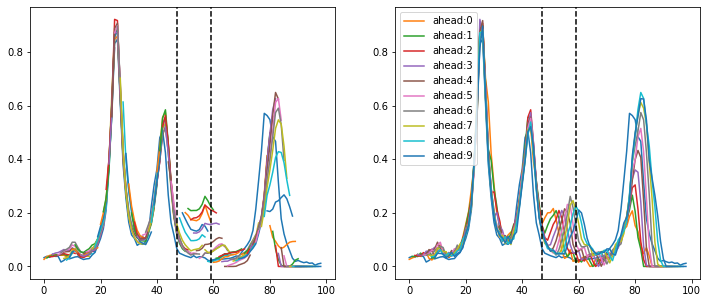

mode: ME-S
64 64
val size: 47 test_size: 59


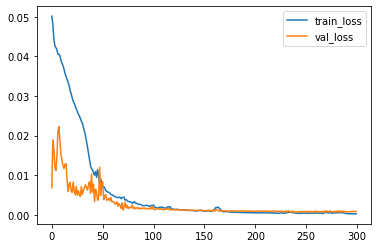

236 ./models/v2/KR_me_S_lb7_best.h5
64 64


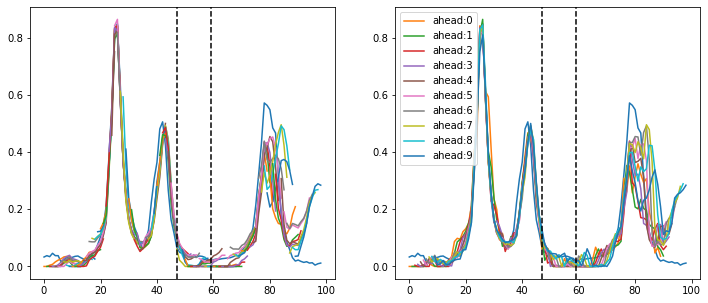

mode: ME-T
64 64
val size: 47 test_size: 59


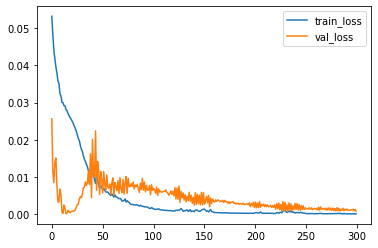

299 ./models/v2/KR_me_T_lb7_best.h5
64 64


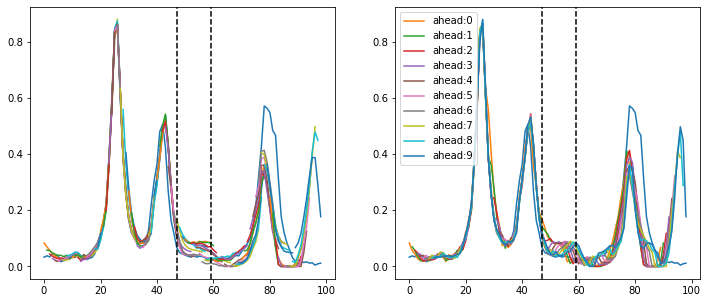

mode: ME-A
64 64
val size: 47 test_size: 59


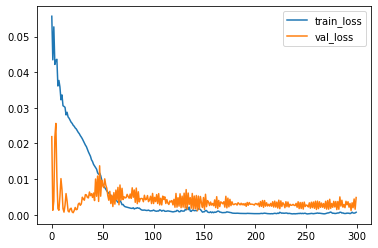

143 ./models/v2/KR_me_A_lb7_best.h5
64 64


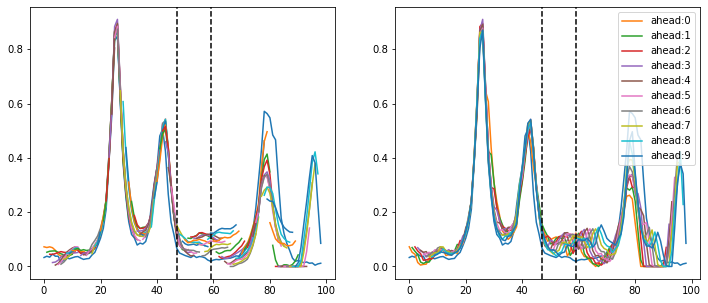

===== threshold: 6 =====
mode: ME-N
64 64
val size: 47 test_size: 59


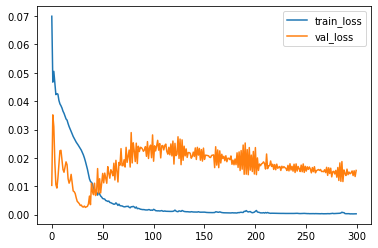

286 ./models/v2/KR_me_N_lb7_best.h5
64 64


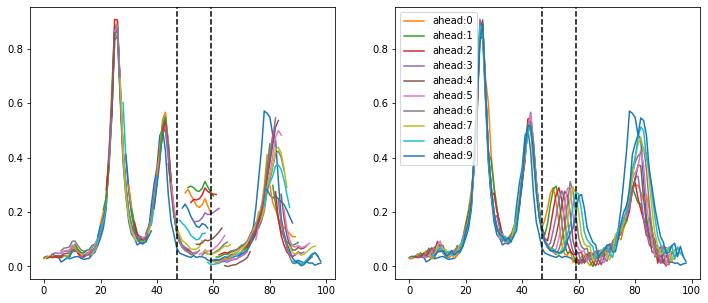

mode: ME-S
64 64
val size: 47 test_size: 59


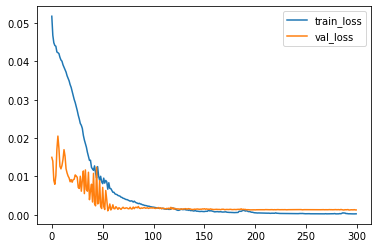

292 ./models/v2/KR_me_S_lb7_best.h5
64 64


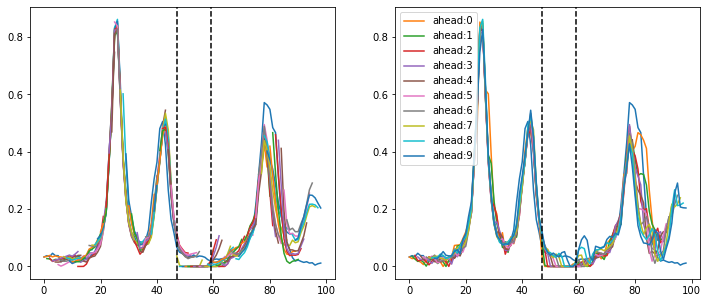

mode: ME-T
64 64
val size: 47 test_size: 59


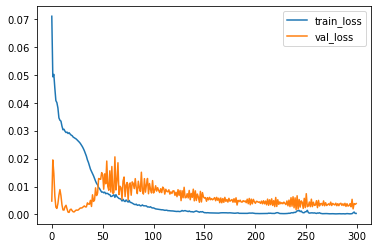

240 ./models/v2/KR_me_T_lb7_best.h5
64 64


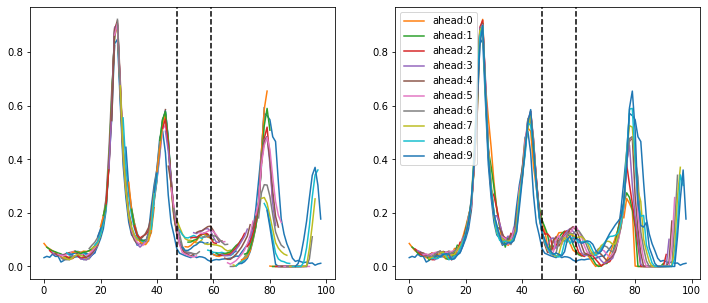

mode: ME-A
64 64
val size: 47 test_size: 59


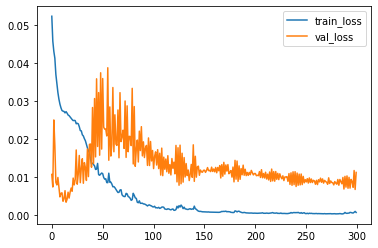

298 ./models/v2/KR_me_A_lb7_best.h5
64 64


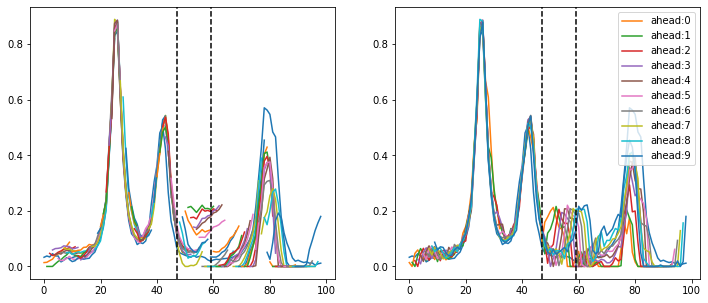

===== threshold: 7 =====
mode: ME-N
64 64
val size: 47 test_size: 59


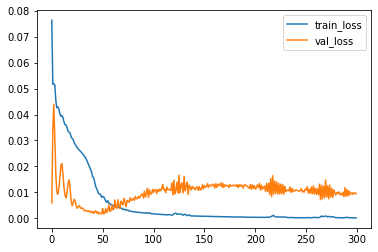

264 ./models/v2/KR_me_N_lb7_best.h5
64 64


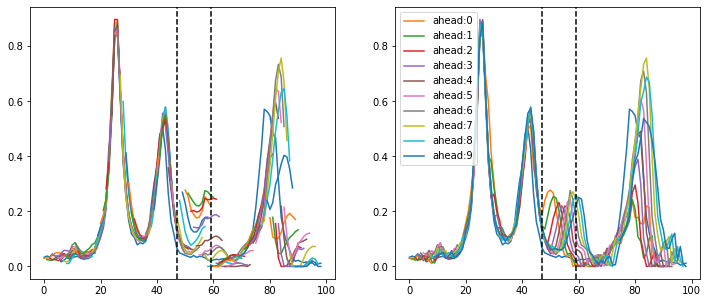

mode: ME-S
64 64
val size: 47 test_size: 59


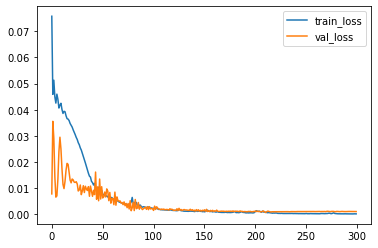

210 ./models/v2/KR_me_S_lb7_best.h5
64 64


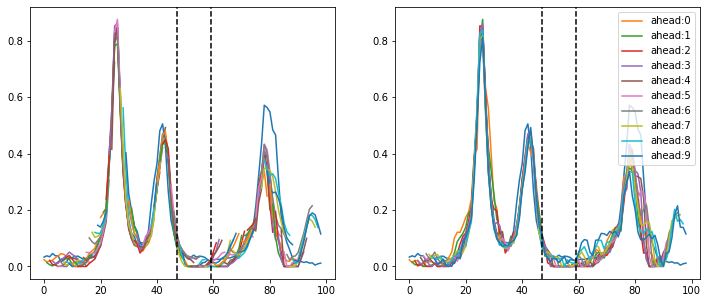

mode: ME-T
64 64
val size: 47 test_size: 59


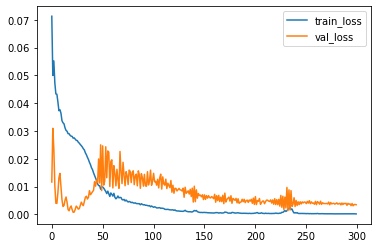

232 ./models/v2/KR_me_T_lb7_best.h5
64 64


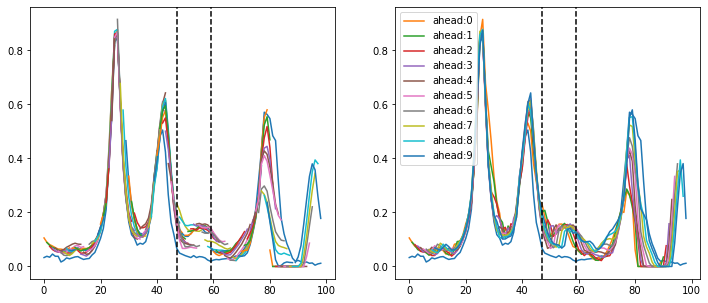

mode: ME-A
64 64
val size: 47 test_size: 59


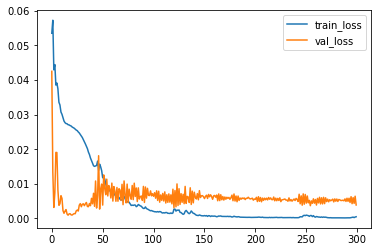

120 ./models/v2/KR_me_A_lb7_best.h5
64 64


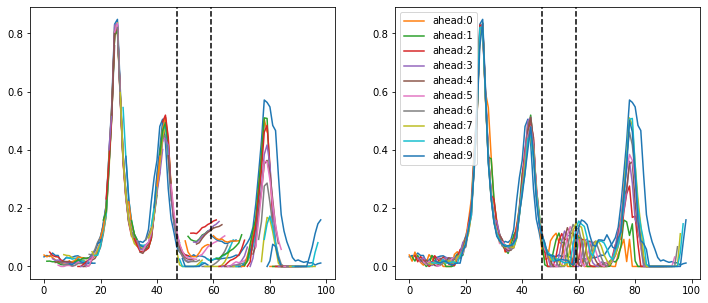

===== threshold: 8 =====
mode: ME-N
64 64
val size: 47 test_size: 59


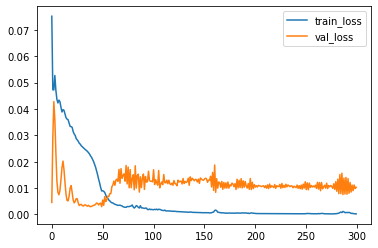

286 ./models/v2/KR_me_N_lb7_best.h5
64 64


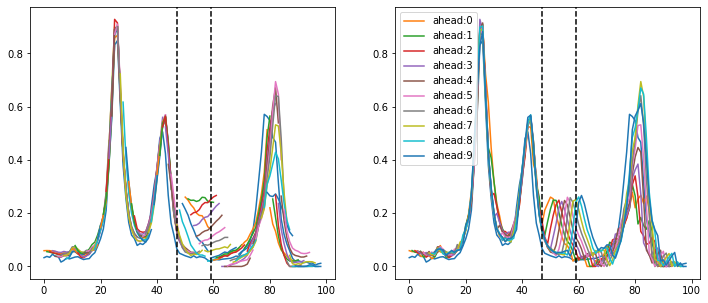

mode: ME-S
64 64
val size: 47 test_size: 59


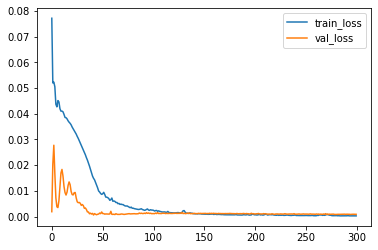

278 ./models/v2/KR_me_S_lb7_best.h5
64 64


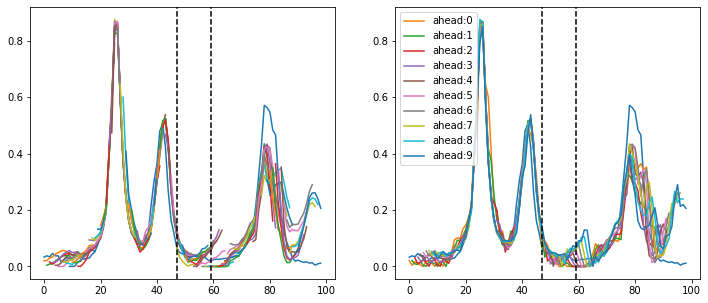

mode: ME-T
64 64
val size: 47 test_size: 59


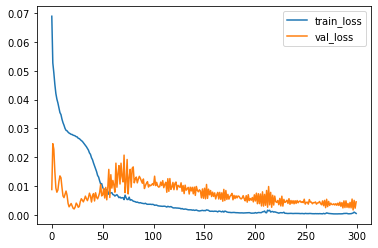

296 ./models/v2/KR_me_T_lb7_best.h5
64 64


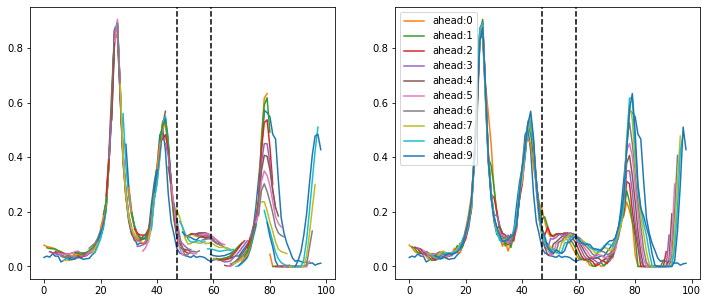

mode: ME-A
64 64
val size: 47 test_size: 59


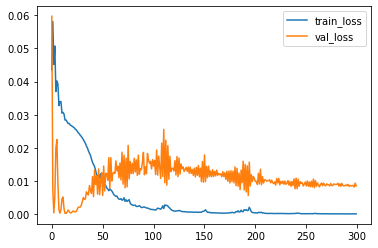

193 ./models/v2/KR_me_A_lb7_best.h5
64 64


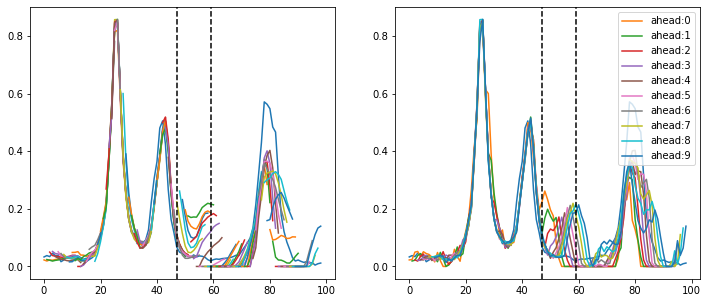

===== threshold: 9 =====
mode: ME-N
64 64
val size: 47 test_size: 59


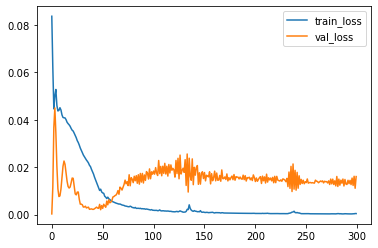

134 ./models/v2/KR_me_N_lb7_best.h5
64 64


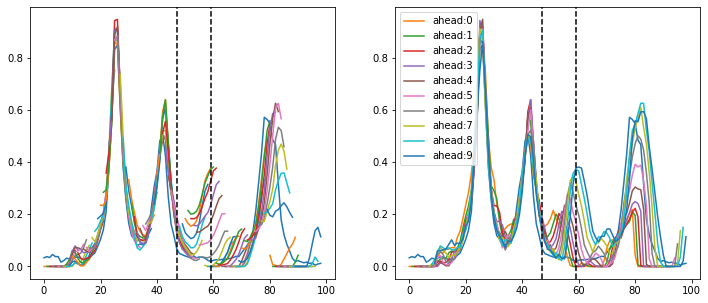

mode: ME-S
64 64
val size: 47 test_size: 59


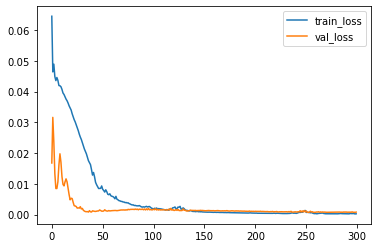

298 ./models/v2/KR_me_S_lb7_best.h5
64 64


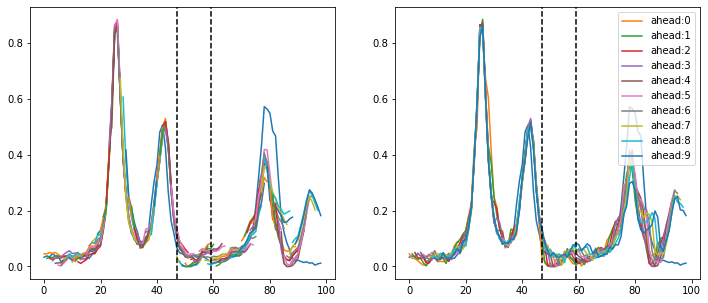

mode: ME-T
64 64
val size: 47 test_size: 59


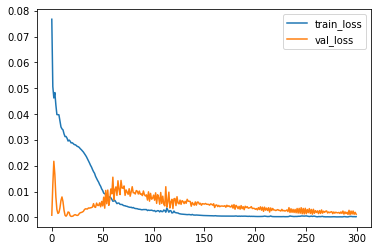

293 ./models/v2/KR_me_T_lb7_best.h5
64 64


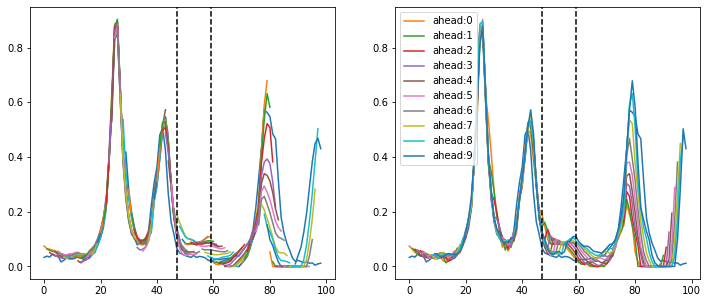

mode: ME-A
64 64
val size: 47 test_size: 59


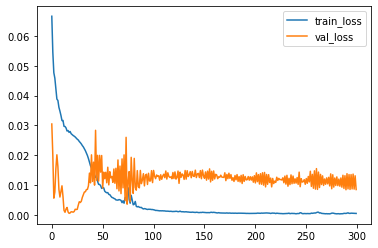

289 ./models/v2/KR_me_A_lb7_best.h5
64 64


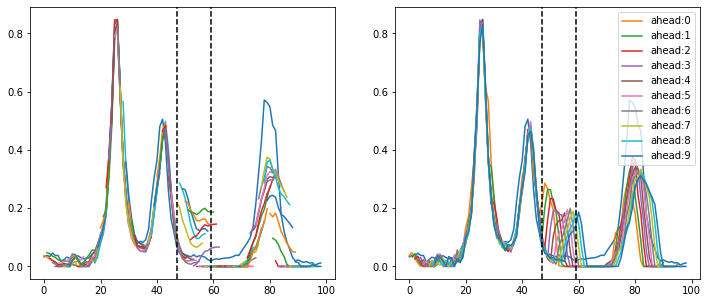

===== threshold: 10 =====
mode: ME-N
64 64
val size: 47 test_size: 59


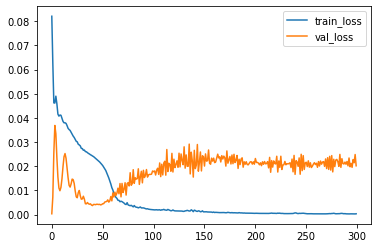

139 ./models/v2/KR_me_N_lb7_best.h5
64 64


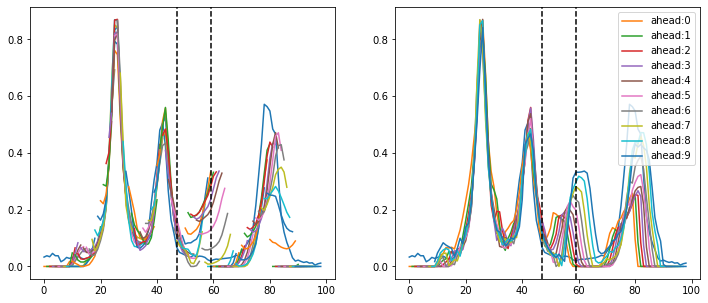

mode: ME-S
64 64
val size: 47 test_size: 59


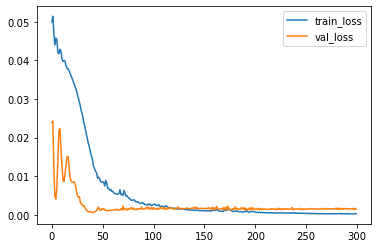

190 ./models/v2/KR_me_S_lb7_best.h5
64 64


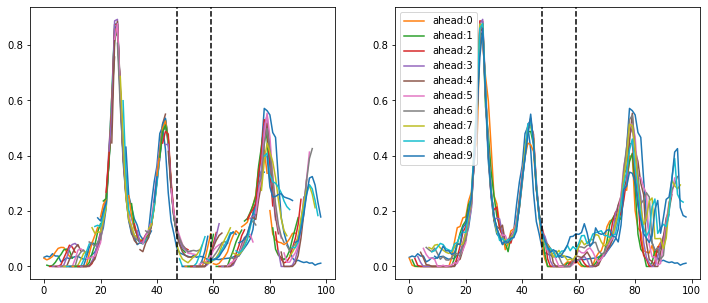

mode: ME-T
64 64
val size: 47 test_size: 59


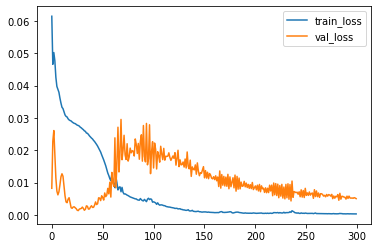

235 ./models/v2/KR_me_T_lb7_best.h5
64 64


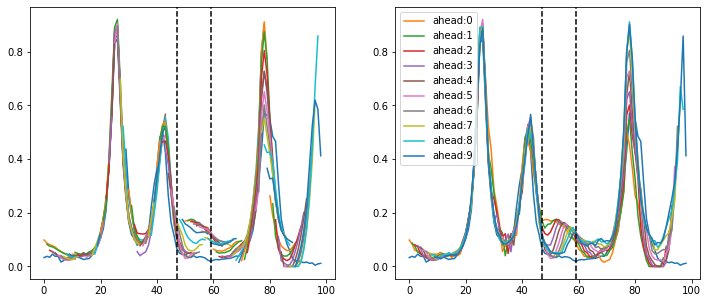

mode: ME-A
64 64
val size: 47 test_size: 59


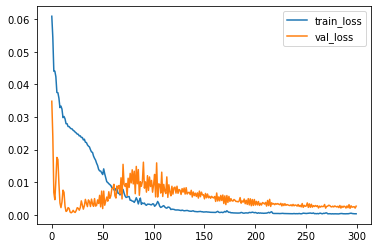

293 ./models/v2/KR_me_A_lb7_best.h5
64 64


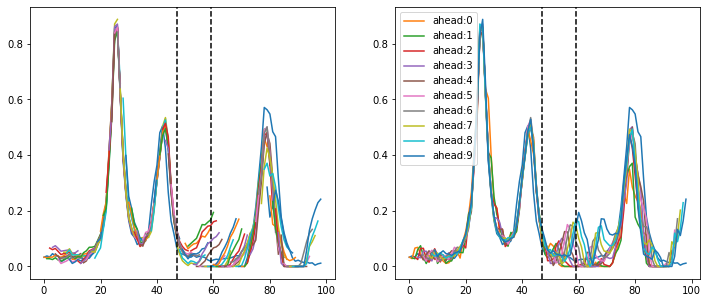

In [626]:
# KR_N,S,T MEDIF , max_lag lag threshold param check

KR_perform_by_lag = {}
KR_perform_by_model = {}
KR_prd_by_model = {}

look_back = 7

mode = 'T'

for threshold in [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]:
    
    KR_news_tmp_max_lag = {}
    lag_max = KR_news_lag.max()
    lag_max = lag_max[lag_max > 0.5]
    for word in lag_max.index:
        lag = KR_news_lag[word].argmax()
        val = KR_news_lag.loc[lag, word]
        if lag >= threshold:
            KR_news_tmp_max_lag[word] = (lag, val)
    KR_news_tmp_max_lag = pd.DataFrame(KR_news_tmp_max_lag, index=['max_lag', 'coef'])
    
    KR_sns_tmp_max_lag = {}
    lag_max = KR_sns_lag.max()
    lag_max = lag_max[lag_max > 0.5]
    for word in lag_max.index:
        lag = KR_sns_lag[word].argmax()
        val = KR_sns_lag.loc[lag, word]
        if lag >= threshold:
            KR_sns_tmp_max_lag[word] = (lag, val)
    KR_sns_tmp_max_lag = pd.DataFrame(KR_sns_tmp_max_lag, index=['max_lag', 'coef'])
    
    KR_trends_tmp_max_lag = {}
    lag_max = KR_trends_lag.max()
    lag_max = lag_max[lag_max > 0.5]
    for word in lag_max.index:
        lag = KR_trends_lag[word].argmax()
        val = KR_trends_lag.loc[lag, word]
        if lag >= threshold:
            KR_trends_tmp_max_lag[word] = (lag, val)
    KR_trends_tmp_max_lag = pd.DataFrame(KR_trends_tmp_max_lag, index=['max_lag', 'coef'])
    
    print('='*5, 'threshold:', threshold, '='*5)
    KR_perform_by_lag[threshold] = {}
    for mode in ['N', 'S', 'T', 'A']:
        mode_name = 'ME-' + mode
        KR_perform_by_model[mode_name] = {}
        print('mode:', mode_name)

        clear_session()

        news_word_num = len(KR_news_tmp_max_lag.columns)
        sns_word_num = len(KR_sns_tmp_max_lag.columns)
        trend_word_num = len(KR_trends_tmp_max_lag.columns)

        me = Multi_Encoder_v2(look_back=look_back, look_ahead=look_ahead,
                              past_year_num=6,
                              news_word_num=news_word_num,
                              sns_word_num=sns_word_num,
                              trend_word_num=trend_word_num,
                              mode=mode)

        available_weeks = KR_trends_norm['weeks'].values[collect_err+max_lag+look_back:-look_ahead+1]
        x, y, val_size, test_size = me.generate_data(KCDC_norm, available_weeks,
                                                     look_back, look_ahead,
                                                     test_split_size=test_split_size,
                                                     val_split_size=val_split_size,
                                                     news_data=KR_news_norm,
                                                     news_lag=KR_news_tmp_max_lag,
                                                     sns_data=KR_sns_norm,
                                                     sns_lag=KR_sns_tmp_max_lag,
                                                     trends_data=KR_trends_norm,
                                                     trends_lag=KR_trends_tmp_max_lag)

        x_train, x_val, x_test, x_total = x
        y_train, y_val, y_test = y

        print('val size:', val_size, 'test_size:', test_size)

        cp = ModelCheckpoint('./models/v2/me_{epoch}.h5')

        history = me.fit(x_train, y_train, x_val, y_val, epochs=epochs, batch_size=batch_size,
                          callbacks=[cp], verbose=0)

        plt.plot(history.history['loss'], label='train_loss')
        plt.plot(history.history['val_loss'], label='val_loss')
        plt.legend()
        plt.show()

        min_epoch = 100
        target_epoch = min_epoch + history.history['val_loss'][min_epoch:].index(
                                        min(history.history['val_loss'][min_epoch:]))
        best_path = './models/v2/KR_me_' + mode + '_lb' + str(look_back) + '_best.h5'
        print(target_epoch, best_path)
        shutil.copy('./models/v2/me_' + str(target_epoch) + '.h5', best_path)


        test_me = Multi_Encoder_v2(look_back=look_back, look_ahead=look_ahead,
                                  past_year_num=past_year_num,
                                  news_word_num=news_word_num,
                                  sns_word_num=sns_word_num,
                                  trend_word_num=trend_word_num,
                                  mode=mode)
        test_me.load_model(best_path)

        start_week = int(available_weeks[0].split('-')[1])
        end_week = int(available_weeks[-1].split('-')[1])
        target_truth = (KCDC_norm.loc[start_week:52, '2018'].tolist() + KCDC_norm.loc[:52, '2019'].tolist()
                        + KCDC_norm.loc[:end_week+look_ahead-1, '2020'].tolist())

        prd_total = []

        for target_idx in range(90-1-look_back+8):
            if mode == 'A':
                enc_outs, news_states, sns_states, trend_states = me.encoder_model.predict([x_total[0][target_idx:target_idx+1],
                                                                                            [x_total[1][target_idx:target_idx+1],
                                                                                             x_total[2][target_idx:target_idx+1],
                                                                                             x_total[3][target_idx:target_idx+1]]])

                dec_input = [x_total[4][target_idx, 0, :].reshape(1, 1, x_total[4].shape[2]),
                             x_total[5][target_idx, 0, :].reshape(1, 1, x_total[5].shape[2]),
                             x_total[6][target_idx, 0, :].reshape(1, 1, x_total[6].shape[2])]
                tmp = []
                for ahead in range(look_ahead):
                    prd, news_states, sns_states, trend_states = me.decoder_model.predict(dec_input + enc_outs 
                                                                      + [news_states, sns_states, trend_states])
                    prd_val = prd[0, 0, 0]
                    if prd_val > 0:
                        tmp.append([prd_val])
                    else:
                        tmp.append([np.random.uniform(1e-6, 1e-5)])

                    if ahead < look_ahead - 1:
                        dec_input = [x_total[4][target_idx, ahead+1, :].reshape(1, 1, x_total[4].shape[2]),
                             x_total[5][target_idx, ahead+1, :].reshape(1, 1, x_total[5].shape[2]),
                             x_total[6][target_idx, ahead+1, :].reshape(1, 1, x_total[6].shape[2])]
                        dec_input[0][0, 0, -1] = prd_val
                        dec_input[1][0, 0, -1] = prd_val
                        dec_input[2][0, 0, -1] = prd_val
            else:
                enc_out, enc_h, enc_c = test_me.encoder_model.predict([x_total[0][target_idx:target_idx+1],
                                                                      x_total[1][target_idx:target_idx+1]])

                dec_input = x_total[2][target_idx, 0, :].reshape(1, 1, x_total[2].shape[2])
                tmp = []
                for ahead in range(look_ahead):
                    prd, dec_h, dec_c = test_me.decoder_model.predict([dec_input] + [enc_out, enc_h, enc_c])
                    prd_val = prd[0, 0, 0]
                    if prd_val > 0:
                        tmp.append([prd_val])
                    else:
                        tmp.append([np.random.uniform(1e-6, 1e-5)])

                    if ahead < look_ahead - 1:
                        dec_input = x_total[2][target_idx, ahead+1, :].reshape(1, 1, x_total[2].shape[2])
                        dec_input[0, 0, -1] = prd_val
                    enc_h, enc_c = dec_h, dec_c
            prd_total.append(tmp)
        prd_total = np.array(prd_total)
        KR_prd_by_model[mode_name] = prd_total

        show_graph(target_truth, prd_total, look_ahead, val_size, test_size)
        prd_train = prd_total[:val_size]
        prd_val = prd_total[val_size:test_size]
        prd_test = prd_total[test_size:]

        rmse_total, mape_total, corr_total = Evaluate.evaluate(target_truth, 
                                                               prd_total, look_ahead)
        rmse_train, mape_train, corr_train = Evaluate.evaluate(target_truth[:val_size+look_ahead], 
                                                               prd_train, look_ahead)
        rmse_val, mape_val, corr_val = Evaluate.evaluate(target_truth[val_size:test_size+look_ahead],
                                                         prd_val, look_ahead)
        rmse_test, mape_test, corr_test = Evaluate.evaluate(target_truth[test_size:],
                                                            prd_test, look_ahead)

        for ahead in range(look_ahead):
            ah = str(ahead+1)
            KR_perform_by_model[mode_name]['total_rmse_' + ah] = rmse_total[ahead]
            KR_perform_by_model[mode_name]['total_mape_' + ah] = mape_total[ahead]
            KR_perform_by_model[mode_name]['total_corr_' + ah] = corr_total[ahead]

            KR_perform_by_model[mode_name]['train_rmse_' + ah] = rmse_train[ahead]
            KR_perform_by_model[mode_name]['train_mape_' + ah] = mape_train[ahead]
            KR_perform_by_model[mode_name]['train_corr_' + ah] = corr_train[ahead]

            KR_perform_by_model[mode_name]['val_rmse_' + ah] = rmse_val[ahead]
            KR_perform_by_model[mode_name]['val_mape_' + ah] = mape_val[ahead]
            KR_perform_by_model[mode_name]['val_corr_' + ah] = corr_val[ahead]

            KR_perform_by_model[mode_name]['test_rmse_' + ah] = rmse_test[ahead]
            KR_perform_by_model[mode_name]['test_mape_' + ah] = mape_test[ahead]
            KR_perform_by_model[mode_name]['test_corr_' + ah] = corr_test[ahead]
#     print(KR_perform_by_model)
    KR_perform_by_lag[threshold]['perform'] = KR_perform_by_model.copy()
    KR_perform_by_lag[threshold]['predict'] = KR_prd_by_model.copy()

In [628]:
with open('./data/v2/KR_perform_by_lag.pkl', 'wb') as f:
    pickle.dump(KR_perform_by_lag, f)

In [860]:
KR_perform_by_model = {}

look_back = 7

for threshold in [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]:
    for mode in ['N', 'S', 'T']:
        mode_name = 'ME-' + mode
        KR_perform_by_model[mode_name] = {}
        
        available_weeks = KR_trends_norm['weeks'].values[collect_err+max_lag+look_back:-look_ahead+1]
        start_week = int(available_weeks[0].split('-')[1])
        end_week = int(available_weeks[-1].split('-')[1])
        
        target_truth = (KCDC_norm.loc[start_week:52, '2018'].tolist() + KCDC_norm.loc[:52, '2019'].tolist()
                        + KCDC_norm.loc[:end_week+look_ahead-1, '2020'].tolist())

        rmse_total, mape_total, corr_total = Evaluate.evaluate(KCDC_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1)), 
                                                               np.array([KCDC_scaler.inverse_transform(_) for _ in KR_perform_by_lag[threshold]['predict'][mode_name]]),
                                                               look_ahead)
        rmse_train, mape_train, corr_train = Evaluate.evaluate(KCDC_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1))[:val_size+look_ahead], 
                                                               np.array([KCDC_scaler.inverse_transform(_) for _ in KR_perform_by_lag[threshold]['predict'][mode_name]])[:val_size],
                                                               look_ahead)
        rmse_val, mape_val, corr_val = Evaluate.evaluate(KCDC_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1))[val_size:test_size+look_ahead],
                                                         np.array([KCDC_scaler.inverse_transform(_) for _ in KR_perform_by_lag[threshold]['predict'][mode_name]])[val_size:test_size],
                                                         look_ahead)
        rmse_test, mape_test, corr_test = Evaluate.evaluate(KCDC_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1))[test_size:],
                                                            np.array([KCDC_scaler.inverse_transform(_) for _ in KR_perform_by_lag[threshold]['predict'][mode_name]])[test_size:],
                                                            look_ahead)

        for ahead in range(look_ahead):
            ah = str(ahead+1)
            KR_perform_by_model[mode_name]['total_rmse_' + ah] = rmse_total[ahead]
            KR_perform_by_model[mode_name]['total_mape_' + ah] = mape_total[ahead]
            KR_perform_by_model[mode_name]['total_corr_' + ah] = corr_total[ahead]

            KR_perform_by_model[mode_name]['train_rmse_' + ah] = rmse_train[ahead]
            KR_perform_by_model[mode_name]['train_mape_' + ah] = mape_train[ahead]
            KR_perform_by_model[mode_name]['train_corr_' + ah] = corr_train[ahead]

            KR_perform_by_model[mode_name]['val_rmse_' + ah] = rmse_val[ahead]
            KR_perform_by_model[mode_name]['val_mape_' + ah] = mape_val[ahead]
            KR_perform_by_model[mode_name]['val_corr_' + ah] = corr_val[ahead]

            KR_perform_by_model[mode_name]['test_rmse_' + ah] = rmse_test[ahead]
            KR_perform_by_model[mode_name]['test_mape_' + ah] = mape_test[ahead]
            KR_perform_by_model[mode_name]['test_corr_' + ah] = corr_test[ahead]
    KR_perform_by_lag[threshold]['perform'] = KR_perform_by_model.copy()

In [876]:
lag_compare = {'N': {}, 'S': {}, 'T': {}, 'mean': {}}

for ev in ['rmse', 'mape', 'corr']:
    lag_compare['N'][ev] = []
    lag_compare['S'][ev] = []
    lag_compare['T'][ev] = []
    lag_compare['mean'][ev] = []
    for lag_threshold in np.arange(0, 11):
        tmp2 = pd.DataFrame(KR_perform_by_lag[lag_threshold]['perform']).T.loc[['ME-N', 'ME-S', 'ME-T']]
        n, s, t = tmp2[[c for c in tmp2.columns if 'total' in c and ev in c]].mean(axis=1).values
        
        lag_compare['N'][ev].append(n)
        lag_compare['S'][ev].append(s)
        lag_compare['T'][ev].append(t)
        lag_compare['mean'][ev].append(tmp2[[c for c in tmp2.columns if 'total' in c and ev in c]].mean(axis=1).mean())
        
for mode in ['N', 'S', 'T', 'mean']:
    lag_compare[mode] = pd.DataFrame(lag_compare[mode], index=np.arange(0, 11))
    lag_compare[mode]['rmse(improve)'] = lag_compare[mode]['rmse'].apply(lambda x: (lag_compare[mode]['rmse'].max() - x) / lag_compare[mode]['rmse'].max())
    lag_compare[mode]['mape(improve)'] = lag_compare[mode]['mape'].apply(lambda x: (lag_compare[mode]['mape'].max() - x) / lag_compare[mode]['mape'].max())
    lag_compare[mode]['corr(improve)'] = lag_compare[mode]['corr'].apply(lambda x: (x - lag_compare[mode]['corr'].min()) / lag_compare[mode]['corr'].min())
    lag_compare[mode]['improve(mean)'] = lag_compare[mode][['rmse(improve)', 'mape(improve)', 'corr(improve)']].mean(axis=1)
    lag_compare[mode].to_csv('./data/v2/KR_perform_by_lag_' + mode + '.csv', encoding='utf8')

In [882]:
lag_compare['mean'].round(3)

,rmse,mape,corr,rmse(improve),mape(improve),corr(improve),improve(mean)
0,8.518,66.318,0.866,0.000,0.164,0.000,0.055
1,8.375,59.403,0.866,0.017,0.252,0.000,0.089
2,8.082,44.405,0.877,0.051,0.441,0.012,0.168
3,7.682,55.511,0.895,0.098,0.301,0.033,0.144
4,7.850,45.297,0.895,0.078,0.429,0.033,0.180
5,7.879,62.446,0.880,0.075,0.213,0.016,0.101
6,7.511,61.030,0.891,0.118,0.231,0.029,0.126
7,8.284,70.838,0.873,0.027,0.107,0.008,0.048
8,7.676,60.775,0.888,0.099,0.234,0.026,0.120
9,8.401,79.367,0.868,0.014,0.000,0.002,0.005


mode: ME-N
128 128
val size: 46 test_size: 58


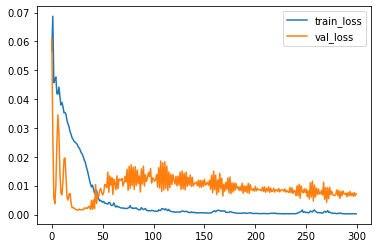

270 ./models/v2/KR_me_N_lb8_best.h5
128 128


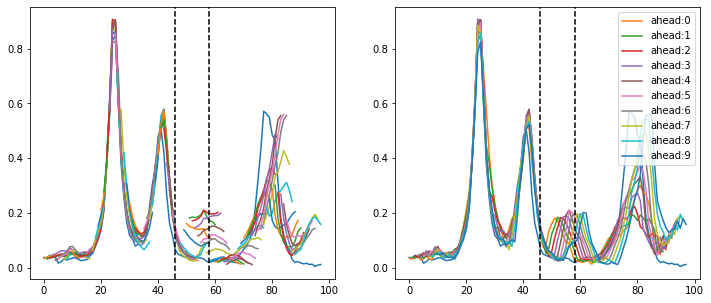

mode: ME-S
128 128
val size: 46 test_size: 58


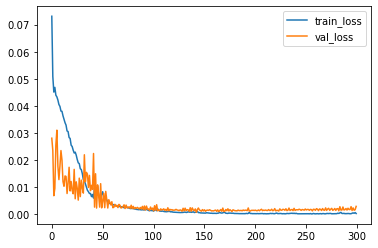

142 ./models/v2/KR_me_S_lb8_best.h5
128 128


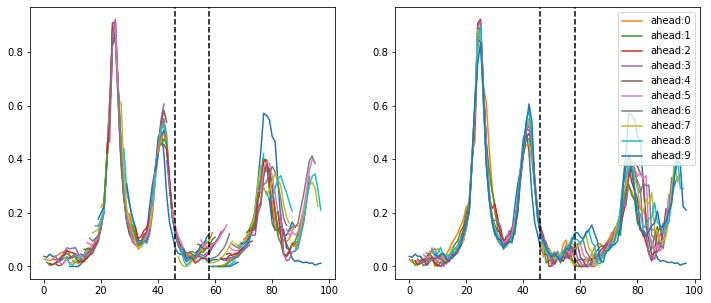

mode: ME-T
128 128
val size: 46 test_size: 58


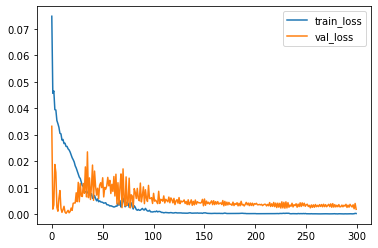

299 ./models/v2/KR_me_T_lb8_best.h5
128 128


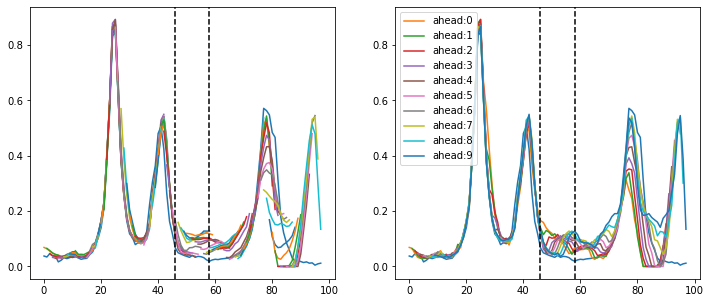

In [944]:
# KR_N,S,T MEDIF 적용

KR_perform_by_model = {}
KR_prd_by_model = {}

mode = 'T'

for mode in ['N', 'S', 'T']:
    mode_name = 'ME-' + mode
    KR_perform_by_model[mode_name] = {}
    print('mode:', mode_name)
    
    clear_session()
    
    news_word_num = len(KR_news_max_lag.columns)
    sns_word_num = len(KR_sns_max_lag.columns)
    trend_word_num = len(KR_trends_max_lag.columns)

    me = Multi_Encoder_v2(look_back=look_back, look_ahead=look_ahead,
                          past_year_num=6,
                          news_word_num=news_word_num,
                          sns_word_num=sns_word_num,
                          trend_word_num=trend_word_num,
                          mode=mode)

    available_weeks = KR_trends_norm['weeks'].values[collect_err+max_lag+look_back:-look_ahead+1]
    x, y, val_size, test_size = me.generate_data(KCDC_norm, available_weeks,
                                                 look_back, look_ahead,
                                                 test_split_size=test_split_size,
                                                 val_split_size=val_split_size,
                                                 news_data=KR_news_norm,
                                                 news_lag=KR_news_max_lag,
                                                 sns_data=KR_sns_norm,
                                                 sns_lag=KR_sns_max_lag,
                                                 trends_data=KR_trends_norm,
                                                 trends_lag=KR_trends_max_lag)

    x_train, x_val, x_test, x_total = x
    y_train, y_val, y_test = y

    print('val size:', val_size, 'test_size:', test_size)

    cp = ModelCheckpoint('./models/v2/me_{epoch}.h5')

    history = me.fit(x_train, y_train, x_val, y_val, epochs=epochs, batch_size=batch_size,
                      callbacks=[cp], verbose=0)

    plt.plot(history.history['loss'], label='train_loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.legend()
    plt.show()

    min_epoch = 100
    target_epoch = min_epoch + history.history['val_loss'][min_epoch:].index(
                                    min(history.history['val_loss'][min_epoch:]))
    best_path = './models/v2/KR_me_' + mode + '_lb' + str(look_back) + '_best.h5'
    print(target_epoch, best_path)
    shutil.copy('./models/v2/me_' + str(target_epoch) + '.h5', best_path)


    test_me = Multi_Encoder_v2(look_back=look_back, look_ahead=look_ahead,
                              past_year_num=past_year_num,
                              news_word_num=news_word_num,
                              sns_word_num=sns_word_num,
                              trend_word_num=trend_word_num,
                              mode=mode)
    test_me.load_model(best_path)

    start_week = int(available_weeks[0].split('-')[1])
    end_week = int(available_weeks[-1].split('-')[1])
    target_truth = (KCDC_norm.loc[start_week:52, '2018'].tolist() + KCDC_norm.loc[:52, '2019'].tolist()
                    + KCDC_norm.loc[:end_week+look_ahead-1, '2020'].tolist())

    prd_total = []

    for target_idx in range(90-1):
        if mode == 'A':
            enc_outs, news_states, sns_states, trend_states = me.encoder_model.predict([x_total[0][target_idx:target_idx+1],
                                                                                        [x_total[1][target_idx:target_idx+1],
                                                                                         x_total[2][target_idx:target_idx+1],
                                                                                         x_total[3][target_idx:target_idx+1]]])

            dec_input = [x_total[4][target_idx, 0, :].reshape(1, 1, x_total[4].shape[2]),
                         x_total[5][target_idx, 0, :].reshape(1, 1, x_total[5].shape[2]),
                         x_total[6][target_idx, 0, :].reshape(1, 1, x_total[6].shape[2])]
            tmp = []
            for ahead in range(look_ahead):
                prd, news_states, sns_states, trend_states = me.decoder_model.predict(dec_input + enc_outs 
                                                                  + [news_states, sns_states, trend_states])
                prd_val = prd[0, 0, 0]
                if prd_val > 0:
                    tmp.append([prd_val])
                else:
                    tmp.append([np.random.uniform(1e-6, 1e-5)])

                if ahead < look_ahead - 1:
                    dec_input = [x_total[4][target_idx, ahead+1, :].reshape(1, 1, x_total[4].shape[2]),
                         x_total[5][target_idx, ahead+1, :].reshape(1, 1, x_total[5].shape[2]),
                         x_total[6][target_idx, ahead+1, :].reshape(1, 1, x_total[6].shape[2])]
                    dec_input[0][0, 0, -1] = prd_val
                    dec_input[1][0, 0, -1] = prd_val
                    dec_input[2][0, 0, -1] = prd_val
        else:
            enc_out, enc_h, enc_c = test_me.encoder_model.predict([x_total[0][target_idx:target_idx+1],
                                                                  x_total[1][target_idx:target_idx+1]])

            dec_input = x_total[2][target_idx, 0, :].reshape(1, 1, x_total[2].shape[2])
            tmp = []
            for ahead in range(look_ahead):
                prd, dec_h, dec_c = test_me.decoder_model.predict([dec_input] + [enc_out, enc_h, enc_c])
                prd_val = prd[0, 0, 0]
                if prd_val > 0:
                    tmp.append([prd_val])
                else:
                    tmp.append([np.random.uniform(1e-6, 1e-5)])

                if ahead < look_ahead - 1:
                    dec_input = x_total[2][target_idx, ahead+1, :].reshape(1, 1, x_total[2].shape[2])
                    dec_input[0, 0, -1] = prd_val
                enc_h, enc_c = dec_h, dec_c
        prd_total.append(tmp)
    prd_total = np.array(prd_total)
    KR_prd_by_model[mode_name] = prd_total

    show_graph(target_truth, prd_total, look_ahead, val_size, test_size)
    prd_train = prd_total[:val_size]
    prd_val = prd_total[val_size:test_size]
    prd_test = prd_total[test_size:]

    inverse_target_truth = KCDC_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1))
    inverse_prd_total = np.array([KCDC_scaler.inverse_transform(_) for _ in prd_total])

    rmse_total, mape_total, corr_total = Evaluate.evaluate(inverse_target_truth, 
                                                           inverse_prd_total, look_ahead)
    rmse_train, mape_train, corr_train = Evaluate.evaluate(inverse_target_truth[:val_size+look_ahead], 
                                                           inverse_prd_total[:val_size], look_ahead)
    rmse_val, mape_val, corr_val = Evaluate.evaluate(inverse_target_truth[val_size:test_size+look_ahead],
                                                     inverse_prd_total[val_size:test_size], look_ahead)
    rmse_test, mape_test, corr_test = Evaluate.evaluate(inverse_target_truth[test_size:],
                                                        inverse_prd_total[test_size:], look_ahead)

    for ahead in range(look_ahead):
        ah = str(ahead+1)
        KR_perform_by_model[mode_name]['total_rmse_' + ah] = rmse_total[ahead]
        KR_perform_by_model[mode_name]['total_mape_' + ah] = mape_total[ahead]
        KR_perform_by_model[mode_name]['total_corr_' + ah] = corr_total[ahead]

        KR_perform_by_model[mode_name]['train_rmse_' + ah] = rmse_train[ahead]
        KR_perform_by_model[mode_name]['train_mape_' + ah] = mape_train[ahead]
        KR_perform_by_model[mode_name]['train_corr_' + ah] = corr_train[ahead]

        KR_perform_by_model[mode_name]['val_rmse_' + ah] = rmse_val[ahead]
        KR_perform_by_model[mode_name]['val_mape_' + ah] = mape_val[ahead]
        KR_perform_by_model[mode_name]['val_corr_' + ah] = corr_val[ahead]

        KR_perform_by_model[mode_name]['test_rmse_' + ah] = rmse_test[ahead]
        KR_perform_by_model[mode_name]['test_mape_' + ah] = mape_test[ahead]
        KR_perform_by_model[mode_name]['test_corr_' + ah] = corr_test[ahead]

Basic-LSTM


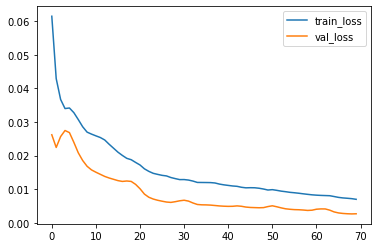

68 ./models/v2/KR_basic_lstm_best.h5


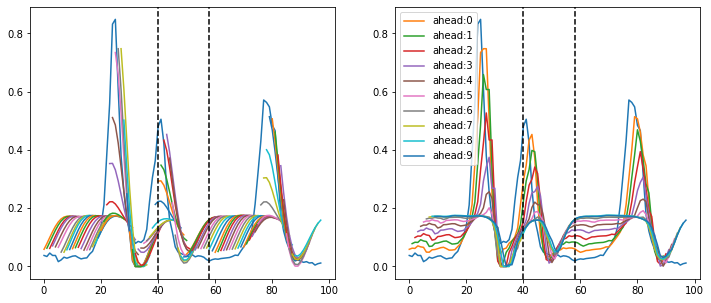

In [999]:
## Basic_LSTM

epochs = 70

# KR_perform_by_model = {}
mode_name = 'Basic-LSTM'
KR_perform_by_model[mode_name] = {}
print(mode_name)
clear_session()

basic_lstm = Basic_LSTM(look_back=look_back, look_ahead=look_ahead)
available_weeks = KR_trends_norm['weeks'].values[collect_err+max_lag+look_back:-look_ahead+1]

x, y, val_size, test_size = basic_lstm.generate_data(KCDC_norm, available_weeks,
                                                  look_back, 1, 
                                                  test_split_size=test_split_size,
                                                  val_split_size=val_split_size)
x_train, x_val, x_test, x_total = x
y_train, y_val, y_test = y

cp = ModelCheckpoint('./models/v2/basic_lstm_{epoch}.h5')

history = basic_lstm.fit(x_train, y_train, x_val, y_val, epochs=epochs, batch_size=batch_size,
                  callbacks=[cp], verbose=0)

plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.legend()
plt.show()

min_epoch = 30
target_epoch = min_epoch + history.history['val_loss'][min_epoch:].index(
                                min(history.history['val_loss'][min_epoch:]))
best_path = './models/v2/KR_basic_lstm_best.h5'
print(target_epoch, best_path)
shutil.copy('./models/v2/basic_lstm_' + str(target_epoch) + '.h5', best_path)

test_basic_lstm = Basic_LSTM(look_back=look_back, look_ahead=look_ahead)
test_basic_lstm.load_model(best_path)

start_week = int(available_weeks[0].split('-')[1])
end_week = int(available_weeks[-1].split('-')[1])
target_truth = (KCDC_norm.loc[start_week:52, '2018'].tolist() + KCDC_norm.loc[:52, '2019'].tolist()
                + KCDC_norm.loc[:end_week+look_ahead-1, '2020'].tolist())


prd_total = []
for target_idx in range(90-1):    
    tmp = []
    for i in range(look_ahead):
        if i == 0:
            left_shift = np.array([x_total[0][target_idx]])
        else:
            left_shift = np.roll(left_shift, -1)
            left_shift[:, -1, :] = tmp[-1]
        prd = test_basic_lstm.model.predict(left_shift)[0, 0]
        prd = np.random.uniform(1e-6, 1e-5) if prd < 0 else prd
        prd = 1.0 - np.random.uniform(1e-6, 1e-5) if prd > 1 else prd
        tmp.append(prd)
#     print(left_shift)
#     print(tmp)
    prd_total.append(tmp)
show_graph(target_truth, prd_total, look_ahead, val_size, test_size)
prd_total = np.array(prd_total)
prd_total = prd_total.reshape((prd_total.shape[0], prd_total.shape[1], 1))
KR_prd_by_model[mode_name] = prd_total

prd_train = prd_total[:val_size]
prd_val = prd_total[val_size:test_size]
prd_test = prd_total[test_size:]

inverse_target_truth = KCDC_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1))
inverse_prd_total = np.array([KCDC_scaler.inverse_transform(_) for _ in prd_total])

rmse_total, mape_total, corr_total = Evaluate.evaluate(inverse_target_truth, 
                                                       inverse_prd_total, look_ahead)
rmse_train, mape_train, corr_train = Evaluate.evaluate(inverse_target_truth[:val_size+look_ahead], 
                                                       inverse_prd_total[:val_size], look_ahead)
rmse_val, mape_val, corr_val = Evaluate.evaluate(inverse_target_truth[val_size:test_size+look_ahead],
                                                 inverse_prd_total[val_size:test_size], look_ahead)
rmse_test, mape_test, corr_test = Evaluate.evaluate(inverse_target_truth[test_size:],
                                                    inverse_prd_total[test_size:], look_ahead)

for ahead in range(look_ahead):
    ah = str(ahead+1)
    KR_perform_by_model[mode_name]['total_rmse_' + ah] = rmse_total[ahead]
    KR_perform_by_model[mode_name]['total_mape_' + ah] = mape_total[ahead]
    KR_perform_by_model[mode_name]['total_corr_' + ah] = corr_total[ahead]

    KR_perform_by_model[mode_name]['train_rmse_' + ah] = rmse_train[ahead]
    KR_perform_by_model[mode_name]['train_mape_' + ah] = mape_train[ahead]
    KR_perform_by_model[mode_name]['train_corr_' + ah] = corr_train[ahead]

    KR_perform_by_model[mode_name]['val_rmse_' + ah] = rmse_val[ahead]
    KR_perform_by_model[mode_name]['val_mape_' + ah] = mape_val[ahead]
    KR_perform_by_model[mode_name]['val_corr_' + ah] = corr_val[ahead]

    KR_perform_by_model[mode_name]['test_rmse_' + ah] = rmse_test[ahead]
    KR_perform_by_model[mode_name]['test_mape_' + ah] = mape_test[ahead]
    KR_perform_by_model[mode_name]['test_corr_' + ah] = corr_test[ahead]

DEFSI


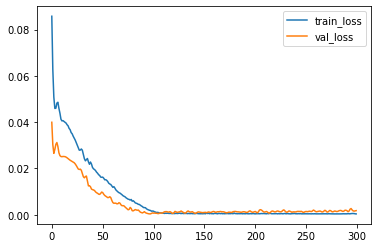

105 ./models/v2/KR_defsi_best.h5


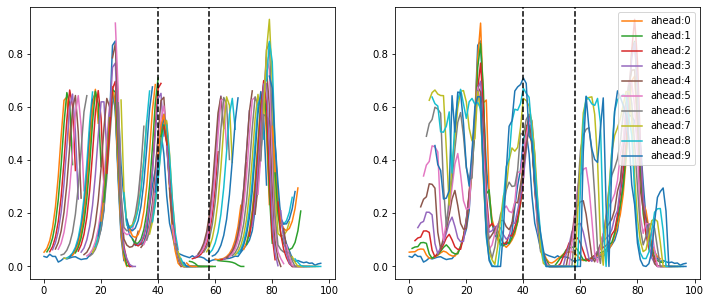

In [961]:
## DEFSI

test_split_size = 0.65
val_split_size = 0.7
epochs = 300

# KR_perform_by_model = {}
mode_name = 'DEFSI'
KR_perform_by_model[mode_name] = {}
print(mode_name)
clear_session()

defsi = DEFSI(look_back=look_back, look_ahead=1)
available_weeks = KR_trends_norm['weeks'].values[collect_err+max_lag+look_back:-look_ahead+1]

x, y, val_size, test_size = defsi.generate_data(KCDC_norm, available_weeks,
                                              look_back, 1, 
                                              test_split_size=test_split_size,
                                              val_split_size=val_split_size)
x_train, x_val, x_test, x_total = x
y_train, y_val, y_test = y

cp = ModelCheckpoint('./models/v2/defsi_{epoch}.h5')

history = defsi.fit(x_train, y_train, x_val, y_val, epochs=epochs, batch_size=batch_size,
                  callbacks=[cp], verbose=0)

plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.legend()
plt.show()

min_epoch = 100
target_epoch = min_epoch + history.history['val_loss'][min_epoch:].index(
                                min(history.history['val_loss'][min_epoch:]))
best_path = './models/v2/KR_defsi_best.h5'
print(target_epoch, best_path)
shutil.copy('./models/v2/defsi_' + str(target_epoch) + '.h5', best_path)

test_defsi = DEFSI(look_back=look_back, look_ahead=1)
test_defsi.load_model(best_path)

start_week = int(available_weeks[0].split('-')[1])
end_week = int(available_weeks[-1].split('-')[1])
target_truth = (KCDC_norm.loc[start_week:52, '2018'].tolist() + KCDC_norm.loc[:52, '2019'].tolist()
                + KCDC_norm.loc[:end_week+look_ahead-1, '2020'].tolist())

prd_total = []
for target_idx in range(90-1):    
    tmp = []
    for i in range(look_ahead):
        if i == 0:
            left_shift = np.array([x_total[0][target_idx]])
        else:
            left_shift = np.roll(left_shift, -1)
            left_shift[:, -1, :] = tmp[-1]
        prd = test_defsi.model.predict([left_shift, np.array([x_total[1][target_idx+1]])])[0, 0]
        prd = np.random.uniform(1e-6, 1e-5) if prd < 0 else prd
        tmp.append(prd)
#     print(left_shift)
#     print(tmp)
    prd_total.append(tmp)
show_graph(target_truth, prd_total, look_ahead, val_size, test_size)
prd_total = np.array(prd_total)
prd_total = prd_total.reshape((prd_total.shape[0], prd_total.shape[1], 1))
KR_prd_by_model[mode_name] = prd_total

prd_train = prd_total[:val_size]
prd_val = prd_total[val_size:test_size]
prd_test = prd_total[test_size:]

inverse_target_truth = KCDC_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1))
inverse_prd_total = np.array([KCDC_scaler.inverse_transform(_) for _ in prd_total])

rmse_total, mape_total, corr_total = Evaluate.evaluate(inverse_target_truth, 
                                                       inverse_prd_total, look_ahead)
rmse_train, mape_train, corr_train = Evaluate.evaluate(inverse_target_truth[:val_size+look_ahead], 
                                                       inverse_prd_total[:val_size], look_ahead)
rmse_val, mape_val, corr_val = Evaluate.evaluate(inverse_target_truth[val_size:test_size+look_ahead],
                                                 inverse_prd_total[val_size:test_size], look_ahead)
rmse_test, mape_test, corr_test = Evaluate.evaluate(inverse_target_truth[test_size:],
                                                    inverse_prd_total[test_size:], look_ahead)

for ahead in range(look_ahead):
    ah = str(ahead+1)
    KR_perform_by_model[mode_name]['total_rmse_' + ah] = rmse_total[ahead]
    KR_perform_by_model[mode_name]['total_mape_' + ah] = mape_total[ahead]
    KR_perform_by_model[mode_name]['total_corr_' + ah] = corr_total[ahead]

    KR_perform_by_model[mode_name]['train_rmse_' + ah] = rmse_train[ahead]
    KR_perform_by_model[mode_name]['train_mape_' + ah] = mape_train[ahead]
    KR_perform_by_model[mode_name]['train_corr_' + ah] = corr_train[ahead]

    KR_perform_by_model[mode_name]['val_rmse_' + ah] = rmse_val[ahead]
    KR_perform_by_model[mode_name]['val_mape_' + ah] = mape_val[ahead]
    KR_perform_by_model[mode_name]['val_corr_' + ah] = corr_val[ahead]

    KR_perform_by_model[mode_name]['test_rmse_' + ah] = rmse_test[ahead]
    KR_perform_by_model[mode_name]['test_mape_' + ah] = mape_test[ahead]
    KR_perform_by_model[mode_name]['test_corr_' + ah] = corr_test[ahead]

Seq2Seq


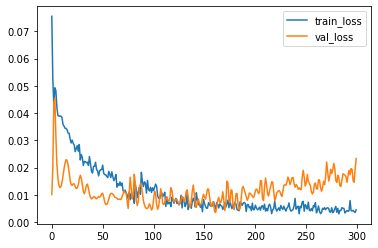

208 ./models/v2/KR_seq2seq_best.h5


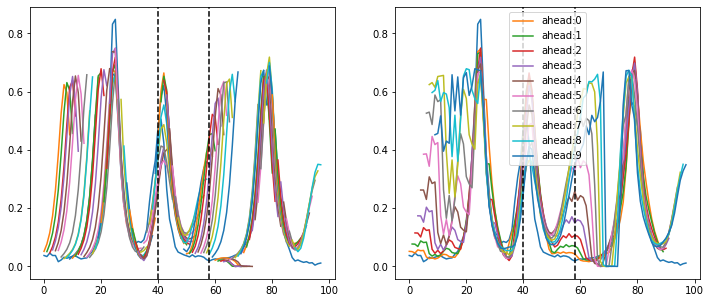

In [994]:
## Seq2Seq

# KR_perform_by_model = {}
mode_name = 'Seq2Seq'
KR_perform_by_model[mode_name] = {}
print(mode_name)
clear_session()

seq2seq = Seq2Seq(look_back=look_back, look_ahead=look_ahead)

available_weeks = KR_trends_norm['weeks'].values[collect_err+max_lag+look_back:-look_ahead+1]

x, y, val_size, test_size = seq2seq.generate_data(KCDC_norm, available_weeks,
                                                  look_back, look_ahead, 
                                                  test_split_size=test_split_size,
                                                  val_split_size=val_split_size)
x_train, x_val, x_test, x_total = x
y_train, y_val, y_test = y

cp = ModelCheckpoint('./models/v2/seq2seq_{epoch}.h5')

history = seq2seq.fit(x_train, y_train, x_val, y_val, epochs=epochs, batch_size=batch_size,
                  callbacks=[cp], verbose=0)

plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.legend()
plt.show()

min_epoch = 200
target_epoch = min_epoch + history.history['val_loss'][min_epoch:].index(
                                min(history.history['val_loss'][min_epoch:]))

best_path = './models/v2/KR_seq2seq_best.h5'
print(target_epoch, best_path)
shutil.copy('./models/v2/seq2seq_' + str(target_epoch) + '.h5', best_path)

test_seq2seq = Seq2Seq(look_back=look_back, look_ahead=look_ahead)
test_seq2seq.load_model(best_path)

start_week = int(available_weeks[0].split('-')[1])
end_week = int(available_weeks[-1].split('-')[1])
target_truth = (KCDC_norm.loc[start_week:52, '2018'].tolist() + KCDC_norm.loc[:52, '2019'].tolist()
                + KCDC_norm.loc[:end_week+look_ahead-1, '2020'].tolist())

prd_total = []

for target_idx in range(90-1):
    enc_out, enc_h, enc_c = test_seq2seq.encoder_model.predict(np.array([x_total[0][target_idx]]))

    dec_input = x_total[1][target_idx][0].reshape(-1, 1)

    tmp = []
    for ahead in range(look_ahead):
        prd, dec_h, dec_c = test_seq2seq.decoder_model.predict([dec_input] + [enc_out, enc_h, enc_c])
        prd_val = prd[0, 0]
        if prd[0, 0] > 0:
            tmp.append(prd_val)
        else:
            tmp.append([np.random.uniform(1e-4, 1e-3)])

        dec_input = prd[0, 0]
        enc_h, enc_c = dec_h, dec_c
    prd_total.append(tmp)
prd_total = np.array(prd_total)
show_graph(target_truth, prd_total, look_ahead, val_size, test_size)
prd_total = np.array(prd_total)
KR_prd_by_model[mode_name] = prd_total

prd_train = prd_total[:val_size]
prd_val = prd_total[val_size:test_size]
prd_test = prd_total[test_size:]

inverse_target_truth = KCDC_scaler.inverse_transform(np.array(target_truth).reshape(-1, 1))
inverse_prd_total = np.array([KCDC_scaler.inverse_transform(_) for _ in prd_total])

rmse_total, mape_total, corr_total = Evaluate.evaluate(inverse_target_truth, 
                                                       inverse_prd_total, look_ahead)
rmse_train, mape_train, corr_train = Evaluate.evaluate(inverse_target_truth[:val_size+look_ahead], 
                                                       inverse_prd_total[:val_size], look_ahead)
rmse_val, mape_val, corr_val = Evaluate.evaluate(inverse_target_truth[val_size:test_size+look_ahead],
                                                 inverse_prd_total[val_size:test_size], look_ahead)
rmse_test, mape_test, corr_test = Evaluate.evaluate(inverse_target_truth[test_size:],
                                                    inverse_prd_total[test_size:], look_ahead)

for ahead in range(look_ahead):
    ah = str(ahead+1)
    KR_perform_by_model[mode_name]['total_rmse_' + ah] = rmse_total[ahead]
    KR_perform_by_model[mode_name]['total_mape_' + ah] = mape_total[ahead]
    KR_perform_by_model[mode_name]['total_corr_' + ah] = corr_total[ahead]

    KR_perform_by_model[mode_name]['train_rmse_' + ah] = rmse_train[ahead]
    KR_perform_by_model[mode_name]['train_mape_' + ah] = mape_train[ahead]
    KR_perform_by_model[mode_name]['train_corr_' + ah] = corr_train[ahead]

    KR_perform_by_model[mode_name]['val_rmse_' + ah] = rmse_val[ahead]
    KR_perform_by_model[mode_name]['val_mape_' + ah] = mape_val[ahead]
    KR_perform_by_model[mode_name]['val_corr_' + ah] = corr_val[ahead]

    KR_perform_by_model[mode_name]['test_rmse_' + ah] = rmse_test[ahead]
    KR_perform_by_model[mode_name]['test_mape_' + ah] = mape_test[ahead]
    KR_perform_by_model[mode_name]['test_corr_' + ah] = corr_test[ahead]

In [1009]:
KR_perform = pd.DataFrame(KR_perform_by_model).T
KR_perform.to_csv('./data/v2/KR_perform4.csv', encoding='utf8')
KR_perform

,total_rmse_1,total_mape_1,total_corr_1,train_rmse_1,train_mape_1,train_corr_1,val_rmse_1,val_mape_1,val_corr_1,test_rmse_1,...,total_corr_10,train_rmse_10,train_mape_10,train_corr_10,val_rmse_10,val_mape_10,val_corr_10,test_rmse_10,test_mape_10,test_corr_10
ME-N,8.606909,37.480736,0.857374,5.715452,24.009114,0.968019,7.589913,55.671719,-0.032981,11.912429,...,0.717326,4.299079,20.217450,0.972583,8.236631,58.156364,-0.461761,19.495271,134.559713,0.173775
ME-S,7.493846,42.335204,0.890965,6.087358,34.749124,0.953505,2.673600,27.340838,0.642717,10.172207,...,0.800245,5.179192,16.489208,0.961836,7.410961,63.397258,-0.422455,15.678624,65.934071,0.360512
ME-T,9.169350,95.028325,0.836386,5.032432,19.060802,0.968745,6.035519,51.082433,0.838192,13.773226,...,0.824405,3.945432,13.796552,0.978177,5.822193,58.215297,-0.737034,16.509011,56.497919,0.483836
Basic-LSTM,8.535132,36.197340,0.856057,9.502735,39.222417,0.852645,7.906868,32.181278,0.831620,7.505057,...,0.256183,19.335007,139.519642,0.136398,9.566200,63.737046,-0.697539,14.609885,77.802407,0.507720
DEFSI,4.606500,19.390889,0.965720,4.565640,19.307441,0.969288,5.374586,30.880381,0.945127,4.153552,...,0.371204,25.055541,150.180099,0.408708,22.195050,167.295880,-0.224471,23.713316,226.917295,0.215632
Seq2Seq,6.900674,24.791843,0.925410,4.889382,20.670608,0.962280,11.837206,33.423393,0.876930,4.950484,...,0.380131,24.509554,58.534782,0.319130,26.621394,75.855675,-0.619904,17.855767,133.922288,0.550461


In [1010]:
# KR perform table

KR_perform_mini = KR_perform[['total_rmse_1', 'total_mape_1', 'total_corr_1', 
            'total_rmse_5', 'total_mape_5', 'total_corr_5', 
            'total_rmse_10', 'total_mape_10', 'total_corr_10', ]].loc[['Basic-LSTM', 'DEFSI', 'Seq2Seq', 'ME-N', 'ME-S', 'ME-T']].round(3)
KR_perform_mini

,total_rmse_1,total_mape_1,total_corr_1,total_rmse_5,total_mape_5,total_corr_5,total_rmse_10,total_mape_10,total_corr_10
Basic-LSTM,8.535,36.197,0.856,15.389,100.380,0.407,16.152,102.696,0.256
DEFSI,4.606,19.391,0.966,10.381,67.938,0.834,24.034,180.370,0.371
Seq2Seq,6.901,24.792,0.925,10.401,53.300,0.838,22.899,88.296,0.380
ME-N,8.607,37.481,0.857,7.176,31.585,0.906,12.292,65.160,0.717
ME-S,7.494,42.335,0.891,5.851,29.109,0.936,10.339,40.036,0.800
ME-T,9.169,95.028,0.836,6.524,43.926,0.920,10.371,34.659,0.824


In [1011]:
with open('./data/v2/KR_predict4.pkl', 'wb') as f:
    pickle.dump(KR_prd_by_model, f)